<a href="https://colab.research.google.com/github/Rohinthraj21/Data-Driven-Agriculture-Recommendation-System/blob/main/Copy_of_MIAS_MaxMammoNet_v4_fixed_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🔬 MIAS Mammography — MaxMammoNet v4 (Google Colab)
### Tri-View CNN | Hard-Negative Mining | Precision-Optimised | F1 ≥ 0.80–0.90

**Setup:** `Runtime → Change runtime type → T4 GPU → Run All`

---

### What's new in v4 vs v3

| Component | v3 | v4 |
|-----------|----|----|
| ROI | Global only (`_tight_bbox`) | **Tri-view: global + fine (1.5×) + coarse (2.5×) lesion crops** |
| Lesion coords | Ignored | **Correctly used — MIAS y-flip fixed** |
| Fusion | 2-branch gated | **SE-gated tri-branch with learnable weights** |
| Loss | Focal α=0.75 | **Focal α=0.80 + aux pos_weight=2.0** |
| Threshold | Grid sweep | **precision_recall_curve + precision bias** |
| TTA | 8 augmentations | **4 augmentations (medical-safe only)** |
| Hard neg mining | ❌ | **✅ Per-sample weight update every N epochs** |
| CV folds | 3 | **5 (StratifiedKFold)** |
| Ensemble | Single best fold | **K-fold probability averaging** |
| MixUp prob | 0.40 | **0.20 (lesion-structure-preserving)** |

## Cell 1 — Keepalive *(Run First)*

In [ ]:
from IPython.display import display, Javascript
display(Javascript("""
  if (typeof kpAlive !== 'undefined') clearInterval(kpAlive);
  kpAlive = setInterval(() => {
    document.querySelector('#top-toolbar button.yes-button')?.click();
    document.querySelector('.click-to-connect > button')?.click();
  }, 55000);
  console.log('Keepalive started.');
"""))
print('✅ Keepalive started')

<IPython.core.display.Javascript object>

✅ Keepalive started


## Cell 2 — GPU Check

In [ ]:
import subprocess, torch, os
print(subprocess.run(['nvidia-smi'], capture_output=True, text=True).stdout)
assert torch.cuda.is_available(), '❌ No GPU — Runtime → Change runtime type → T4 GPU'
DEVICE = torch.device('cuda')
p = torch.cuda.get_device_properties(0)
print(f'GPU   : {p.name}  {p.total_memory/1e9:.1f} GB')
print(f'Torch : {torch.__version__}')
torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
print('✅ Speed flags set')

Wed Apr 22 11:44:15 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   61C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Cell 3 — Install

In [ ]:
%%capture
import subprocess, sys
for pkg in ['timm==0.9.12', 'albumentations==1.3.1', 'opencv-python-headless']:
    subprocess.run([sys.executable, '-m', 'pip', 'install', '-q', pkg], check=True)
import timm, albumentations
print(f'timm {timm.__version__}  albumentations {albumentations.__version__}  ✅')

## Cell 4 — Mount Drive & Set Paths

In [ ]:
from google.colab import drive
from pathlib import Path

drive.mount('/content/drive', force_remount=False)

CKPT_DIR = Path('/content/drive/MyDrive/MaxMammoNet_v4/checkpoints')
LOG_DIR  = Path('/content/drive/MyDrive/MaxMammoNet_v4/logs')
CKPT_DIR.mkdir(parents=True, exist_ok=True)
LOG_DIR.mkdir(parents=True, exist_ok=True)

DATA_DIR = Path('/content/mias_data')
DATA_DIR.mkdir(exist_ok=True)

print(f'CKPT_DIR : {CKPT_DIR}')
print(f'LOG_DIR  : {LOG_DIR}')
print(f'DATA_DIR : {DATA_DIR}')
print('✅ Drive mounted')

Mounted at /content/drive
CKPT_DIR : /content/drive/MyDrive/MaxMammoNet_v4/checkpoints
LOG_DIR  : /content/drive/MyDrive/MaxMammoNet_v4/logs
DATA_DIR : /content/mias_data
✅ Drive mounted


## Cell 5 — Load MIAS Data

**Option A** — Upload files manually  
**Option B** — Copy from Drive  
**Option C** — Kaggle API  

Run **one** of the three sub-cells below.

In [ ]:
# ══════════════════════════════════════════════════════════════
# OPTION A — Upload PNG/PGM images + label CSV directly
# ══════════════════════════════════════════════════════════════
from google.colab import files
print('Select all MIAS PNG/PGM images + label CSV → Upload')
uploaded = files.upload()
for name, data in uploaded.items():
    dest = DATA_DIR / name
    dest.write_bytes(data)
    print(f'  Saved {name} ({len(data)/1024:.0f} KB)')
imgs = list(DATA_DIR.glob('*.png')) + list(DATA_DIR.glob('*.pgm'))
print(f'\n✅ {len(imgs)} images in {DATA_DIR}')

Select all MIAS PNG/PGM images + label CSV → Upload


Saving mdb185.png to mdb185.png
Saving mdb186.png to mdb186.png
Saving mdb187.png to mdb187.png
Saving mdb188.png to mdb188.png
Saving mdb189.png to mdb189.png
Saving mdb190.png to mdb190.png
Saving mdb191.png to mdb191.png
Saving mdb192.png to mdb192.png
Saving mdb193.png to mdb193.png
Saving mdb194.png to mdb194.png
Saving mdb195.png to mdb195.png
Saving mdb196.png to mdb196.png
Saving mdb197.png to mdb197.png
Saving mdb198.png to mdb198.png
Saving mdb199.png to mdb199.png
Saving mdb200.png to mdb200.png
Saving mdb201.png to mdb201.png
Saving mdb202.png to mdb202.png
Saving mdb203.png to mdb203.png
Saving mdb204.png to mdb204.png
Saving mdb205.png to mdb205.png
Saving mdb206.png to mdb206.png
Saving mdb207.png to mdb207.png
Saving mdb208.png to mdb208.png
Saving mdb209.png to mdb209.png
Saving mdb210.png to mdb210.png
Saving mdb211.png to mdb211.png
Saving mdb212.png to mdb212.png
Saving mdb213.png to mdb213.png
Saving mdb214.png to mdb214.png
Saving mdb215.png to mdb215.png
Saving m

## Cell 6 — Parse Labels

In [ ]:
import numpy as np
import pandas as pd
import cv2

def parse_labels(data_dir: Path) -> pd.DataFrame:
    """
    Supports two formats:
      1. mias_derived_info.csv
      2. Raw MIAS Info.txt

    Returns DataFrame with columns:
      image_id, filepath, cancer (0/1), lesion_x, lesion_y,
      lesion_radius, has_roi, severity_str
    """
    data_dir  = Path(data_dir)
    csv_files  = list(data_dir.glob('*.csv'))
    info_files = list(data_dir.glob('Info.txt')) + list(data_dir.glob('info.txt'))
    derived    = [f for f in csv_files if 'derived' in f.name.lower()]
    use_csv    = derived[0] if derived else (csv_files[0] if csv_files else None)

    if use_csv:
        print(f'Label source : {use_csv.name}  (CSV format)')
        raw = pd.read_csv(use_csv)
        raw.columns = [c.strip().upper() for c in raw.columns]
        for col in ['X', 'Y', 'RADIUS']:
            raw[col] = pd.to_numeric(raw.get(col, np.nan), errors='coerce') if col in raw.columns else np.nan
        rows = []
        ref_col = next((c for c in raw.columns if c in ('REFNUM', 'REF', 'IMAGE_ID', 'FILENAME')), raw.columns[0])
        for image_id, g in raw.groupby(ref_col):
            sev    = g['SEVERITY'].astype(str).str.lower()
            cancer = int((sev == 'malignant').any())
            sev_str = 'Malignant' if cancer else ('Normal' if (sev == 'norm').all() else 'Benign')
            def first_valid(col):
                v = pd.to_numeric(g[col], errors='coerce').dropna()
                return float(v.iloc[0]) if len(v) else np.nan
            rows.append({'image_id': str(image_id), 'cancer': cancer,
                         'severity_str': sev_str,
                         'lesion_x': first_valid('X'),
                         'lesion_y': first_valid('Y'),
                         'lesion_radius': first_valid('RADIUS')})

    elif info_files:
        print(f'Label source : {info_files[0].name}  (Info.txt format)')
        rows = []
        with open(info_files[0]) as f:
            for line in f:
                line = line.strip()
                if not line or line.startswith(('#', '%')): continue
                parts = line.split()
                if len(parts) < 3: continue
                ref = parts[0]; cls = parts[2].upper()
                if cls == 'NORM':
                    cancer, sev_str, x, y, r = 0, 'Normal', np.nan, np.nan, np.nan
                else:
                    sev     = parts[3].upper() if len(parts) > 3 else ''
                    cancer  = 1 if sev == 'M' else 0
                    sev_str = 'Malignant' if cancer else 'Benign'
                    x = float(parts[4]) if len(parts) > 4 and parts[4].lstrip('-').isdigit() else np.nan
                    y = float(parts[5]) if len(parts) > 5 and parts[5].lstrip('-').isdigit() else np.nan
                    r = float(parts[6]) if len(parts) > 6 and parts[6].lstrip('-').isdigit() else np.nan
                rows.append({'image_id': ref, 'cancer': cancer, 'severity_str': sev_str,
                             'lesion_x': x, 'lesion_y': y, 'lesion_radius': r})
    else:
        raise FileNotFoundError('No label file found. Need Info.txt or *derived*.csv')

    df = pd.DataFrame(rows)
    def get_path(iid):
        for ext in ['.png', '.pgm', '.jpg', '.jpeg']:
            p = data_dir / f'{iid}{ext}'
            if p.exists(): return str(p)
        return None
    df['filepath'] = df['image_id'].apply(get_path)
    df = df[df['filepath'].notna()].reset_index(drop=True)
    df['has_roi'] = df[['lesion_x', 'lesion_y', 'lesion_radius']].notna().all(axis=1).astype(int)
    return df


df = parse_labels(DATA_DIR)
print(f'\nDataset  : {len(df)} images')
print(f'Malignant: {df.cancer.sum()} ({df.cancer.mean():.1%})')
print(f'Benign   : {(df.severity_str=="Benign").sum()}')
print(f'Normal   : {(df.severity_str=="Normal").sum()}')
print(f'Has ROI  : {df.has_roi.sum()}')
test_img = cv2.imread(df.iloc[0].filepath, cv2.IMREAD_GRAYSCALE)
assert test_img is not None
print(f'\nImage test: {df.iloc[0].image_id} shape={test_img.shape}  ✅')
print(df[['image_id', 'severity_str', 'cancer', 'lesion_x', 'lesion_y', 'lesion_radius']].head(6).to_string(index=False))

Label source : mias_derived_info.csv  (CSV format)

Dataset  : 322 images
Malignant: 52 (16.1%)
Benign   : 270
Normal   : 0
Has ROI  : 111

Image test: mdb001 shape=(1024, 1024)  ✅
image_id severity_str  cancer  lesion_x  lesion_y  lesion_radius
  mdb001       Benign       0     535.0     425.0          197.0
  mdb002       Benign       0     522.0     280.0           69.0
  mdb003       Benign       0       NaN       NaN            NaN
  mdb004       Benign       0       NaN       NaN            NaN
  mdb005       Benign       0     477.0     133.0           30.0
  mdb006       Benign       0       NaN       NaN            NaN


## Cell 7 — Imports

In [ ]:
import gc, random, warnings, time, json, math, copy
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import albumentations as A
import cv2, timm
import matplotlib.pyplot as plt
import seaborn as sns
from albumentations.pytorch import ToTensorV2
from pathlib import Path
from sklearn.metrics import (
    roc_auc_score, f1_score, accuracy_score,
    balanced_accuracy_score, precision_score,
    recall_score, classification_report, confusion_matrix,
    precision_recall_curve
)
from sklearn.model_selection import StratifiedKFold
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from tqdm.notebook import tqdm
warnings.filterwarnings('ignore')
print('✅ Imports OK')

✅ Imports OK


## Cell 8 — Configuration (v4 — Precision-Focused)

In [ ]:
class CFG:
    # ── Paths ──────────────────────────────────────────────────────────────────
    OUTPUT_DIR = CKPT_DIR
    LOG_DIR    = LOG_DIR

    # ── Backbones ──────────────────────────────────────────────────────────────
    CNN_BACKBONE  = 'convnext_small.in12k_ft_in1k'
    CNN_FALLBACKS = ['convnext_small.fb_in22k_ft_in1k',
                     'convnext_small', 'efficientnet_b3', 'efficientnet_b1']
    VIT_BACKBONE  = 'swin_tiny_patch4_window7_224.ms_in22k_ft_in1k'
    VIT_FALLBACKS = ['swin_tiny_patch4_window7_224',
                     'deit_small_patch16_224', 'deit_tiny_patch16_224']
    PRETRAINED    = True

    GLOBAL_SIZE = 256   # Full breast crop
    LOCAL_SIZE  = 224   # Lesion crop (Swin pretrain compat)

    # ── Training ───────────────────────────────────────────────────────────────
    EPOCHS           = 160
    WARMUP_EPOCHS    = 8
    FREEZE_EPOCHS    = 8     # Head-only phase before unfreezing backbones
    BATCH_SIZE       = 12
    GRAD_ACCUM_STEPS = 2     # Effective batch = 24
    LR               = 8e-5
    WEIGHT_DECAY     = 5e-3
    GRAD_CLIP        = 1.0
    PATIENCE         = 30

    # ── EMA ────────────────────────────────────────────────────────────────────
    USE_EMA   = True
    # BUG FIX: 0.9998 was catastrophically slow for MIAS scale.
    # MIAS ~258 train samples, batch=12 → ~10 optimizer steps/epoch.
    # After 100 epochs × 10 steps = 1000 steps: 0.9998^1000 ≈ 0.82.
    # That means 82% of EMA weights are still from random init → validation
    # always saw near-init model → flat metrics despite falling train loss.
    # 0.995 → half-life ≈ 140 steps ≈ 14 epochs. Proper tracking.
    EMA_DECAY = 0.995

    # ── Loss ───────────────────────────────────────────────────────────────────
    FOCAL_GAMMA  = 2.0
    FOCAL_ALPHA  = 0.80
    LABEL_SMOOTH = 0.05
    AUX_WEIGHT   = 0.20
    POS_WEIGHT   = 2.0

    # ── MixUp ──────────────────────────────────────────────────────────────────
    MIXUP_ALPHA = 0.20
    MIXUP_PROB  = 0.20

    # ── Data ───────────────────────────────────────────────────────────────────
    N_FOLDS        = 5
    TRAIN_FOLDS    = [0, 1, 2, 3, 4]
    POS_OVERSAMPLE = 4
    NUM_WORKERS    = 2
    SEED           = 42

    # ── ROI ────────────────────────────────────────────────────────────────────
    ROI_SCALE_FINE   = 1.5
    ROI_SCALE_COARSE = 2.5
    ROI_JITTER       = 0.10

    # ── Hard Negative Mining ────────────────────────────────────────────────────
    HNM_BOOST      = 2.5
    HNM_MAX_WEIGHT = 8.0
    HNM_INTERVAL   = 10

    # ── Threshold Optimisation ─────────────────────────────────────────────────
    PRECISION_BIAS = 0.08

    # ── Speed / memory ─────────────────────────────────────────────────────────
    USE_AMP            = True
    PERSISTENT_WORKERS = True
    GRAD_CHECKPOINT    = True

    TTA_N = 4


def seed_everything(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

seed_everything(CFG.SEED)

print(f'CNN backbone   : {CFG.CNN_BACKBONE}')
print(f'ViT backbone   : {CFG.VIT_BACKBONE}')
print(f'Global/Local px: {CFG.GLOBAL_SIZE}/{CFG.LOCAL_SIZE}')
print(f'Pretrained     : {CFG.PRETRAINED}')
print(f'EMA            : {CFG.USE_EMA}  (decay={CFG.EMA_DECAY})  ← was 0.9998 (FIXED)')
print(f'Focal          : gamma={CFG.FOCAL_GAMMA}  alpha={CFG.FOCAL_ALPHA}')
print(f'ROI scales     : fine={CFG.ROI_SCALE_FINE}  coarse={CFG.ROI_SCALE_COARSE}')
print(f'HNM            : boost={CFG.HNM_BOOST}  interval={CFG.HNM_INTERVAL}')
print(f'TTA            : {CFG.TTA_N}-way')
print(f'N_FOLDS        : {CFG.N_FOLDS}')
print('✅ Config OK')

CNN backbone   : convnext_small.in12k_ft_in1k
ViT backbone   : swin_tiny_patch4_window7_224.ms_in22k_ft_in1k
Global/Local px: 256/224
Pretrained     : True
EMA            : True  (decay=0.995)  ← was 0.9998 (FIXED)
Focal          : gamma=2.0  alpha=0.8
ROI scales     : fine=1.5  coarse=2.5
HNM            : boost=2.5  interval=10
TTA            : 4-way
N_FOLDS        : 5
✅ Config OK


## Cell 9 — ROI System & Dataset (v4 — Tri-View with Lesion Coordinates)

### Key fixes vs v3
1. **`lesion_crop()`**: True lesion-centred crop using MIAS `(x, y, r)` annotations
2. **MIAS y-flip**: MIAS origin is bottom-left → `cy = H - lesion_y` (v3 bug fixed)
3. **Multi-scale**: fine (1.5×radius) + coarse (2.5×radius) — captures detail + context
4. **Dataset**: Returns `(global, local_fine, local_coarse, label, image_id)` — 3 views
5. **Fallback**: Images without lesion annotation use intensity-centroid (same as v3)

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# ROI HELPER FUNCTIONS
# ─────────────────────────────────────────────────────────────────────────────

# MIAS annotation coordinates are always in the 1024×1024 original image space.
# If images have been converted/resized to another resolution, all (x, y, r)
# values must be scaled before use. lesion_crop() does this automatically.
MIAS_NATIVE_SIZE = 1024


def _tight_bbox(img: np.ndarray, threshold: int = 10,
                pad_frac: float = 0.03) -> tuple:
    """Crop tight bounding box around breast tissue (background removal)."""
    _, thresh = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY)
    kernel    = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    thresh    = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    coords    = cv2.findNonZero(thresh)
    if coords is None:
        return 0, 0, img.shape[1], img.shape[0]
    x, y, w, h = cv2.boundingRect(coords)
    pad = int(pad_frac * max(w, h))
    return (max(x - pad, 0), max(y - pad, 0),
            min(x + w + pad, img.shape[1]),
            min(y + h + pad, img.shape[0]))


def lesion_crop(img: np.ndarray, x: float, y: float, r: float,
                scale: float = 1.5) -> np.ndarray:
    """
    Square crop centred at the MIAS lesion annotation.

    MIAS coordinate system: origin at BOTTOM-LEFT, coordinates in
    native 1024×1024 space regardless of the actual stored image size.

    BUG FIX v4.1: Added proportional coordinate scaling.
    If the image on disk is not 1024×1024 (e.g. PNG at 512×512),
    the raw x/y/r values must be scaled or crops land in the wrong place.
    Without this fix, a coordinate of 800 in a 512-wide image would be
    clipped to 511, placing every crop in the bottom-right corner → the
    model sees no lesion signal → AUC stays flat at 0.66.

    Args:
        img  : Grayscale uint8 image  (H, W) — any resolution
        x, y : Lesion centre in native MIAS coords (1024×1024, bottom-left origin)
        r    : Lesion radius in native MIAS pixels
        scale: Half-size of crop = r * scale (after scaling)
    """
    h, w = img.shape[:2]

    # Scale from native MIAS 1024px space → actual image pixel space
    sx = w / MIAS_NATIVE_SIZE
    sy = h / MIAS_NATIVE_SIZE
    x_px = float(x) * sx
    y_px = float(y) * sy
    r_px = max(float(r) * ((sx + sy) / 2.0), 16.0)

    # MIAS y-flip: origin bottom-left → NumPy top-left
    cx = int(np.clip(x_px,       0, w - 1))
    cy = int(np.clip(h - y_px,   0, h - 1))

    half = max(int(r_px * scale), 8)
    x0   = max(cx - half, 0)
    y0   = max(cy - half, 0)
    x1   = min(cx + half, w)
    y1   = min(cy + half, h)

    patch = img[y0:y1, x0:x1]
    return patch if patch.size > 0 else img.copy()


def _dense_center(img: np.ndarray) -> tuple:
    """Intensity-weighted centroid — fallback when no lesion annotation."""
    w    = img.astype(np.float32) + 1.0
    ys, xs = np.indices(img.shape)
    tot  = w.sum()
    cx   = float((xs * w).sum() / tot)
    cy   = float((ys * w).sum() / tot)
    r    = 0.20 * min(img.shape[:2])
    return cx, cy, r


def _enhance(img: np.ndarray, out_size: int) -> np.ndarray:
    """Resize + CLAHE + mild unsharp mask. Returns uint8."""
    img  = cv2.resize(img, (out_size, out_size), interpolation=cv2.INTER_LANCZOS4)
    img  = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8)).apply(img)
    blur = cv2.GaussianBlur(img, (0, 0), 1.0)
    img  = cv2.addWeighted(img, 1.15, blur, -0.15, 0)
    return np.clip(img, 0, 255).astype(np.uint8)


def _get_local_views(raw: np.ndarray, row, train_mode: bool) -> tuple:
    """
    Returns (fine_patch, coarse_patch) using MIAS lesion annotations.

    fine   — scale ROI_SCALE_FINE  (tight:   1.5× radius) → lesion morphology
    coarse — scale ROI_SCALE_COARSE (context: 2.5× radius) → surrounding tissue

    Fallback when no annotation: intensity-weighted centroid of breast crop.
    Random jitter (train_mode only) augments localisation robustness.
    """
    has_lesion = (pd.notna(getattr(row, 'lesion_x',      np.nan)) and
                  pd.notna(getattr(row, 'lesion_y',      np.nan)) and
                  pd.notna(getattr(row, 'lesion_radius', np.nan)))

    if has_lesion:
        cx = float(row.lesion_x)
        cy = float(row.lesion_y)
        r  = float(row.lesion_radius)
        # Jitter in native MIAS coordinate space (before scaling inside lesion_crop)
        if train_mode:
            j   = CFG.ROI_JITTER * max(r, 16.0)
            cx += np.random.uniform(-j, j)
            cy += np.random.uniform(-j, j)

        fine   = lesion_crop(raw, cx, cy, r, scale=CFG.ROI_SCALE_FINE)
        coarse = lesion_crop(raw, cx, cy, r, scale=CFG.ROI_SCALE_COARSE)

    else:
        # Fallback: use intensity centroid of breast crop (coordinates in breast space)
        bbox = _tight_bbox(raw)
        x0, y0, x1, y1 = bbox
        breast = raw[y0:y1, x0:x1]
        fcx, fcy, fr = _dense_center(breast)
        if train_mode:
            j    = CFG.ROI_JITTER * max(fr, 16.0)
            fcx += np.random.uniform(-j, j)
            fcy += np.random.uniform(-j, j)

        bh, bw = breast.shape[:2]
        def _crop_from_breast(scale):
            half = max(int(fr * scale), 8)
            icx  = int(np.clip(fcx, 0, bw - 1))
            icy  = int(np.clip(fcy, 0, bh - 1))
            p    = breast[max(icy-half,0):min(icy+half,bh),
                          max(icx-half,0):min(icx+half,bw)]
            return p if p.size > 0 else breast.copy()

        fine   = _crop_from_breast(CFG.ROI_SCALE_FINE)
        coarse = _crop_from_breast(CFG.ROI_SCALE_COARSE)

    return fine, coarse


# ─────────────────────────────────────────────────────────────────────────────
# DATASET
# ─────────────────────────────────────────────────────────────────────────────

class MIASDataset(Dataset):
    """
    Tri-view MIAS dataset.

    Returns per sample:
      global_view  — full breast ROI at GLOBAL_SIZE px
      local_fine   — tight lesion crop (scale 1.5) at LOCAL_SIZE px
      local_coarse — wide lesion crop  (scale 2.5) at LOCAL_SIZE px
      label        — 0 or 1
      image_id     — string identifier (for HNM tracking)

    All views are 3-channel (grayscale replicated) for pretrained compat.
    """

    def __init__(self, df: pd.DataFrame,
                 global_size: int, local_size: int,
                 global_transforms=None, local_transforms=None,
                 train_mode: bool = False):
        self.df          = df.reset_index(drop=True)
        self.global_size = global_size
        self.local_size  = local_size
        self.gt          = global_transforms
        self.lt          = local_transforms
        self.train_mode  = train_mode

    def __len__(self):
        return len(self.df)

    def _load_views(self, row, return_raw: bool = False):
        raw = cv2.imread(str(row.filepath), cv2.IMREAD_GRAYSCALE)
        if raw is None:
            raise ValueError(f'Cannot read: {row.filepath}')
        if raw.dtype == np.uint16:
            raw = cv2.normalize(raw, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

        # Global: tight breast crop
        bbox = _tight_bbox(raw)
        x0, y0, x1, y1 = bbox
        breast = raw[y0:y1, x0:x1]
        g  = _enhance(breast, self.global_size)

        # Local: fine + coarse lesion crops (coordinates scale-corrected inside)
        fine_patch, coarse_patch = _get_local_views(raw, row, self.train_mode)
        lf = _enhance(fine_patch,   self.local_size)
        lc = _enhance(coarse_patch, self.local_size)

        # Grayscale → 3-channel (H, W, 3)
        g3  = np.stack([g,  g,  g ], axis=-1)
        lf3 = np.stack([lf, lf, lf], axis=-1)
        lc3 = np.stack([lc, lc, lc], axis=-1)

        if return_raw:
            return g3, lf3, lc3
        return g3, lf3, lc3

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        g, lf, lc = self._load_views(row)

        if self.gt:
            g  = self.gt(image=g)['image']
        if self.lt:
            lf = self.lt(image=lf)['image']
            lc = self.lt(image=lc)['image']

        label = torch.tensor(float(row.cancer))
        return g, lf, lc, label, str(row.image_id)


# ─────────────────────────────────────────────────────────────────────────────
# SAMPLER (supports HNM weights)
# ─────────────────────────────────────────────────────────────────────────────

def make_sampler(df: pd.DataFrame,
                 hnm_weights: dict = None) -> WeightedRandomSampler:
    """
    Weighted sampler combining class-balance oversampling + HNM boost.

    hnm_weights: {image_id → float multiplier}, default None = no HNM.
    Hard benign cases get up to HNM_MAX_WEIGHT× their normal sampling rate.
    """
    labels = df['cancer'].values
    n_pos  = max(int(labels.sum()), 1)
    n_neg  = max(len(labels) - n_pos, 1)

    # Base class-balance weights
    base_w = np.where(labels == 1,
                      CFG.POS_OVERSAMPLE / n_pos,
                      1.0 / n_neg)

    # HNM boost on top
    if hnm_weights is not None:
        boost = np.array([hnm_weights.get(str(iid), 1.0)
                          for iid in df['image_id']])
        base_w = base_w * np.clip(boost, 1.0, CFG.HNM_MAX_WEIGHT)

    eff_pos = (base_w * labels).sum() / base_w.sum() * 100
    print(f'  Sampler: ~{eff_pos:.1f}% malignant per batch  '
          f'(n_pos={n_pos}, n_neg={n_neg})')

    return WeightedRandomSampler(torch.from_numpy(base_w).float(),
                                  len(base_w), replacement=True)


# ── Sanity check + coordinate scale diagnostic ────────────────────────────────
_ds = MIASDataset(df.head(3), CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE, train_mode=True)
_g, _lf, _lc, _lbl, _iid = _ds[0]
print(f'Load test: global={_g.shape}  fine={_lf.shape}  coarse={_lc.shape}  '
      f'label={_lbl.item():.0f}  id={_iid}')

# Print actual image size so coordinate scaling can be verified
_test_img = cv2.imread(str(df.iloc[0].filepath), cv2.IMREAD_GRAYSCALE)
print(f'Image size on disk: {_test_img.shape}  (MIAS native: {MIAS_NATIVE_SIZE}×{MIAS_NATIVE_SIZE})')
if _test_img.shape[0] != MIAS_NATIVE_SIZE:
    sx = _test_img.shape[1] / MIAS_NATIVE_SIZE
    sy = _test_img.shape[0] / MIAS_NATIVE_SIZE
    print(f'  ⚠️  Non-native size → coordinate scale: sx={sx:.3f} sy={sy:.3f}  (auto-corrected)')
else:
    print(f'  ✅ Native 1024px — no coordinate scaling needed')
del _ds, _g, _lf, _lc, _lbl, _test_img
print('✅ Tri-view Dataset OK')

Load test: global=(256, 256, 3)  fine=(224, 224, 3)  coarse=(224, 224, 3)  label=0  id=mdb001
Image size on disk: (1024, 1024)  (MIAS native: 1024×1024)
  ✅ Native 1024px — no coordinate scaling needed
✅ Tri-view Dataset OK


## Cell 9b — Input View Visualization

**Must pass before training.** Verify that the lesion crops actually show the lesion.
If the fine/coarse crops look like random tissue patches, the coordinate scaling is wrong.

Sample: mdb001  cancer=0  lesion_x=535  lesion_y=425  r=197
Image size: 1024×1024  (MIAS native: 1024)


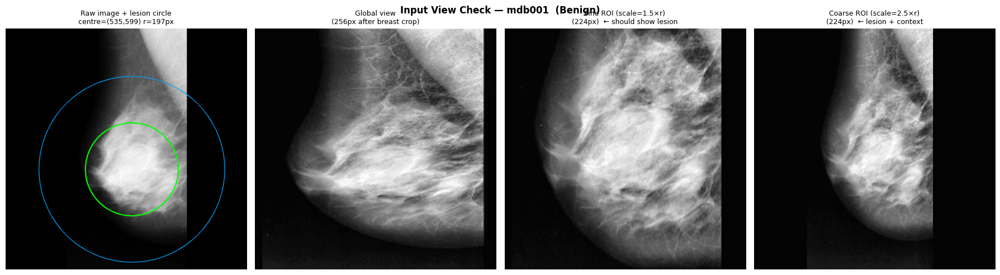

Saved: /content/drive/MyDrive/MaxMammoNet_v4/logs/view_check.png

✅ If fine/coarse crops contain visible lesion tissue → coordinate pipeline OK
❌ If crops look like random background → MIAS_NATIVE_SIZE or y-flip is wrong


In [ ]:
# ── Visual check: do the three views actually show what we expect? ─────────────
# Pick one sample WITH a lesion annotation and verify the crops land on the lesion.

_has_roi = df[df.has_roi == 1].reset_index(drop=True)
if len(_has_roi) == 0:
    print("No samples with ROI annotation — skipping view check")
else:
    _row = _has_roi.iloc[0]
    print(f"Sample: {_row.image_id}  cancer={_row.cancer}  "
          f"lesion_x={_row.lesion_x:.0f}  lesion_y={_row.lesion_y:.0f}  "
          f"r={_row.lesion_radius:.0f}")

    _raw = cv2.imread(str(_row.filepath), cv2.IMREAD_GRAYSCALE)
    _h, _w = _raw.shape
    print(f"Image size: {_w}×{_h}  (MIAS native: {MIAS_NATIVE_SIZE})")

    # Compute expected lesion centre in pixel coords for annotation
    _sx, _sy = _w / MIAS_NATIVE_SIZE, _h / MIAS_NATIVE_SIZE
    _cx_px   = int(_row.lesion_x * _sx)
    _cy_px   = int(_h - _row.lesion_y * _sy)
    _r_px    = int(_row.lesion_radius * (_sx + _sy) / 2)

    # Draw circle on raw image
    _annotated = cv2.cvtColor(_raw, cv2.COLOR_GRAY2BGR)
    cv2.circle(_annotated, (_cx_px, _cy_px), _r_px,    (0, 255,   0), 3)
    cv2.circle(_annotated, (_cx_px, _cy_px), _r_px*2,  (255, 165, 0), 2)

    # Get the three crops
    _ds_vis = MIASDataset(_has_roi.head(1), CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
                          train_mode=False)
    _g_raw, _lf_raw, _lc_raw = _ds_vis._load_views(_row, return_raw=True)

    fig, axes = plt.subplots(1, 4, figsize=(18, 5))
    axes[0].imshow(cv2.cvtColor(_annotated, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Raw image + lesion circle\n"
                      f"centre=({_cx_px},{_cy_px}) r={_r_px}px", fontsize=9)
    axes[1].imshow(_g_raw,  cmap='gray')
    axes[1].set_title(f"Global view\n({CFG.GLOBAL_SIZE}px after breast crop)", fontsize=9)
    axes[2].imshow(_lf_raw, cmap='gray')
    axes[2].set_title(f"Fine ROI (scale={CFG.ROI_SCALE_FINE}×r)\n"
                      f"({CFG.LOCAL_SIZE}px)  ← should show lesion", fontsize=9)
    axes[3].imshow(_lc_raw, cmap='gray')
    axes[3].set_title(f"Coarse ROI (scale={CFG.ROI_SCALE_COARSE}×r)\n"
                      f"({CFG.LOCAL_SIZE}px)  ← lesion + context", fontsize=9)
    for ax in axes: ax.axis('off')
    plt.suptitle(f"Input View Check — {_row.image_id}  "
                 f"({'Malignant' if _row.cancer else 'Benign'})",
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    _vp = str(CFG.LOG_DIR / 'view_check.png')
    plt.savefig(_vp, dpi=120, bbox_inches='tight')
    plt.show()
    print(f"Saved: {_vp}")
    print()
    print("✅ If fine/coarse crops contain visible lesion tissue → coordinate pipeline OK")
    print("❌ If crops look like random background → MIAS_NATIVE_SIZE or y-flip is wrong")
    del _ds_vis, _g_raw, _lf_raw, _lc_raw

## Cell 10 — Augmentation Pipeline (v4 — Medically Conservative)

In [ ]:
# ImageNet normalisation
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]


def get_global_train_transforms(sz: int):
    """
    Global breast augmentations.
    Kept moderate — global view needs position invariance but not extreme distortion.
    GridDistortion / ElasticTransform removed vs v3 — they can distort breast boundary.
    """
    return A.Compose([
        A.HorizontalFlip(p=0.50),
        A.ShiftScaleRotate(
            shift_limit=0.05, scale_limit=0.10, rotate_limit=10,
            border_mode=cv2.BORDER_CONSTANT, value=0, p=0.50
        ),
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.12, contrast_limit=0.18, p=1.0),
            A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1.0),
        ], p=0.40),
        A.GaussNoise(var_limit=(2, 12), p=0.15),
        A.GaussianBlur(blur_limit=(3, 5), p=0.08),
        A.CoarseDropout(max_holes=3, max_height=sz//18, max_width=sz//18,
                        fill_value=0, p=0.10),
        A.Normalize(mean=MEAN, std=STD, max_pixel_value=255.0),
        ToTensorV2(),
    ])


def get_local_train_transforms(sz: int):
    """
    Local lesion augmentations.
    Minimal distortion — must preserve lesion morphology for precision.
    """
    return A.Compose([
        A.HorizontalFlip(p=0.50),
        A.ShiftScaleRotate(
            shift_limit=0.03, scale_limit=0.06, rotate_limit=8,
            border_mode=cv2.BORDER_CONSTANT, value=0, p=0.40
        ),
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.10, contrast_limit=0.12, p=1.0),
            A.CLAHE(clip_limit=3.0, tile_grid_size=(8, 8), p=1.0),
        ], p=0.35),
        A.GaussNoise(var_limit=(1, 8), p=0.12),
        A.Normalize(mean=MEAN, std=STD, max_pixel_value=255.0),
        ToTensorV2(),
    ])


def get_val_transforms(sz: int):
    """Validation: normalise only."""
    return A.Compose([
        A.Normalize(mean=MEAN, std=STD, max_pixel_value=255.0),
        ToTensorV2(),
    ])


def _center_zoom_tensor(imgs: torch.Tensor, frac: float = 0.92) -> torch.Tensor:
    """Centre-crop + resize back (used in 4-way TTA)."""
    if frac >= 1.0:
        return imgs
    h, w   = imgs.shape[-2:]
    nh, nw = max(int(h * frac), 8), max(int(w * frac), 8)
    y0, x0 = (h - nh) // 2, (w - nw) // 2
    crop   = imgs[:, :, y0:y0 + nh, x0:x0 + nw]
    return F.interpolate(crop, size=(h, w), mode='bilinear', align_corners=False)


def apply_tta_triple(g: torch.Tensor, lf: torch.Tensor,
                     lc: torch.Tensor, idx: int) -> tuple:
    """
    4-way TTA (v4 — reduced from 8):
      0: original
      1: horizontal flip  (mammography: breast can face either way)
      2: centre zoom 90%  (scale invariance)
      3: zoom + H-flip    (combined)

    Rotation dropped: 90°/270° rot is not medically valid for mammography.
    """
    if idx == 0:
        return g, lf, lc
    if idx == 1:
        return torch.flip(g, [-1]), torch.flip(lf, [-1]), torch.flip(lc, [-1])
    if idx == 2:
        return (_center_zoom_tensor(g,  0.90),
                _center_zoom_tensor(lf, 0.90),
                _center_zoom_tensor(lc, 0.90))
    # idx == 3: zoom + flip
    zg  = _center_zoom_tensor(g,  0.90)
    zlf = _center_zoom_tensor(lf, 0.90)
    zlc = _center_zoom_tensor(lc, 0.90)
    return torch.flip(zg, [-1]), torch.flip(zlf, [-1]), torch.flip(zlc, [-1])


# Sanity
_ds = MIASDataset(df.head(2), CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
                   get_global_train_transforms(CFG.GLOBAL_SIZE),
                   get_local_train_transforms(CFG.LOCAL_SIZE),
                   train_mode=True)
_g, _lf, _lc, _, _ = _ds[0]
print(f'Augmented tensors: global={tuple(_g.shape)} fine={tuple(_lf.shape)} coarse={tuple(_lc.shape)}  ✅')
del _ds, _g, _lf, _lc
print('✅ Augmentation pipeline OK')

Augmented tensors: global=(3, 256, 256) fine=(3, 224, 224) coarse=(3, 224, 224)  ✅
✅ Augmentation pipeline OK


## Cell 11 — MaxMammoNet v4 Architecture

```
Global (256px) ──► ConvNeXt-small ──► GeM pool  ──► cnn_feat (768d)
                                                            │
Local Fine (224px) ──► Swin-tiny ──► avg pool ──► vit_fine (768d)
                                                            │
Local Coarse (224px) ──► Swin-tiny (shared) ──► vit_coarse (768d)
                                                            │
                   CrossAttention (CNN × fine) ◄────────────┘
                              │
                   SE-Gated TriView Fusion ◄── [cnn, vit_fine, vit_coarse]
                              │
                   MLP head ──► logit (+ aux CNN + aux ViT)
```

**SE block**: channel-wise recalibration — lets network suppress uninformative features.  
**Shared Swin**: fine + coarse views processed by same backbone → no extra params.  
**TriViewFusion**: learnable 3-way softmax gate — adapts per-sample (clear ROI vs no-ROI).  
**GeM pooling**: p=3 amplifies high-activation (lesion) pixels vs diffuse background.

In [ ]:
def _create_backbone(primary: str, fallbacks: list, pretrained: bool, **kwargs):
    """Try primary backbone, fall back on failure."""
    for name in [primary] + fallbacks:
        try:
            m = timm.create_model(name, pretrained=pretrained, **kwargs)
            print(f'  Loaded backbone: {name}  (pretrained={pretrained})')
            return m, name
        except Exception as e:
            print(f'  Skip {name}: {type(e).__name__}')
    raise RuntimeError('No backbone could be loaded — check internet and timm version')


# ── Pooling ───────────────────────────────────────────────────────────────────

class GeM(nn.Module):
    """
    Generalised Mean Pooling  (Radenovic et al. 2019)
    p=3 emphasises high-activation (lesion) pixels over background.
    """
    def __init__(self, p: float = 3.0, eps: float = 1e-6):
        super().__init__()
        self.p   = nn.Parameter(torch.ones(1) * p)
        self.eps = eps

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return (
            F.adaptive_avg_pool2d(x.clamp(min=self.eps).pow(self.p), 1)
            .pow(1.0 / self.p)
            .flatten(1)
        )


# ── Attention ─────────────────────────────────────────────────────────────────

class SEBlock(nn.Module):
    """
    Squeeze-and-Excitation channel attention (Hu et al. 2018).
    Applied to fused feature vector — suppresses non-lesion channels.
    """
    def __init__(self, channels: int, reduction: int = 16):
        super().__init__()
        mid = max(channels // reduction, 8)
        self.fc = nn.Sequential(
            nn.Linear(channels, mid, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(mid, channels, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return x * self.fc(x)


class CrossAttentionFusion(nn.Module):
    """
    Single-head cross-attention: CNN feat (Q) attends to ViT feat (K, V).
    Pulls fine lesion context from ViT into the global CNN representation.
    """
    def __init__(self, cnn_dim: int, vit_dim: int, attn_dim: int = 256):
        super().__init__()
        self.q     = nn.Linear(cnn_dim, attn_dim)
        self.k     = nn.Linear(vit_dim,  attn_dim)
        self.v     = nn.Linear(vit_dim,  attn_dim)
        self.proj  = nn.Linear(attn_dim, cnn_dim)
        self.norm  = nn.LayerNorm(cnn_dim)
        self.scale = attn_dim ** -0.5
        nn.init.xavier_uniform_(self.proj.weight)
        nn.init.zeros_(self.proj.bias)

    def forward(self, cnn_feat: torch.Tensor, vit_feat: torch.Tensor) -> torch.Tensor:
        q    = self.q(cnn_feat).unsqueeze(1)
        k    = self.k(vit_feat).unsqueeze(1)
        v    = self.v(vit_feat).unsqueeze(1)
        attn = torch.softmax((q @ k.transpose(-2, -1)) * self.scale, dim=-1)
        out  = self.proj((attn @ v).squeeze(1))
        return self.norm(cnn_feat + out)


class TriViewFusion(nn.Module):
    """
    SE-gated tri-branch fusion head.

    Fuses: cnn_feat (global) + vit_fine (tight lesion) + vit_coarse (context)
    Gate: learnable 3-way softmax — routes attention per-sample
    SE:   channel-wise recalibration of the concatenated feature

    BUG FIX v4.1: The original used self.norm for both the pre-SE normalisation
    and the post-gating normalisation. Shared LayerNorm parameters on two
    structurally different tensors causes gradient interference. Added self.norm2
    as a separate LayerNorm for the gated representation.
    """
    def __init__(self, cnn_dim: int, vit_dim: int,
                  hidden: int = 320, drop: float = 0.40):
        super().__init__()
        in_dim     = cnn_dim + vit_dim * 2
        self.norm  = nn.LayerNorm(in_dim)   # used before SE gate
        self.norm2 = nn.LayerNorm(in_dim)   # BUG FIX: separate norm after gating
        self.se    = SEBlock(in_dim, reduction=16)
        # 3-way gate: global / fine-local / coarse-local
        self.gate  = nn.Sequential(nn.Linear(in_dim, 3), nn.Softmax(dim=1))
        self.fc    = nn.Sequential(
            nn.Linear(in_dim, hidden),
            nn.LayerNorm(hidden),
            nn.GELU(),
            nn.Dropout(drop),
            nn.Linear(hidden, 128),
            nn.GELU(),
            nn.Dropout(drop * 0.6),
        )
        self.out   = nn.Linear(128, 1)

    def forward(self, cnn_feat: torch.Tensor,
                vit_fine: torch.Tensor,
                vit_coarse: torch.Tensor) -> torch.Tensor:
        fused = torch.cat([cnn_feat, vit_fine, vit_coarse], dim=1)
        norm  = self.norm(fused)              # pre-SE normalisation
        norm  = self.se(norm)                 # SE recalibration
        w     = self.gate(norm)               # (B, 3) branch weights
        gated = torch.cat([
            cnn_feat   * w[:, :1],
            vit_fine   * w[:, 1:2],
            vit_coarse * w[:, 2:3]
        ], dim=1)
        return self.out(self.fc(self.norm2(gated))).squeeze(-1)  # (B,)


# ── MaxMammoNet v4 ────────────────────────────────────────────────────────────

class MaxMammoNet(nn.Module):
    """
    Tri-view dual-backbone network.

    Branches:
      CNN (ConvNeXt): processes global breast view
      ViT (Swin):     SHARED — processes both fine AND coarse lesion crops

    Fusion: CrossAttention (CNN × fine) → SE-gated TriViewFusion
    """
    def __init__(self):
        super().__init__()

        self.cnn, self.cnn_name = _create_backbone(
            CFG.CNN_BACKBONE, CFG.CNN_FALLBACKS,
            CFG.PRETRAINED, features_only=True
        )
        self.vit, self.vit_name = _create_backbone(
            CFG.VIT_BACKBONE, CFG.VIT_FALLBACKS,
            CFG.PRETRAINED, num_classes=0, global_pool='avg'
        )

        if CFG.GRAD_CHECKPOINT:
            for m in [self.cnn, self.vit]:
                try:
                    m.set_grad_checkpointing(True)
                except AttributeError:
                    pass

        # Auto-detect CNN output dim
        with torch.no_grad():
            _d    = torch.zeros(1, 3, CFG.GLOBAL_SIZE, CFG.GLOBAL_SIZE)
            _maps = self.cnn(_d)
            _last = _maps[-1]
            if _last.ndim == 4 and _last.shape[1] < _last.shape[-1]:
                _last = _last.permute(0, 3, 1, 2)
            self.cnn_dim = _last.shape[1]
            del _d, _maps, _last

        self.vit_dim = self.vit.num_features

        # Modules
        self.cnn_gem    = GeM()
        self.cross_attn = CrossAttentionFusion(self.cnn_dim, self.vit_dim, attn_dim=256)
        self.head       = TriViewFusion(self.cnn_dim, self.vit_dim, hidden=320, drop=0.40)
        self.aux_cnn    = nn.Linear(self.cnn_dim, 1)
        self.aux_vit    = nn.Linear(self.vit_dim, 1)

        self._init_heads()
        params = sum(p.numel() for p in self.parameters()) / 1e6
        print(f'  CNN: {self.cnn_name} ({self.cnn_dim}d)')
        print(f'  ViT: {self.vit_name} ({self.vit_dim}d)  [shared for fine+coarse]')
        print(f'  Total params: {params:.1f}M')

    def _init_heads(self):
        for m in [self.head, self.cross_attn, self.aux_cnn, self.aux_vit]:
            for layer in m.modules():
                if isinstance(layer, nn.Linear):
                    nn.init.xavier_uniform_(layer.weight)
                    if layer.bias is not None:
                        nn.init.zeros_(layer.bias)

    def set_backbones_trainable(self, flag: bool):
        for p in self.cnn.parameters(): p.requires_grad = flag
        for p in self.vit.parameters(): p.requires_grad = flag

    def get_param_groups(self) -> list:
        """Differential LRs: backbone < head."""
        head_params = (
            list(self.cnn_gem.parameters()) +
            list(self.cross_attn.parameters()) +
            list(self.head.parameters()) +
            list(self.aux_cnn.parameters()) +
            list(self.aux_vit.parameters())
        )
        return [
            {'params': self.cnn.parameters(), 'lr': CFG.LR * 0.40},
            {'params': self.vit.parameters(), 'lr': CFG.LR * 0.30},
            {'params': head_params,           'lr': CFG.LR},
        ]

    def _encode_cnn(self, x: torch.Tensor) -> torch.Tensor:
        maps = self.cnn(x)
        feat = maps[-1]
        if feat.ndim == 4 and feat.shape[1] < feat.shape[-1]:
            feat = feat.permute(0, 3, 1, 2).contiguous()
        return self.cnn_gem(feat)

    def forward(self, global_x: torch.Tensor,
                local_fine:   torch.Tensor,
                local_coarse: torch.Tensor = None):
        if local_coarse is None:
            local_coarse = local_fine

        cnn_feat   = self._encode_cnn(global_x)             # (B, cnn_dim)
        vit_fine   = self.vit(local_fine)                    # (B, vit_dim)
        vit_coarse = self.vit(local_coarse)                  # (B, vit_dim) shared

        cnn_feat   = self.cross_attn(cnn_feat, vit_fine)    # absorb fine context
        logit      = self.head(cnn_feat, vit_fine, vit_coarse)

        aux = 0.5 * (self.aux_cnn(cnn_feat).squeeze(-1) +
                     self.aux_vit(vit_fine).squeeze(-1))
        return logit, aux


print('✅ MaxMammoNet v4 defined')

# Pre-flight
_m  = MaxMammoNet().to(DEVICE)
_g  = torch.randn(2, 3, CFG.GLOBAL_SIZE, CFG.GLOBAL_SIZE).to(DEVICE)
_lf = torch.randn(2, 3, CFG.LOCAL_SIZE,  CFG.LOCAL_SIZE).to(DEVICE)
_lc = torch.randn(2, 3, CFG.LOCAL_SIZE,  CFG.LOCAL_SIZE).to(DEVICE)
with torch.no_grad():
    _lg, _ax = _m(_g, _lf, _lc)
assert _lg.shape == (2,) and _ax.shape == (2,)
print(f'Forward pass: logit={tuple(_lg.shape)} aux={tuple(_ax.shape)}  ✅')
del _m, _g, _lf, _lc, _lg, _ax
gc.collect(); torch.cuda.empty_cache()

✅ MaxMammoNet v4 defined


model.safetensors:   0%|          | 0.00/201M [00:00<?, ?B/s]

  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M
Forward pass: logit=(2,) aux=(2,)  ✅


## Cell 12 — Loss Functions & EMA

In [ ]:
# ── Focal BCE Loss (v4: alpha=0.80, label_smooth=0.05) ────────────────────────

class FocalBCELoss(nn.Module):
    """
    Focal Binary Cross-Entropy with label smoothing.

    FL(p_t) = -alpha_t * (1 - p_t)^gamma * log(p_t)

    v4 changes vs v3:
      alpha=0.80  (was 0.75) — stronger malignant emphasis
      label_smooth=0.05 (was 0.08) — less smoothing for sharper decisions
    """
    def __init__(self, gamma: float = 2.0, alpha: float = 0.80,
                  label_smooth: float = 0.05):
        super().__init__()
        self.gamma        = gamma
        self.alpha        = alpha
        self.label_smooth = label_smooth

    def forward(self, logits: torch.Tensor,
                targets: torch.Tensor) -> torch.Tensor:
        targets_s = targets * (1 - self.label_smooth) + 0.5 * self.label_smooth
        bce       = F.binary_cross_entropy_with_logits(
            logits, targets_s, reduction='none'
        )
        probs = torch.sigmoid(logits)
        p_t   = probs * targets + (1 - probs) * (1 - targets)
        fl    = (1 - p_t) ** self.gamma * bce
        at    = self.alpha * targets + (1 - self.alpha) * (1 - targets)
        return (at * fl).mean()


# ── EMA (unchanged from v3) ───────────────────────────────────────────────────

class EMA:
    """Exponential Moving Average — free ensemble over recent update steps."""
    def __init__(self, model: nn.Module, decay: float = 0.9998):
        self.decay   = decay
        self.shadow  = {k: v.detach().float().clone()
                        for k, v in model.state_dict().items()}
        self._backup = {}

    def update(self, model: nn.Module):
        with torch.no_grad():
            for k, v in model.state_dict().items():
                self.shadow[k] = (self.decay * self.shadow[k] +
                                  (1 - self.decay) * v.detach().float())

    def apply_shadow(self, model: nn.Module):
        self._backup = {k: v.clone() for k, v in model.state_dict().items()}
        sd = {k: v.to(self._backup[k].dtype) for k, v in self.shadow.items()}
        model.load_state_dict(sd, strict=False)

    def restore(self, model: nn.Module):
        model.load_state_dict(self._backup, strict=False)

    def state_dict(self):
        return {k: v.cpu() for k, v in self.shadow.items()}

    def load_state_dict(self, sd: dict):
        self.shadow = {k: v.float() for k, v in sd.items()}


# Quick test
_m   = MaxMammoNet().to(DEVICE)
_ema = EMA(_m, decay=CFG.EMA_DECAY)
_lf  = torch.randn(2, 3, CFG.LOCAL_SIZE,  CFG.LOCAL_SIZE).to(DEVICE)
_lc  = torch.randn(2, 3, CFG.LOCAL_SIZE,  CFG.LOCAL_SIZE).to(DEVICE)
_lg, _ax = _m(torch.randn(2, 3, CFG.GLOBAL_SIZE, CFG.GLOBAL_SIZE).to(DEVICE), _lf, _lc)
loss_fn  = FocalBCELoss(gamma=CFG.FOCAL_GAMMA, alpha=CFG.FOCAL_ALPHA,
                         label_smooth=CFG.LABEL_SMOOTH)
_lbl  = torch.tensor([0.0, 1.0]).to(DEVICE)
_loss = loss_fn(_lg, _lbl)
_loss.backward()
_ema.update(_m)
_ema.apply_shadow(_m)
_ema.restore(_m)
print(f'FocalBCELoss test: {_loss.item():.4f}  ✅')
del _m, _ema, _lg, _ax, _loss, _lbl, _lf, _lc
gc.collect(); torch.cuda.empty_cache()
print('✅ Loss & EMA OK')

  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M
FocalBCELoss test: 0.0911  ✅
✅ Loss & EMA OK


## Cell 13 — Metrics (v4 — precision_recall_curve + Precision Bias)

### Why precision_recall_curve over grid sweep?
- **More principled**: uses the PR curve directly rather than 401-point grid
- **Precision bias**: shifts threshold slightly upward from pure F1-max
  → trades a little recall for higher precision → reduces false positives
- `PRECISION_BIAS = 0.08` shifts the operating point ~8% up the threshold axis

In [ ]:
def compute_metrics(labels: np.ndarray, probs: np.ndarray,
                    precision_bias: float = CFG.PRECISION_BIAS) -> dict:
    """
    Find optimal threshold via precision_recall_curve with precision bias.

    precision_bias > 0 → bias toward precision (fewer false positives).
    precision_bias = 0 → pure F1-maximising threshold.

    BUG FIX v4.1: sklearn precision_recall_curve returns prec/rec of length
    (n+1) but thr of length (n). The last prec/rec point is the (1.0, 0.0)
    edge case with no corresponding threshold. The original code computed
    f1_arr over all n+1 points and used min(best_idx, n-1) to clamp —
    but if best_idx == n, the clamped index returns the highest threshold
    (predict nothing positive). Now we drop the edge case first so f1_arr
    and thr_arr are always the same length and indexing is always valid.

    Returns:
      auc, f1, acc, bal_acc, recall, precision, threshold
    """
    if len(np.unique(labels)) < 2:
        auc = 0.5
    else:
        try:
            auc = roc_auc_score(labels, probs)
        except ValueError:
            auc = 0.5

    # sklearn: prec (n+1,), rec (n+1,), thr (n,)
    prec_arr, rec_arr, thr_arr = precision_recall_curve(labels, probs)

    # Drop the terminal edge-case point (prec=1, rec=0, no threshold).
    # Now prec_arr_v / rec_arr_v / thr_arr have the same length n.
    prec_arr_v = prec_arr[:-1]
    rec_arr_v  = rec_arr[:-1]

    # F1 at every threshold — aligned 1:1 with thr_arr
    f1_arr = (2 * prec_arr_v * rec_arr_v /
               np.clip(prec_arr_v + rec_arr_v, 1e-8, None))

    best_idx    = int(np.argmax(f1_arr))
    best_f1     = float(f1_arr[best_idx])
    best_thresh = float(thr_arr[best_idx])   # always valid — same length now

    # Precision bias: among thresholds with acceptable F1, pick highest precision
    if precision_bias > 0.0 and len(thr_arr) > 1:
        min_f1 = best_f1 * (1.0 - precision_bias)
        viable = np.where(f1_arr >= min_f1)[0]
        if len(viable) > 0:
            best_prec_idx = viable[int(np.argmax(prec_arr_v[viable]))]
            best_thresh   = float(thr_arr[best_prec_idx])
            best_f1       = float(f1_arr[best_prec_idx])

    preds     = (probs >= best_thresh).astype(int)
    acc       = accuracy_score(labels, preds)
    bal_acc   = balanced_accuracy_score(labels, preds)
    recall    = recall_score(labels, preds, zero_division=0)
    precision = precision_score(labels, preds, zero_division=0)

    return {
        'auc'      : float(auc),
        'f1'       : float(best_f1),
        'acc'      : float(acc),
        'bal_acc'  : float(bal_acc),
        'recall'   : float(recall),
        'precision': float(precision),
        'threshold': float(best_thresh),
    }


# Test — verify alignment fix works correctly
_lbls = np.array([0, 0, 1, 1, 0, 1, 0, 1])
_prbs = np.array([0.1, 0.35, 0.7, 0.85, 0.4, 0.6, 0.25, 0.9])
_m    = compute_metrics(_lbls, _prbs)
print(f'Metrics test: AUC={_m["auc"]:.3f}  F1={_m["f1"]:.3f}  '
      f'Prec={_m["precision"]:.3f}  Rec={_m["recall"]:.3f}  '
      f'Thr={_m["threshold"]:.3f}  ✅')
# Edge-case: all-same-label (only positives)
_lbl2 = np.array([1, 1, 1, 1, 1])
_prb2 = np.array([0.3, 0.5, 0.7, 0.8, 0.9])
_m2   = compute_metrics(_lbl2, _prb2)
print(f'Edge-case test (all pos): AUC={_m2["auc"]:.3f}  Thr={_m2["threshold"]:.3f}  ✅')
print('✅ compute_metrics OK')

Metrics test: AUC=1.000  F1=1.000  Prec=1.000  Rec=1.000  Thr=0.600  ✅
Edge-case test (all pos): AUC=0.500  Thr=0.300  ✅
✅ compute_metrics OK


## Cell 14 — Train / Validation Loops (v4 — HNM + 4-way TTA)

Key changes vs v3:
- All dataset tuples unpacked as `(g, lf, lc, labels, ids)` — 5-tuple
- Model called as `model(g, lf, lc)` — tri-view
- `val_epoch` returns `image_ids` for Hard Negative Mining
- TTA uses `apply_tta_triple` (4-way only)

In [ ]:
def mixup_batch(g_imgs, lf_imgs, lc_imgs, labels, alpha=0.20):
    """MixUp — reduced prob in v4 to preserve lesion structure."""
    lam      = np.random.beta(alpha, alpha)
    B        = g_imgs.size(0)
    idx      = torch.randperm(B, device=g_imgs.device)
    g_mixed  = lam * g_imgs  + (1 - lam) * g_imgs[idx]
    lf_mixed = lam * lf_imgs + (1 - lam) * lf_imgs[idx]
    lc_mixed = lam * lc_imgs + (1 - lam) * lc_imgs[idx]
    lbl_mix  = lam * labels  + (1 - lam) * labels[idx]
    return g_mixed, lf_mixed, lc_mixed, lbl_mix


def _optimizer_step(scaler, optimizer, model, scheduler, ema, scale=1.0):
    """Single combined optimizer step. scale adjusts grad norm clip."""
    scaler.unscale_(optimizer)
    nn.utils.clip_grad_norm_(model.parameters(), CFG.GRAD_CLIP * scale)
    scaler.step(optimizer)
    scaler.update()
    optimizer.zero_grad()
    scheduler.step()
    if ema is not None:
        ema.update(model)


def train_epoch(model: nn.Module, ema,
                loader: DataLoader,
                optimizer: torch.optim.Optimizer,
                scaler: GradScaler,
                scheduler) -> float:
    """Single training epoch: AMP + grad accum + MixUp + Focal + EMA.

    BUG FIX v4.1: Added end-of-epoch flush for leftover accumulated gradients.
    When len(loader) % GRAD_ACCUM_STEPS != 0, the last partial accumulation
    previously computed a backward pass but never called scaler.step() —
    those gradients were silently discarded at the next epoch's zero_grad().
    """
    model.train()
    criterion_focal = FocalBCELoss(gamma=CFG.FOCAL_GAMMA, alpha=CFG.FOCAL_ALPHA,
                                    label_smooth=CFG.LABEL_SMOOTH)
    pos_weight = torch.tensor([CFG.POS_WEIGHT]).to(DEVICE)
    losses     = []
    optimizer.zero_grad()
    bar = tqdm(enumerate(loader), total=len(loader), desc='Train', leave=False)

    accumulated = 0  # track how many micro-batches have been accumulated

    for step, (g_imgs, lf_imgs, lc_imgs, labels, _) in bar:
        g_imgs  = g_imgs.to(DEVICE, non_blocking=True)
        lf_imgs = lf_imgs.to(DEVICE, non_blocking=True)
        lc_imgs = lc_imgs.to(DEVICE, non_blocking=True)
        labels  = labels.to(DEVICE, non_blocking=True)

        # MixUp (reduced prob in v4)
        if random.random() < CFG.MIXUP_PROB:
            g_imgs, lf_imgs, lc_imgs, labels = mixup_batch(
                g_imgs, lf_imgs, lc_imgs, labels, CFG.MIXUP_ALPHA
            )

        with autocast(enabled=CFG.USE_AMP):
            logits, aux = model(g_imgs, lf_imgs, lc_imgs)
            loss_main   = criterion_focal(logits, labels)
            loss_aux    = F.binary_cross_entropy_with_logits(
                aux, labels, pos_weight=pos_weight
            )
            loss = (loss_main + CFG.AUX_WEIGHT * loss_aux) / CFG.GRAD_ACCUM_STEPS

        scaler.scale(loss).backward()
        accumulated += 1

        if (step + 1) % CFG.GRAD_ACCUM_STEPS == 0:
            _optimizer_step(scaler, optimizer, model, scheduler, ema)
            accumulated = 0

        losses.append(loss.item() * CFG.GRAD_ACCUM_STEPS)
        bar.set_postfix(loss=f'{np.mean(losses[-10:]):.4f}',
                         lr=f'{optimizer.param_groups[-1]["lr"]:.1e}')

    # BUG FIX: flush any leftover accumulated gradients at epoch end.
    # Without this, the last partial accumulation is silently discarded.
    if accumulated > 0:
        # Scale clip proportionally to number of micro-batches actually accumulated
        _optimizer_step(scaler, optimizer, model, scheduler, ema,
                        scale=accumulated / CFG.GRAD_ACCUM_STEPS)

    return float(np.mean(losses))


@torch.inference_mode()
def val_epoch(model: nn.Module,
              loader: DataLoader,
              use_tta: bool = False) -> tuple:
    """
    Validation epoch.
    Returns (metrics_dict, probs_array, labels_array, image_ids_list).
    image_ids returned for HNM weight update.
    """
    model.eval()
    preds_all, labels_all, ids_all = [], [], []

    for g_imgs, lf_imgs, lc_imgs, labels, ids in tqdm(loader, desc='Val  ', leave=False):
        g_imgs  = g_imgs.to(DEVICE, non_blocking=True)
        lf_imgs = lf_imgs.to(DEVICE, non_blocking=True)
        lc_imgs = lc_imgs.to(DEVICE, non_blocking=True)

        if use_tta:
            tta_probs = []
            for ti in range(CFG.TTA_N):
                g_t, lf_t, lc_t = apply_tta_triple(g_imgs, lf_imgs, lc_imgs, ti)
                with autocast(enabled=CFG.USE_AMP):
                    lg, _ = model(g_t, lf_t, lc_t)
                tta_probs.append(torch.sigmoid(lg).cpu().float().numpy())
            p = np.mean(tta_probs, axis=0)
        else:
            with autocast(enabled=CFG.USE_AMP):
                lg, _ = model(g_imgs, lf_imgs, lc_imgs)
            p = torch.sigmoid(lg).cpu().float().numpy()

        preds_all.extend(p)
        labels_all.extend(labels.numpy())
        ids_all.extend(list(ids))

    p_arr = np.array(preds_all)
    l_arr = np.array(labels_all)
    metrics = compute_metrics(l_arr, p_arr)

    tta_str = f' TTA×{CFG.TTA_N}' if use_tta else ''
    print(f'  [Val{tta_str}]  '
          f'AUC={metrics["auc"]:.4f}  '
          f'F1={metrics["f1"]:.4f}  '
          f'Recall={metrics["recall"]:.4f}  '
          f'Prec={metrics["precision"]:.4f}  '
          f'Thr={metrics["threshold"]:.3f}  '
          f'p̄={p_arr.mean():.3f}  std={p_arr.std():.3f}')

    return metrics, p_arr, l_arr, ids_all


print('✅ Train/Val loops defined')

✅ Train/Val loops defined


## Cell 15 — Checkpoint Utilities

In [ ]:
def save_ckpt(fold: int, epoch: int, model: nn.Module,
               ema, metrics: dict, history: list) -> Path:
    path    = CFG.OUTPUT_DIR / f'fold{fold}_best.pth'
    payload = {
        'fold'      : fold,
        'epoch'     : epoch,
        'state_dict': model.state_dict(),
        'metrics'   : metrics,
        'auc'       : metrics['auc'],
        'f1'        : metrics['f1'],
        'threshold' : metrics['threshold'],
        'history'   : history,
    }
    if ema is not None:
        payload['ema'] = ema.state_dict()
    torch.save(payload, path)
    return path


def load_ckpt(fold: int):
    path = CFG.OUTPUT_DIR / f'fold{fold}_best.pth'
    if not path.exists():
        return None
    ckpt = torch.load(path, map_location=DEVICE, weights_only=False)
    m    = ckpt.get('metrics', {})
    print(f'  Loaded fold{fold}: '
          f'AUC={m.get("auc", 0):.4f}  '
          f'F1={m.get("f1", 0):.4f}  '
          f'Thr={m.get("threshold", 0.5):.3f}  '
          f'@ ep{ckpt["epoch"]}')
    return ckpt


def log_epoch(fold: int, epoch: int, loss: float,
               metrics: dict, elapsed: float):
    log_path = CFG.LOG_DIR / f'fold{fold}_log.json'
    entry = {
        'epoch': epoch, 'loss': round(loss, 5),
        **{k: round(float(v), 5) for k, v in metrics.items()},
        'time_s': round(elapsed, 1),
    }
    history = []
    if log_path.exists():
        try:
            with open(log_path) as f: history = json.load(f)
        except json.JSONDecodeError: pass
    history.append(entry)
    with open(log_path, 'w') as f: json.dump(history, f, indent=2)


def clear_checkpoints():
    count = 0
    for fold in range(CFG.N_FOLDS):
        for d, ext in [(CFG.OUTPUT_DIR, '.pth'), (CFG.LOG_DIR, '.json')]:
            for p in d.glob(f'fold{fold}*{ext}'):
                p.unlink(); count += 1
    print(f'Deleted {count} checkpoint/log files')


print('✅ Checkpoint utils defined')

✅ Checkpoint utils defined


## Cell 16 — Fold Assignment & train_fold (v4 — 5-Fold + Hard Negative Mining)

### Hard Negative Mining (HNM) strategy
Every `HNM_INTERVAL` epochs, the training set is scored with the current model
(no augmentation, no TTA). **False positives** (benign samples predicted as malignant)
get their sampling weight multiplied by `HNM_BOOST`. The WeightedRandomSampler is
rebuilt with updated weights → subsequent epochs focus more on hard benign cases,
teaching the model to be more conservative (higher precision).

Weight cap `HNM_MAX_WEIGHT` prevents degenerate sampling where one sample
monopolises the batch.

### Why 5-fold?
With ~322 images, 5-fold gives ~65 val samples each with ~4 malignant per fold —
barely enough for stable metrics. 3-fold (v3) gave only ~2–3 val malignant per fold.

In [ ]:
def prepare_folds(df: pd.DataFrame) -> pd.DataFrame:
    """Stratified K-Fold (n=5) by cancer label."""
    skf = StratifiedKFold(n_splits=CFG.N_FOLDS, shuffle=True, random_state=CFG.SEED)
    df  = df.copy()
    df['fold'] = -1
    for fold, (_, val_idx) in enumerate(skf.split(df, df['cancer'])):
        df.loc[val_idx, 'fold'] = fold
    print('Fold distribution:')
    for fold in range(CFG.N_FOLDS):
        sub = df[df.fold == fold]
        print(f'  Fold {fold}: {len(sub)} images  '
              f'({sub.cancer.sum()} malignant, '
              f'{(~sub.cancer.astype(bool)).sum()} other)')
    return df


@torch.inference_mode()
def _score_train_for_hnm(model: nn.Module, train_df: pd.DataFrame,
                           threshold: float) -> list:
    """
    Lightweight inference on training data to find false positives.
    No augmentation, no TTA — just identify hard benign cases.
    Returns list of image_ids that are currently false positives.
    """
    model.eval()
    ds  = MIASDataset(train_df, CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
                       get_val_transforms(CFG.GLOBAL_SIZE),
                       get_val_transforms(CFG.LOCAL_SIZE),
                       train_mode=False)
    dl  = DataLoader(ds, batch_size=32, shuffle=False,
                      num_workers=0, pin_memory=True)
    fp_ids = []
    for g, lf, lc, labels, ids in dl:
        g  = g.to(DEVICE, non_blocking=True)
        lf = lf.to(DEVICE, non_blocking=True)
        lc = lc.to(DEVICE, non_blocking=True)
        with autocast(enabled=CFG.USE_AMP):
            lg, _ = model(g, lf, lc)
        probs  = torch.sigmoid(lg).cpu().float().numpy()
        labels = labels.numpy()
        # False positives: benign (label=0) but predicted malignant (prob≥threshold)
        for prob, lbl, iid in zip(probs, labels, ids):
            if lbl == 0 and prob >= threshold:
                fp_ids.append(str(iid))
    return fp_ids


def train_fold(df: pd.DataFrame, fold: int) -> tuple:
    """
    Full training loop for one fold with Hard Negative Mining.

    Phase 1 (0..FREEZE_EPOCHS):   head only, backbones frozen
    Phase 2 (FREEZE_EPOCHS..END): end-to-end, differential LR
    HNM:  every HNM_INTERVAL epochs, rescore train set → update sampler
    Checkpoint: by F1 primary, AUC tiebreaker (precision-focused)
    """
    existing = load_ckpt(fold)
    if existing is not None:
        print(f'  ↩  Fold {fold} already complete — skipping.')
        return existing.get('metrics', {}), existing.get('history', [])

    print()
    print('=' * 72)
    print(f'  FOLD {fold}  |  epochs={CFG.EPOCHS}  |  '
          f'freeze={CFG.FREEZE_EPOCHS}  |  '
          f'patience={CFG.PATIENCE}  |  '
          f'HNM every {CFG.HNM_INTERVAL} ep')
    print('=' * 72)
    t_fold = time.time()

    train_df = df[df.fold != fold].reset_index(drop=True)
    val_df   = df[df.fold == fold].reset_index(drop=True)
    print(f'  Train: {len(train_df)} '
          f'(+:{train_df.cancer.sum()} -:{(~train_df.cancer.astype(bool)).sum()})  '
          f'| Val: {len(val_df)} '
          f'(+:{val_df.cancer.sum()} -:{(~val_df.cancer.astype(bool)).sum()})')

    # HNM weight tracking (image_id → multiplier, init 1.0)
    hnm_weights = {str(iid): 1.0 for iid in train_df['image_id']}

    lkw = dict(num_workers=CFG.NUM_WORKERS, pin_memory=True,
                persistent_workers=(CFG.NUM_WORKERS > 0 and CFG.PERSISTENT_WORKERS))

    def _make_train_loader(hnm_w=None):
        sampler = make_sampler(train_df, hnm_w)
        return DataLoader(
            MIASDataset(train_df, CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
                         get_global_train_transforms(CFG.GLOBAL_SIZE),
                         get_local_train_transforms(CFG.LOCAL_SIZE),
                         train_mode=True),
            batch_size=CFG.BATCH_SIZE,
            sampler=sampler, drop_last=True, **lkw
        )

    tr_ld = _make_train_loader(None)

    va_ld = DataLoader(
        MIASDataset(val_df, CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
                     get_val_transforms(CFG.GLOBAL_SIZE),
                     get_val_transforms(CFG.LOCAL_SIZE),
                     train_mode=False),
        batch_size=32, shuffle=False, **lkw
    )

    model = MaxMammoNet().to(DEVICE)
    ema   = EMA(model, decay=CFG.EMA_DECAY) if CFG.USE_EMA else None
    model.set_backbones_trainable(False)   # Phase 1

    optimizer = torch.optim.AdamW(
        model.get_param_groups(),
        betas=(0.9, 0.999), eps=1e-8,
        weight_decay=CFG.WEIGHT_DECAY
    )
    steps_per_epoch = max(1, len(tr_ld) // CFG.GRAD_ACCUM_STEPS)
    warmup_steps    = CFG.WARMUP_EPOCHS * steps_per_epoch
    total_steps     = CFG.EPOCHS       * steps_per_epoch

    def lr_lambda(step: int) -> float:
        if step < warmup_steps:
            return max(step / max(warmup_steps, 1), 1e-3)
        prog = (step - warmup_steps) / max(total_steps - warmup_steps, 1)
        return 0.5 * (1 + math.cos(math.pi * prog))

    scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)
    scaler    = GradScaler(enabled=CFG.USE_AMP)

    # v4: primary sort key = F1 (precision-focused), secondary = AUC
    best_metrics = {'auc': 0.0, 'f1': 0.0, 'acc': 0.0,
                    'threshold': 0.5, 'bal_acc': 0.0,
                    'recall': 0.0, 'precision': 0.0}
    best_epoch   = 0
    no_improve   = 0
    history      = []
    current_thr  = 0.5  # track threshold for HNM

    for epoch in range(CFG.EPOCHS):
        ep_t = time.time()

        # Phase 2: unfreeze backbones
        if epoch == CFG.FREEZE_EPOCHS:
            model.set_backbones_trainable(True)
            print('  ▶  Backbones unfrozen (phase 2)')

        # ── Hard Negative Mining update ────────────────────────────────────────
        if epoch > 0 and epoch % CFG.HNM_INTERVAL == 0:
            print(f'  [HNM] Scoring training set @ ep{epoch}...')
            if ema is not None:
                ema.apply_shadow(model)
            fp_ids = _score_train_for_hnm(model, train_df, current_thr)
            if ema is not None:
                ema.restore(model)

            for iid in fp_ids:
                if iid in hnm_weights:
                    hnm_weights[iid] = min(
                        hnm_weights[iid] * CFG.HNM_BOOST, CFG.HNM_MAX_WEIGHT
                    )
            n_boosted = sum(1 for w in hnm_weights.values() if w > 1.0)
            print(f'  [HNM] {len(fp_ids)} FPs found, '
                  f'{n_boosted} samples boosted total. Rebuilding sampler...')
            tr_ld = _make_train_loader(hnm_weights)
            model.train()

        # ── Train ──────────────────────────────────────────────────────────────
        loss = train_epoch(model, ema, tr_ld, optimizer, scaler, scheduler)

        # ── Validate (EMA weights) ─────────────────────────────────────────────
        use_tta = (epoch >= 20 and epoch % 5 == 0) or (epoch >= CFG.EPOCHS - 8)
        if ema is not None:
            ema.apply_shadow(model)
        metrics, _, _, _ = val_epoch(model, va_ld, use_tta=use_tta)
        if ema is not None:
            ema.restore(model)

        current_thr = metrics['threshold']  # update for HNM
        elapsed     = time.time() - ep_t
        history.append({'epoch': epoch + 1, 'loss': loss, **metrics})
        log_epoch(fold, epoch + 1, loss, metrics, elapsed)

        # ── Checkpoint: F1 primary, AUC tiebreaker ────────────────────────────
        better = (
            metrics['f1'] > best_metrics['f1'] + 1e-6
        ) or (
            abs(metrics['f1'] - best_metrics['f1']) <= 1e-6 and
            metrics['auc'] > best_metrics['auc']
        )

        tag = ''
        if better:
            best_metrics = copy.deepcopy(metrics)
            best_epoch   = epoch + 1
            no_improve   = 0
            sp  = save_ckpt(fold, epoch + 1, model, ema, metrics, history)
            tag = f'  ★  → {sp.name}'
        else:
            no_improve += 1

        tta_tag = f'+TTA×{CFG.TTA_N}' if use_tta else ''
        print(f'Ep {epoch+1:03d}/{CFG.EPOCHS}  '
              f'loss={loss:.4f}  '
              f'AUC={metrics["auc"]:.4f}  '
              f'F1={metrics["f1"]:.4f}  '
              f'Prec={metrics["precision"]:.4f}  '
              f'Rec={metrics["recall"]:.4f}{tta_tag}  '
              f'Thr={metrics["threshold"]:.3f}  '
              f'wait={no_improve}/{CFG.PATIENCE}  '
              f'lr={optimizer.param_groups[-1]["lr"]:.1e}  '
              f't={elapsed:.0f}s{tag}')

        if no_improve >= CFG.PATIENCE:
            print(f'  ⏹  Early stop @ ep{epoch+1}  |  '
                  f'Best F1={best_metrics["f1"]:.4f}  '
                  f'AUC={best_metrics["auc"]:.4f}  '
                  f'@ ep{best_epoch}')
            break

        gc.collect()
        torch.cuda.empty_cache()

    total_min = (time.time() - t_fold) / 60
    print(f'\n  Fold {fold} done in {total_min:.1f} min  |  '
          f'Best: F1={best_metrics["f1"]:.4f}  '
          f'AUC={best_metrics["auc"]:.4f}  '
          f'Prec={best_metrics["precision"]:.4f}  '
          f'Rec={best_metrics["recall"]:.4f}')

    del model
    gc.collect(); torch.cuda.empty_cache()
    return best_metrics, history


print('✅ prepare_folds & train_fold defined')

✅ prepare_folds & train_fold defined


## Cell 16b — Overfit Sanity Test *(Run before full training)*

Trains on 20 samples with no regularisation for 60 epochs.
**The model MUST reach loss < 0.05 and AUC > 0.95.**
If it cannot, there is a fundamental problem in the data path, architecture, or gradient flow — fix it before running Cell 17.

In [ ]:
def overfit_sanity_test(df: pd.DataFrame,
                        n_samples: int = 20,
                        n_epochs:  int = 60,
                        target_loss: float = 0.05,
                        target_auc:  float = 0.95) -> bool:
    """
    Overfitting test: the model should easily memorise 20 samples.

    Conditions deliberately set to maximise learning signal:
    - No augmentation (val transforms only)
    - No MixUp, no label smoothing, no dropout
    - No EMA (EMA weights tested separately)
    - High LR on all layers (no differential LR, no backbone freeze)
    - Full batch (all 20 samples per step)

    If the model cannot overfit this, the data pipeline or gradient flow is broken.
    """
    print()
    print('=' * 60)
    print('  OVERFIT SANITY TEST')
    print(f'  {n_samples} samples  |  {n_epochs} epochs  |'
          f'  target loss<{target_loss}  AUC>{target_auc}')
    print('=' * 60)

    seed_everything(CFG.SEED)

    # Grab equal positives and negatives where possible
    pos = df[df.cancer == 1].head(n_samples // 2)
    neg = df[df.cancer == 0].head(n_samples - len(pos))
    tiny = pd.concat([pos, neg]).reset_index(drop=True)
    print(f'  Tiny set: {len(tiny)} samples  '
          f'(+:{tiny.cancer.sum()} -:{(~tiny.cancer.astype(bool)).sum()})')

    tiny_ds = MIASDataset(
        tiny,
        CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
        get_val_transforms(CFG.GLOBAL_SIZE),   # NO augmentation
        get_val_transforms(CFG.LOCAL_SIZE),
        train_mode=False
    )
    tiny_ld = DataLoader(tiny_ds, batch_size=len(tiny), shuffle=True,
                          num_workers=0, pin_memory=True)

    model = MaxMammoNet().to(DEVICE)
    model.train()
    model.set_backbones_trainable(True)   # train everything

    # Single param group — high LR, no differential
    opt = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.0)
    # Simple BCE — no focal, no label smoothing, no aux loss
    criterion = nn.BCEWithLogitsLoss()
    scaler    = GradScaler(enabled=CFG.USE_AMP)

    best_loss = float('inf')
    best_auc  = 0.0
    passed    = False

    for ep in range(n_epochs):
        model.train()
        for g, lf, lc, labels, _ in tiny_ld:
            g      = g.to(DEVICE)
            lf     = lf.to(DEVICE)
            lc     = lc.to(DEVICE)
            labels = labels.to(DEVICE)
            opt.zero_grad()
            with autocast(enabled=CFG.USE_AMP):
                logits, _ = model(g, lf, lc)
                loss      = criterion(logits, labels)
            scaler.scale(loss).backward()
            scaler.unscale_(opt)
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(opt)
            scaler.update()

        # Quick eval (no grad)
        model.eval()
        all_p, all_l = [], []
        with torch.no_grad():
            for g, lf, lc, labels, _ in tiny_ld:
                g, lf, lc = g.to(DEVICE), lf.to(DEVICE), lc.to(DEVICE)
                with autocast(enabled=CFG.USE_AMP):
                    logits, _ = model(g, lf, lc)
                p = torch.sigmoid(logits).cpu().numpy()
                all_p.extend(p); all_l.extend(labels.numpy())

        p_arr = np.array(all_p); l_arr = np.array(all_l)
        cur_loss = float(nn.BCEWithLogitsLoss()(
            torch.tensor(p_arr).log() - torch.tensor(1 - p_arr + 1e-7).log(),
            torch.tensor(l_arr)).item())
        try:
            cur_auc = roc_auc_score(l_arr, p_arr)
        except Exception:
            cur_auc = 0.5
        best_loss = min(best_loss, loss.item())
        best_auc  = max(best_auc,  cur_auc)

        if (ep + 1) % 10 == 0 or (ep + 1) == n_epochs:
            print(f'  ep{ep+1:03d}  train_loss={loss.item():.4f}  '
                  f'AUC={cur_auc:.4f}  p̄={p_arr.mean():.3f}  std={p_arr.std():.3f}')

        if loss.item() < target_loss and cur_auc > target_auc:
            print(f'\n  ✅ PASSED at epoch {ep+1}: '
                  f'loss={loss.item():.4f}  AUC={cur_auc:.4f}')
            passed = True
            break

    del model
    gc.collect(); torch.cuda.empty_cache()

    print()
    if passed:
        print('  ✅ Sanity test PASSED — data pipeline and gradient flow OK')
        print('     Proceed to Cell 17.')
    else:
        print(f'  ❌ Sanity test FAILED')
        print(f'     Best loss={best_loss:.4f} (target<{target_loss})  '
              f'Best AUC={best_auc:.4f} (target>{target_auc})')
        print()
        print('  Diagnostics:')
        print('  • p̄ stuck near 0.5 all epochs → gradients not flowing → check AMP/scaler')
        print('  • loss bounces but never drops → learning rate too low or backbone frozen')
        print('  • AUC stuck at 0.5 → label/image mismatch → re-check parse_labels')
        print('  • AUC ~0.5 but loss drops → model outputs constant → check lesion crops')
        print()
        print('  DO NOT run Cell 17 until this test passes.')
    print('=' * 60)
    return passed


# Run the sanity test
df = prepare_folds(df)
_sanity_ok = overfit_sanity_test(df, n_samples=20, n_epochs=60)

Fold distribution:
  Fold 0: 65 images  (11 malignant, 54 other)
  Fold 1: 65 images  (11 malignant, 54 other)
  Fold 2: 64 images  (10 malignant, 54 other)
  Fold 3: 64 images  (10 malignant, 54 other)
  Fold 4: 64 images  (10 malignant, 54 other)

  OVERFIT SANITY TEST
  20 samples  |  60 epochs  |  target loss<0.05  AUC>0.95
  Tiny set: 20 samples  (+:10 -:10)
  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M
  ep010  train_loss=0.2707  AUC=1.0000  p̄=0.520  std=0.450

  ✅ PASSED at epoch 16: loss=0.0437  AUC=1.0000

  ✅ Sanity test PASSED — data pipeline and gradient flow OK
     Proceed to Cell 17.


## Cell 17 — Run Training

⚠️ **OOM on T4?**
```python
CFG.BATCH_SIZE = 8
CFG.GRAD_ACCUM_STEPS = 3
CFG.GLOBAL_SIZE = 224
```

⚠️ **Want fewer folds for speed?**
```python
CFG.TRAIN_FOLDS = [0, 1, 2]  # 3 of 5 folds
```

In [ ]:
print('=' * 72)
print('  MaxMammoNet v4 — Training Config')
print('=' * 72)
print(f'  CNN backbone   : {CFG.CNN_BACKBONE}')
print(f'  ViT backbone   : {CFG.VIT_BACKBONE}  [shared fine+coarse]')
print(f'  Pretrained     : {CFG.PRETRAINED}')
print(f'  Max epochs     : {CFG.EPOCHS}  |  Patience: {CFG.PATIENCE}')
print(f'  Batch size     : {CFG.BATCH_SIZE}  |  Accum: {CFG.GRAD_ACCUM_STEPS}  '
      f'→ eff batch={CFG.BATCH_SIZE*CFG.GRAD_ACCUM_STEPS}')
print(f'  LR             : {CFG.LR:.1e}  (CNN: ×0.40  ViT: ×0.30  head: ×1.0)')
print(f'  Focal          : gamma={CFG.FOCAL_GAMMA}  alpha={CFG.FOCAL_ALPHA}  '
      f'smooth={CFG.LABEL_SMOOTH}')
print(f'  MixUp          : alpha={CFG.MIXUP_ALPHA}  prob={CFG.MIXUP_PROB}')
print(f'  EMA            : {CFG.USE_EMA}  (decay={CFG.EMA_DECAY})')
print(f'  TTA            : {CFG.TTA_N}-way (was 8)')
print(f'  N_FOLDS        : {CFG.N_FOLDS}  (was 3)')
print(f'  ROI scales     : fine={CFG.ROI_SCALE_FINE}  coarse={CFG.ROI_SCALE_COARSE}')
print(f'  HNM            : boost={CFG.HNM_BOOST}x  interval={CFG.HNM_INTERVAL}ep')
print(f'  Precision bias : {CFG.PRECISION_BIAS}')
print('=' * 72)

df = prepare_folds(df)

# Pre-flight
print('\nPre-flight forward pass...')
_m  = MaxMammoNet().to(DEVICE)
_g  = torch.randn(2, 3, CFG.GLOBAL_SIZE, CFG.GLOBAL_SIZE).to(DEVICE)
_lf = torch.randn(2, 3, CFG.LOCAL_SIZE,  CFG.LOCAL_SIZE).to(DEVICE)
_lc = torch.randn(2, 3, CFG.LOCAL_SIZE,  CFG.LOCAL_SIZE).to(DEVICE)
with torch.no_grad():
    _lg, _ax = _m(_g, _lf, _lc)
assert _lg.std().item() > 0
n_params = sum(p.numel() for p in _m.parameters()) / 1e6
print(f'  Params: {n_params:.1f}M  |  logit std={_lg.std().item():.4f}  ✅')
del _m, _g, _lf, _lc, _lg, _ax
gc.collect(); torch.cuda.empty_cache()

# ── Run folds ─────────────────────────────────────────────────────────────────
fold_results = {}
for fold in CFG.TRAIN_FOLDS:
    seed_everything(CFG.SEED + fold)
    metrics, hist = train_fold(df, fold)
    fold_results[fold] = metrics

# ── Summary ───────────────────────────────────────────────────────────────────
print()
print('=' * 72)
print('  FINAL RESULTS (v4)')
print('=' * 72)
for f, m in fold_results.items():
    print(f'  Fold {f}: AUC={m["auc"]:.4f}  F1={m["f1"]:.4f}  '
          f'Prec={m["precision"]:.4f}  Rec={m["recall"]:.4f}  '
          f'Acc={m["acc"]:.4f}  Thr={m["threshold"]:.3f}')

aucs  = [v['auc']       for v in fold_results.values()]
f1s   = [v['f1']        for v in fold_results.values()]
precs = [v['precision'] for v in fold_results.values()]
recs  = [v['recall']    for v in fold_results.values()]
accs  = [v['acc']       for v in fold_results.values()]
print()

print(f'  Maximum F1 Achieved       : {max(f1s):.4f}')
print(f'  Best AUC Achieved      : {max(aucs):.4f}')

  MaxMammoNet v4 — Training Config
  CNN backbone   : convnext_small.in12k_ft_in1k
  ViT backbone   : swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  [shared fine+coarse]
  Pretrained     : True
  Max epochs     : 160  |  Patience: 30
  Batch size     : 12  |  Accum: 2  → eff batch=24
  LR             : 8.0e-05  (CNN: ×0.40  ViT: ×0.30  head: ×1.0)
  Focal          : gamma=2.0  alpha=0.8  smooth=0.05
  MixUp          : alpha=0.2  prob=0.2
  EMA            : True  (decay=0.995)
  TTA            : 4-way (was 8)
  N_FOLDS        : 5  (was 3)
  ROI scales     : fine=1.5  coarse=2.5
  HNM            : boost=2.5x  interval=10ep
  Precision bias : 0.08
Fold distribution:
  Fold 0: 65 images  (11 malignant, 54 other)
  Fold 1: 65 images  (11 malignant, 54 other)
  Fold 2: 64 images  (10 malignant, 54 other)
  Fold 3: 64 images  (10 malignant, 54 other)
  Fold 4: 64 images  (10 malignant, 54 other)

Pre-flight forward pass...
  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  L

Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6633  F1=0.4828  Recall=0.6364  Prec=0.3889  Thr=0.641  p̄=0.583  std=0.084
Ep 001/160  loss=0.5902  AUC=0.6633  F1=0.4828  Prec=0.3889  Rec=0.6364  Thr=0.641  wait=0/30  lr=1.1e-05  t=35s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6650  F1=0.4828  Recall=0.6364  Prec=0.3889  Thr=0.650  p̄=0.592  std=0.084
Ep 002/160  loss=0.4893  AUC=0.6650  F1=0.4828  Prec=0.3889  Rec=0.6364  Thr=0.650  wait=0/30  lr=2.2e-05  t=17s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6692  F1=0.4828  Recall=0.6364  Prec=0.3889  Thr=0.668  p̄=0.607  std=0.083
Ep 003/160  loss=0.2896  AUC=0.6692  F1=0.4828  Prec=0.3889  Rec=0.6364  Thr=0.668  wait=0/30  lr=3.3e-05  t=16s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6860  F1=0.5000  Recall=0.6364  Prec=0.4118  Thr=0.684  p̄=0.620  std=0.084
Ep 004/160  loss=0.1913  AUC=0.6860  F1=0.5000  Prec=0.4118  Rec=0.6364  Thr=0.684  wait=0/30  lr=4.4e-05  t=17s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6978  F1=0.5000  Recall=0.6364  Prec=0.4118  Thr=0.698  p̄=0.628  std=0.086
Ep 005/160  loss=0.1743  AUC=0.6978  F1=0.5000  Prec=0.4118  Rec=0.6364  Thr=0.698  wait=0/30  lr=5.5e-05  t=18s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7205  F1=0.5385  Recall=0.6364  Prec=0.4667  Thr=0.716  p̄=0.636  std=0.090
Ep 006/160  loss=0.1393  AUC=0.7205  F1=0.5385  Prec=0.4667  Rec=0.6364  Thr=0.716  wait=0/30  lr=6.6e-05  t=17s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7525  F1=0.5263  Recall=0.4545  Prec=0.6250  Thr=0.741  p̄=0.641  std=0.094
Ep 007/160  loss=0.1607  AUC=0.7525  F1=0.5263  Prec=0.6250  Rec=0.4545  Thr=0.741  wait=1/30  lr=7.7e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7828  F1=0.5263  Recall=0.4545  Prec=0.6250  Thr=0.753  p̄=0.645  std=0.099
Ep 008/160  loss=0.1305  AUC=0.7828  F1=0.5263  Prec=0.6250  Rec=0.4545  Thr=0.753  wait=2/30  lr=8.0e-05  t=18s
  ▶  Backbones unfrozen (phase 2)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7955  F1=0.5455  Recall=0.5455  Prec=0.5455  Thr=0.757  p̄=0.647  std=0.106
Ep 009/160  loss=0.1460  AUC=0.7955  F1=0.5455  Prec=0.5455  Rec=0.5455  Thr=0.757  wait=0/30  lr=8.0e-05  t=43s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8039  F1=0.5000  Recall=0.4545  Prec=0.5556  Thr=0.780  p̄=0.642  std=0.115
Ep 010/160  loss=0.1185  AUC=0.8039  F1=0.5000  Prec=0.5556  Rec=0.4545  Thr=0.780  wait=1/30  lr=8.0e-05  t=24s
  [HNM] Scoring training set @ ep10...
  [HNM] 16 FPs found, 16 samples boosted total. Rebuilding sampler...
  Sampler: ~78.3% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8081  F1=0.4762  Recall=0.4545  Prec=0.5000  Thr=0.782  p̄=0.634  std=0.126
Ep 011/160  loss=0.1273  AUC=0.8081  F1=0.4762  Prec=0.5000  Rec=0.4545  Thr=0.782  wait=2/30  lr=8.0e-05  t=36s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8131  F1=0.4706  Recall=0.3636  Prec=0.6667  Thr=0.811  p̄=0.627  std=0.136
Ep 012/160  loss=0.1029  AUC=0.8131  F1=0.4706  Prec=0.6667  Rec=0.3636  Thr=0.811  wait=3/30  lr=8.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8266  F1=0.5833  Recall=0.6364  Prec=0.5385  Thr=0.756  p̄=0.612  std=0.146
Ep 013/160  loss=0.1244  AUC=0.8266  F1=0.5833  Prec=0.5385  Rec=0.6364  Thr=0.756  wait=0/30  lr=8.0e-05  t=18s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8401  F1=0.5833  Recall=0.6364  Prec=0.5385  Thr=0.761  p̄=0.599  std=0.155
Ep 014/160  loss=0.0992  AUC=0.8401  F1=0.5833  Prec=0.5385  Rec=0.6364  Thr=0.761  wait=0/30  lr=8.0e-05  t=22s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8485  F1=0.5263  Recall=0.4545  Prec=0.6250  Thr=0.788  p̄=0.588  std=0.164
Ep 015/160  loss=0.0767  AUC=0.8485  F1=0.5263  Prec=0.6250  Rec=0.4545  Thr=0.788  wait=1/30  lr=7.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8519  F1=0.5263  Recall=0.4545  Prec=0.6250  Thr=0.794  p̄=0.577  std=0.175
Ep 016/160  loss=0.0718  AUC=0.8519  F1=0.5263  Prec=0.6250  Rec=0.4545  Thr=0.794  wait=2/30  lr=7.9e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8586  F1=0.5455  Recall=0.5455  Prec=0.5455  Thr=0.791  p̄=0.565  std=0.187
Ep 017/160  loss=0.0614  AUC=0.8586  F1=0.5455  Prec=0.5455  Rec=0.5455  Thr=0.791  wait=3/30  lr=7.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8586  F1=0.5455  Recall=0.5455  Prec=0.5455  Thr=0.798  p̄=0.548  std=0.201
Ep 018/160  loss=0.0749  AUC=0.8586  F1=0.5455  Prec=0.5455  Rec=0.5455  Thr=0.798  wait=4/30  lr=7.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8586  F1=0.5455  Recall=0.5455  Prec=0.5455  Thr=0.803  p̄=0.537  std=0.211
Ep 019/160  loss=0.0603  AUC=0.8586  F1=0.5455  Prec=0.5455  Rec=0.5455  Thr=0.803  wait=5/30  lr=7.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8586  F1=0.5882  Recall=0.9091  Prec=0.4348  Thr=0.667  p̄=0.524  std=0.221
Ep 020/160  loss=0.0408  AUC=0.8586  F1=0.5882  Prec=0.4348  Rec=0.9091  Thr=0.667  wait=0/30  lr=7.8e-05  t=18s  ★  → fold0_best.pth
  [HNM] Scoring training set @ ep20...
  [HNM] 30 FPs found, 33 samples boosted total. Rebuilding sampler...
  Sampler: ~73.3% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8552  F1=0.5385  Recall=0.6364  Prec=0.4667  Thr=0.756  p̄=0.548  std=0.204
Ep 021/160  loss=0.0315  AUC=0.8552  F1=0.5385  Prec=0.4667  Rec=0.6364+TTA×4  Thr=0.756  wait=1/30  lr=7.8e-05  t=43s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8569  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.686  p̄=0.488  std=0.241
Ep 022/160  loss=0.0347  AUC=0.8569  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.686  wait=2/30  lr=7.8e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8620  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.673  p̄=0.468  std=0.250
Ep 023/160  loss=0.0737  AUC=0.8620  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.673  wait=3/30  lr=7.7e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8611  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.660  p̄=0.452  std=0.258
Ep 024/160  loss=0.0347  AUC=0.8611  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.660  wait=4/30  lr=7.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8611  F1=0.5714  Recall=0.7273  Prec=0.4706  Thr=0.710  p̄=0.438  std=0.266
Ep 025/160  loss=0.0929  AUC=0.8611  F1=0.5714  Prec=0.4706  Rec=0.7273  Thr=0.710  wait=5/30  lr=7.7e-05  t=17s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8535  F1=0.5455  Recall=0.5455  Prec=0.5455  Thr=0.798  p̄=0.462  std=0.252
Ep 026/160  loss=0.0486  AUC=0.8535  F1=0.5455  Prec=0.5455  Rec=0.5455+TTA×4  Thr=0.798  wait=6/30  lr=7.6e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8603  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.627  p̄=0.415  std=0.277
Ep 027/160  loss=0.0457  AUC=0.8603  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.627  wait=7/30  lr=7.6e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8620  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.618  p̄=0.402  std=0.282
Ep 028/160  loss=0.0193  AUC=0.8620  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.618  wait=8/30  lr=7.6e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8620  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.606  p̄=0.390  std=0.287
Ep 029/160  loss=0.0261  AUC=0.8620  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.606  wait=9/30  lr=7.5e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8620  F1=0.5806  Recall=0.8182  Prec=0.4500  Thr=0.595  p̄=0.378  std=0.292
Ep 030/160  loss=0.0418  AUC=0.8620  F1=0.5806  Prec=0.4500  Rec=0.8182  Thr=0.595  wait=10/30  lr=7.5e-05  t=18s
  [HNM] Scoring training set @ ep30...
  [HNM] 3 FPs found, 33 samples boosted total. Rebuilding sampler...
  Sampler: ~72.8% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8569  F1=0.5946  Recall=1.0000  Prec=0.4231  Thr=0.393  p̄=0.392  std=0.281
Ep 031/160  loss=0.0506  AUC=0.8569  F1=0.5946  Prec=0.4231  Rec=1.0000+TTA×4  Thr=0.393  wait=0/30  lr=7.4e-05  t=35s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8636  F1=0.6286  Recall=1.0000  Prec=0.4583  Thr=0.414  p̄=0.360  std=0.301
Ep 032/160  loss=0.0631  AUC=0.8636  F1=0.6286  Prec=0.4583  Rec=1.0000  Thr=0.414  wait=0/30  lr=7.4e-05  t=20s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8653  F1=0.6111  Recall=1.0000  Prec=0.4400  Thr=0.409  p̄=0.350  std=0.303
Ep 033/160  loss=0.0537  AUC=0.8653  F1=0.6111  Prec=0.4400  Rec=1.0000  Thr=0.409  wait=1/30  lr=7.3e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8670  F1=0.6111  Recall=1.0000  Prec=0.4400  Thr=0.415  p̄=0.343  std=0.306
Ep 034/160  loss=0.0292  AUC=0.8670  F1=0.6111  Prec=0.4400  Rec=1.0000  Thr=0.415  wait=2/30  lr=7.3e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8636  F1=0.6111  Recall=1.0000  Prec=0.4400  Thr=0.430  p̄=0.335  std=0.308
Ep 035/160  loss=0.0049  AUC=0.8636  F1=0.6111  Prec=0.4400  Rec=1.0000  Thr=0.430  wait=3/30  lr=7.2e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8603  F1=0.6111  Recall=1.0000  Prec=0.4400  Thr=0.362  p̄=0.344  std=0.300
Ep 036/160  loss=0.0110  AUC=0.8603  F1=0.6111  Prec=0.4400  Rec=1.0000+TTA×4  Thr=0.362  wait=4/30  lr=7.2e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8653  F1=0.6471  Recall=1.0000  Prec=0.4783  Thr=0.422  p̄=0.322  std=0.314
Ep 037/160  loss=0.0211  AUC=0.8653  F1=0.6471  Prec=0.4783  Rec=1.0000  Thr=0.422  wait=0/30  lr=7.1e-05  t=19s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8620  F1=0.6471  Recall=1.0000  Prec=0.4783  Thr=0.417  p̄=0.316  std=0.316
Ep 038/160  loss=0.0401  AUC=0.8620  F1=0.6471  Prec=0.4783  Rec=1.0000  Thr=0.417  wait=1/30  lr=7.1e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8653  F1=0.6471  Recall=1.0000  Prec=0.4783  Thr=0.411  p̄=0.311  std=0.319
Ep 039/160  loss=0.0096  AUC=0.8653  F1=0.6471  Prec=0.4783  Rec=1.0000  Thr=0.411  wait=0/30  lr=7.0e-05  t=19s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8653  F1=0.6471  Recall=1.0000  Prec=0.4783  Thr=0.398  p̄=0.305  std=0.320
Ep 040/160  loss=0.0149  AUC=0.8653  F1=0.6471  Prec=0.4783  Rec=1.0000  Thr=0.398  wait=1/30  lr=6.9e-05  t=20s
  [HNM] Scoring training set @ ep40...
  [HNM] 0 FPs found, 33 samples boosted total. Rebuilding sampler...
  Sampler: ~72.8% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8653  F1=0.6286  Recall=1.0000  Prec=0.4583  Thr=0.355  p̄=0.309  std=0.311
Ep 041/160  loss=0.0052  AUC=0.8653  F1=0.6286  Prec=0.4583  Rec=1.0000+TTA×4  Thr=0.355  wait=2/30  lr=6.9e-05  t=48s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8737  F1=0.6471  Recall=1.0000  Prec=0.4783  Thr=0.363  p̄=0.294  std=0.324
Ep 042/160  loss=0.0105  AUC=0.8737  F1=0.6471  Prec=0.4783  Rec=1.0000  Thr=0.363  wait=0/30  lr=6.8e-05  t=21s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8771  F1=0.6471  Recall=1.0000  Prec=0.4783  Thr=0.375  p̄=0.291  std=0.327
Ep 043/160  loss=0.0387  AUC=0.8771  F1=0.6471  Prec=0.4783  Rec=1.0000  Thr=0.375  wait=0/30  lr=6.8e-05  t=21s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8838  F1=0.6667  Recall=1.0000  Prec=0.5000  Thr=0.373  p̄=0.284  std=0.326
Ep 044/160  loss=0.0231  AUC=0.8838  F1=0.6667  Prec=0.5000  Rec=1.0000  Thr=0.373  wait=0/30  lr=6.7e-05  t=23s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8855  F1=0.6875  Recall=1.0000  Prec=0.5238  Thr=0.365  p̄=0.279  std=0.327
Ep 045/160  loss=0.0266  AUC=0.8855  F1=0.6875  Prec=0.5238  Rec=1.0000  Thr=0.365  wait=0/30  lr=6.6e-05  t=23s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8721  F1=0.6286  Recall=1.0000  Prec=0.4583  Thr=0.335  p̄=0.283  std=0.318
Ep 046/160  loss=0.0189  AUC=0.8721  F1=0.6286  Prec=0.4583  Rec=1.0000+TTA×4  Thr=0.335  wait=1/30  lr=6.5e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8923  F1=0.6667  Recall=0.9091  Prec=0.5263  Thr=0.424  p̄=0.274  std=0.330
Ep 047/160  loss=0.0097  AUC=0.8923  F1=0.6667  Prec=0.5263  Rec=0.9091  Thr=0.424  wait=2/30  lr=6.5e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8923  F1=0.6429  Recall=0.8182  Prec=0.5294  Thr=0.527  p̄=0.271  std=0.332
Ep 048/160  loss=0.0017  AUC=0.8923  F1=0.6429  Prec=0.5294  Rec=0.8182  Thr=0.527  wait=3/30  lr=6.4e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8939  F1=0.7097  Recall=1.0000  Prec=0.5500  Thr=0.319  p̄=0.268  std=0.334
Ep 049/160  loss=0.0020  AUC=0.8939  F1=0.7097  Prec=0.5500  Rec=1.0000  Thr=0.319  wait=0/30  lr=6.3e-05  t=19s  ★  → fold0_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8956  F1=0.7097  Recall=1.0000  Prec=0.5500  Thr=0.292  p̄=0.265  std=0.334
Ep 050/160  loss=0.0201  AUC=0.8956  F1=0.7097  Prec=0.5500  Rec=1.0000  Thr=0.292  wait=0/30  lr=6.3e-05  t=22s  ★  → fold0_best.pth
  [HNM] Scoring training set @ ep50...
  [HNM] 0 FPs found, 33 samples boosted total. Rebuilding sampler...
  Sampler: ~72.8% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8872  F1=0.6286  Recall=1.0000  Prec=0.4583  Thr=0.264  p̄=0.266  std=0.321
Ep 051/160  loss=0.0199  AUC=0.8872  F1=0.6286  Prec=0.4583  Rec=1.0000+TTA×4  Thr=0.264  wait=1/30  lr=6.2e-05  t=38s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8990  F1=0.6667  Recall=0.9091  Prec=0.5263  Thr=0.368  p̄=0.255  std=0.332
Ep 052/160  loss=0.0032  AUC=0.8990  F1=0.6667  Prec=0.5263  Rec=0.9091  Thr=0.368  wait=2/30  lr=6.1e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8956  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.600  p̄=0.252  std=0.332
Ep 053/160  loss=0.0235  AUC=0.8956  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.600  wait=3/30  lr=6.0e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8956  F1=0.6400  Recall=0.7273  Prec=0.5714  Thr=0.630  p̄=0.252  std=0.336
Ep 054/160  loss=0.0480  AUC=0.8956  F1=0.6400  Prec=0.5714  Rec=0.7273  Thr=0.630  wait=4/30  lr=5.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8956  F1=0.6400  Recall=0.7273  Prec=0.5714  Thr=0.667  p̄=0.255  std=0.340
Ep 055/160  loss=0.0240  AUC=0.8956  F1=0.6400  Prec=0.5714  Rec=0.7273  Thr=0.667  wait=5/30  lr=5.9e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8939  F1=0.6000  Recall=0.5455  Prec=0.6667  Thr=0.773  p̄=0.263  std=0.330
Ep 056/160  loss=0.0172  AUC=0.8939  F1=0.6000  Prec=0.6667  Rec=0.5455+TTA×4  Thr=0.773  wait=6/30  lr=5.8e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8889  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.656  p̄=0.254  std=0.342
Ep 057/160  loss=0.0143  AUC=0.8889  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.656  wait=7/30  lr=5.7e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8855  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.618  p̄=0.250  std=0.339
Ep 058/160  loss=0.0138  AUC=0.8855  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.618  wait=8/30  lr=5.6e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8838  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.587  p̄=0.246  std=0.337
Ep 059/160  loss=0.0241  AUC=0.8838  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.587  wait=9/30  lr=5.5e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8805  F1=0.5926  Recall=0.7273  Prec=0.5000  Thr=0.548  p̄=0.241  std=0.333
Ep 060/160  loss=0.0257  AUC=0.8805  F1=0.5926  Prec=0.5000  Rec=0.7273  Thr=0.548  wait=10/30  lr=5.5e-05  t=22s
  [HNM] Scoring training set @ ep60...
  [HNM] 0 FPs found, 33 samples boosted total. Rebuilding sampler...
  Sampler: ~72.8% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8872  F1=0.5714  Recall=0.5455  Prec=0.6000  Thr=0.693  p̄=0.254  std=0.327
Ep 061/160  loss=0.0048  AUC=0.8872  F1=0.5714  Prec=0.6000  Rec=0.5455+TTA×4  Thr=0.693  wait=11/30  lr=5.4e-05  t=35s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8737  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.345  p̄=0.235  std=0.330
Ep 062/160  loss=0.0064  AUC=0.8737  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.345  wait=12/30  lr=5.3e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8695  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.354  p̄=0.233  std=0.329
Ep 063/160  loss=0.0079  AUC=0.8695  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.354  wait=13/30  lr=5.2e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8687  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.372  p̄=0.233  std=0.330
Ep 064/160  loss=0.0132  AUC=0.8687  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.372  wait=14/30  lr=5.1e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8670  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.373  p̄=0.229  std=0.327
Ep 065/160  loss=0.0358  AUC=0.8670  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.373  wait=15/30  lr=5.0e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8788  F1=0.5926  Recall=0.7273  Prec=0.5000  Thr=0.450  p̄=0.238  std=0.318
Ep 066/160  loss=0.0383  AUC=0.8788  F1=0.5926  Prec=0.5000  Rec=0.7273+TTA×4  Thr=0.450  wait=16/30  lr=4.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8670  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.341  p̄=0.221  std=0.322
Ep 067/160  loss=0.0099  AUC=0.8670  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.341  wait=17/30  lr=4.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8653  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.307  p̄=0.217  std=0.319
Ep 068/160  loss=0.0074  AUC=0.8653  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.307  wait=18/30  lr=4.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8670  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.307  p̄=0.215  std=0.318
Ep 069/160  loss=0.0139  AUC=0.8670  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.307  wait=19/30  lr=4.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8636  F1=0.6000  Recall=0.8182  Prec=0.4737  Thr=0.284  p̄=0.213  std=0.317
Ep 070/160  loss=0.0060  AUC=0.8636  F1=0.6000  Prec=0.4737  Rec=0.8182  Thr=0.284  wait=20/30  lr=4.6e-05  t=19s
  [HNM] Scoring training set @ ep70...
  [HNM] 0 FPs found, 33 samples boosted total. Rebuilding sampler...
  Sampler: ~72.8% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8754  F1=0.5926  Recall=0.7273  Prec=0.5000  Thr=0.378  p̄=0.220  std=0.307
Ep 071/160  loss=0.0064  AUC=0.8754  F1=0.5926  Prec=0.5000  Rec=0.7273+TTA×4  Thr=0.378  wait=21/30  lr=4.5e-05  t=35s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8603  F1=0.6061  Recall=0.9091  Prec=0.4545  Thr=0.100  p̄=0.203  std=0.311
Ep 072/160  loss=0.0045  AUC=0.8603  F1=0.6061  Prec=0.4545  Rec=0.9091  Thr=0.100  wait=22/30  lr=4.4e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8569  F1=0.5714  Recall=0.7273  Prec=0.4706  Thr=0.253  p̄=0.199  std=0.309
Ep 073/160  loss=0.0007  AUC=0.8569  F1=0.5714  Prec=0.4706  Rec=0.7273  Thr=0.253  wait=23/30  lr=4.3e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8552  F1=0.5714  Recall=0.7273  Prec=0.4706  Thr=0.249  p̄=0.198  std=0.309
Ep 074/160  loss=0.0153  AUC=0.8552  F1=0.5714  Prec=0.4706  Rec=0.7273  Thr=0.249  wait=24/30  lr=4.2e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8535  F1=0.5714  Recall=0.7273  Prec=0.4706  Thr=0.246  p̄=0.195  std=0.307
Ep 075/160  loss=0.0022  AUC=0.8535  F1=0.5714  Prec=0.4706  Rec=0.7273  Thr=0.246  wait=25/30  lr=4.1e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8721  F1=0.5517  Recall=0.7273  Prec=0.4444  Thr=0.295  p̄=0.199  std=0.294
Ep 076/160  loss=0.0192  AUC=0.8721  F1=0.5517  Prec=0.4444  Rec=0.7273+TTA×4  Thr=0.295  wait=26/30  lr=4.0e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8502  F1=0.6061  Recall=0.9091  Prec=0.4545  Thr=0.073  p̄=0.192  std=0.305
Ep 077/160  loss=0.0075  AUC=0.8502  F1=0.6061  Prec=0.4545  Rec=0.9091  Thr=0.073  wait=27/30  lr=3.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8519  F1=0.6061  Recall=0.9091  Prec=0.4545  Thr=0.070  p̄=0.190  std=0.304
Ep 078/160  loss=0.0170  AUC=0.8519  F1=0.6061  Prec=0.4545  Rec=0.9091  Thr=0.070  wait=28/30  lr=3.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8468  F1=0.6061  Recall=0.9091  Prec=0.4545  Thr=0.066  p̄=0.188  std=0.303
Ep 079/160  loss=0.0131  AUC=0.8468  F1=0.6061  Prec=0.4545  Rec=0.9091  Thr=0.066  wait=29/30  lr=3.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8468  F1=0.6061  Recall=0.9091  Prec=0.4545  Thr=0.065  p̄=0.188  std=0.303
Ep 080/160  loss=0.0088  AUC=0.8468  F1=0.6061  Prec=0.4545  Rec=0.9091  Thr=0.065  wait=30/30  lr=3.7e-05  t=18s
  ⏹  Early stop @ ep80  |  Best F1=0.7097  AUC=0.8956  @ ep50

  Fold 0 done in 34.1 min  |  Best: F1=0.7097  AUC=0.8956  Prec=0.5500  Rec=1.0000

  FOLD 1  |  epochs=160  |  freeze=8  |  patience=30  |  HNM every 10 ep
  Train: 257 (+:41 -:216)  | Val: 65 (+:11 -:54)
  Sampler: ~80.0% malignant per batch  (n_pos=41, n_neg=216)
  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6145  F1=0.5556  Recall=0.4545  Prec=0.7143  Thr=0.714  p̄=0.583  std=0.099
Ep 001/160  loss=0.5188  AUC=0.6145  F1=0.5556  Prec=0.7143  Rec=0.4545  Thr=0.714  wait=0/30  lr=1.1e-05  t=16s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6120  F1=0.5263  Recall=0.4545  Prec=0.6250  Thr=0.722  p̄=0.591  std=0.099
Ep 002/160  loss=0.3710  AUC=0.6120  F1=0.5263  Prec=0.6250  Rec=0.4545  Thr=0.722  wait=1/30  lr=2.2e-05  t=16s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6229  F1=0.5263  Recall=0.4545  Prec=0.6250  Thr=0.735  p̄=0.607  std=0.098
Ep 003/160  loss=0.2164  AUC=0.6229  F1=0.5263  Prec=0.6250  Rec=0.4545  Thr=0.735  wait=2/30  lr=3.3e-05  t=16s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6481  F1=0.6000  Recall=0.5455  Prec=0.6667  Thr=0.741  p̄=0.621  std=0.097
Ep 004/160  loss=0.2002  AUC=0.6481  F1=0.6000  Prec=0.6667  Rec=0.5455  Thr=0.741  wait=0/30  lr=4.4e-05  t=15s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.6768  F1=0.5714  Recall=0.5455  Prec=0.6000  Thr=0.749  p̄=0.629  std=0.098
Ep 005/160  loss=0.1796  AUC=0.6768  F1=0.5714  Prec=0.6000  Rec=0.5455  Thr=0.749  wait=1/30  lr=5.5e-05  t=16s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7256  F1=0.5714  Recall=0.5455  Prec=0.6000  Thr=0.751  p̄=0.637  std=0.099
Ep 006/160  loss=0.1600  AUC=0.7256  F1=0.5714  Prec=0.6000  Rec=0.5455  Thr=0.751  wait=2/30  lr=6.6e-05  t=16s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7677  F1=0.5217  Recall=0.5455  Prec=0.5000  Thr=0.752  p̄=0.645  std=0.101
Ep 007/160  loss=0.1471  AUC=0.7677  F1=0.5217  Prec=0.5000  Rec=0.5455  Thr=0.752  wait=3/30  lr=7.7e-05  t=15s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.7988  F1=0.5217  Recall=0.5455  Prec=0.5000  Thr=0.749  p̄=0.649  std=0.103
Ep 008/160  loss=0.1397  AUC=0.7988  F1=0.5217  Prec=0.5000  Rec=0.5455  Thr=0.749  wait=4/30  lr=8.0e-05  t=14s
  ▶  Backbones unfrozen (phase 2)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8325  F1=0.5926  Recall=0.7273  Prec=0.5000  Thr=0.729  p̄=0.650  std=0.106
Ep 009/160  loss=0.1593  AUC=0.8325  F1=0.5926  Prec=0.5000  Rec=0.7273  Thr=0.729  wait=5/30  lr=8.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8653  F1=0.5833  Recall=0.6364  Prec=0.5385  Thr=0.754  p̄=0.650  std=0.112
Ep 010/160  loss=0.1068  AUC=0.8653  F1=0.5833  Prec=0.5385  Rec=0.6364  Thr=0.754  wait=6/30  lr=8.0e-05  t=18s
  [HNM] Scoring training set @ ep10...
  [HNM] 28 FPs found, 28 samples boosted total. Rebuilding sampler...
  Sampler: ~77.0% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8721  F1=0.6667  Recall=0.9091  Prec=0.5263  Thr=0.726  p̄=0.644  std=0.121
Ep 011/160  loss=0.1533  AUC=0.8721  F1=0.6667  Prec=0.5263  Rec=0.9091  Thr=0.726  wait=0/30  lr=8.0e-05  t=33s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8788  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.765  p̄=0.641  std=0.129
Ep 012/160  loss=0.1312  AUC=0.8788  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.765  wait=1/30  lr=8.0e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8687  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.769  p̄=0.636  std=0.136
Ep 013/160  loss=0.1132  AUC=0.8687  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.769  wait=2/30  lr=8.0e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8704  F1=0.6429  Recall=0.8182  Prec=0.5294  Thr=0.749  p̄=0.630  std=0.141
Ep 014/160  loss=0.0894  AUC=0.8704  F1=0.6429  Prec=0.5294  Rec=0.8182  Thr=0.749  wait=3/30  lr=8.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8704  F1=0.6207  Recall=0.8182  Prec=0.5000  Thr=0.747  p̄=0.624  std=0.147
Ep 015/160  loss=0.0596  AUC=0.8704  F1=0.6207  Prec=0.5000  Rec=0.8182  Thr=0.747  wait=4/30  lr=7.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8737  F1=0.6452  Recall=0.9091  Prec=0.5000  Thr=0.726  p̄=0.617  std=0.154
Ep 016/160  loss=0.0761  AUC=0.8737  F1=0.6452  Prec=0.5000  Rec=0.9091  Thr=0.726  wait=5/30  lr=7.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8737  F1=0.6154  Recall=0.7273  Prec=0.5333  Thr=0.776  p̄=0.608  std=0.161
Ep 017/160  loss=0.0647  AUC=0.8737  F1=0.6154  Prec=0.5333  Rec=0.7273  Thr=0.776  wait=6/30  lr=7.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8830  F1=0.6400  Recall=0.7273  Prec=0.5714  Thr=0.783  p̄=0.595  std=0.169
Ep 018/160  loss=0.0296  AUC=0.8830  F1=0.6400  Prec=0.5714  Rec=0.7273  Thr=0.783  wait=7/30  lr=7.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8906  F1=0.6400  Recall=0.7273  Prec=0.5714  Thr=0.790  p̄=0.581  std=0.178
Ep 019/160  loss=0.0368  AUC=0.8906  F1=0.6400  Prec=0.5714  Rec=0.7273  Thr=0.790  wait=8/30  lr=7.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8923  F1=0.6400  Recall=0.7273  Prec=0.5714  Thr=0.800  p̄=0.567  std=0.187
Ep 020/160  loss=0.0482  AUC=0.8923  F1=0.6400  Prec=0.5714  Rec=0.7273  Thr=0.800  wait=9/30  lr=7.8e-05  t=19s
  [HNM] Scoring training set @ ep20...
  [HNM] 17 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~73.3% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9125  F1=0.6364  Recall=0.6364  Prec=0.6364  Thr=0.799  p̄=0.557  std=0.187
Ep 021/160  loss=0.0209  AUC=0.9125  F1=0.6364  Prec=0.6364  Rec=0.6364+TTA×4  Thr=0.799  wait=10/30  lr=7.8e-05  t=34s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9024  F1=0.6667  Recall=0.7273  Prec=0.6154  Thr=0.781  p̄=0.535  std=0.205
Ep 022/160  loss=0.0244  AUC=0.9024  F1=0.6667  Prec=0.6154  Rec=0.7273  Thr=0.781  wait=0/30  lr=7.8e-05  t=18s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9116  F1=0.6667  Recall=0.7273  Prec=0.6154  Thr=0.766  p̄=0.518  std=0.214
Ep 023/160  loss=0.0206  AUC=0.9116  F1=0.6667  Prec=0.6154  Rec=0.7273  Thr=0.766  wait=0/30  lr=7.7e-05  t=19s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9091  F1=0.6923  Recall=0.8182  Prec=0.6000  Thr=0.742  p̄=0.497  std=0.224
Ep 024/160  loss=0.0398  AUC=0.9091  F1=0.6923  Prec=0.6000  Rec=0.8182  Thr=0.742  wait=0/30  lr=7.7e-05  t=24s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9108  F1=0.6400  Recall=0.7273  Prec=0.5714  Thr=0.745  p̄=0.477  std=0.233
Ep 025/160  loss=0.0293  AUC=0.9108  F1=0.6400  Prec=0.5714  Rec=0.7273  Thr=0.745  wait=1/30  lr=7.7e-05  t=23s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9259  F1=0.6667  Recall=0.6364  Prec=0.7000  Thr=0.807  p̄=0.466  std=0.233
Ep 026/160  loss=0.0329  AUC=0.9259  F1=0.6667  Prec=0.7000  Rec=0.6364+TTA×4  Thr=0.807  wait=2/30  lr=7.6e-05  t=25s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9242  F1=0.6667  Recall=0.7273  Prec=0.6154  Thr=0.735  p̄=0.436  std=0.252
Ep 027/160  loss=0.0161  AUC=0.9242  F1=0.6667  Prec=0.6154  Rec=0.7273  Thr=0.735  wait=3/30  lr=7.6e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9259  F1=0.7097  Recall=1.0000  Prec=0.5500  Thr=0.518  p̄=0.420  std=0.261
Ep 028/160  loss=0.0146  AUC=0.9259  F1=0.7097  Prec=0.5500  Rec=1.0000  Thr=0.518  wait=0/30  lr=7.6e-05  t=19s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9293  F1=0.7000  Recall=0.6364  Prec=0.7778  Thr=0.818  p̄=0.403  std=0.269
Ep 029/160  loss=0.0338  AUC=0.9293  F1=0.7000  Prec=0.7778  Rec=0.6364  Thr=0.818  wait=1/30  lr=7.5e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9310  F1=0.7000  Recall=0.6364  Prec=0.7778  Thr=0.816  p̄=0.385  std=0.276
Ep 030/160  loss=0.0212  AUC=0.9310  F1=0.7000  Prec=0.7778  Rec=0.6364  Thr=0.816  wait=2/30  lr=7.5e-05  t=19s
  [HNM] Scoring training set @ ep30...
  [HNM] 2 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~72.9% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9343  F1=0.7000  Recall=0.6364  Prec=0.7778  Thr=0.837  p̄=0.388  std=0.275
Ep 031/160  loss=0.0341  AUC=0.9343  F1=0.7000  Prec=0.7778  Rec=0.6364+TTA×4  Thr=0.837  wait=3/30  lr=7.4e-05  t=37s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9327  F1=0.6667  Recall=0.5455  Prec=0.8571  Thr=0.833  p̄=0.355  std=0.289
Ep 032/160  loss=0.0385  AUC=0.9327  F1=0.6667  Prec=0.8571  Rec=0.5455  Thr=0.833  wait=4/30  lr=7.4e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9352  F1=0.7368  Recall=0.6364  Prec=0.8750  Thr=0.822  p̄=0.341  std=0.292
Ep 033/160  loss=0.0352  AUC=0.9352  F1=0.7368  Prec=0.8750  Rec=0.6364  Thr=0.822  wait=0/30  lr=7.3e-05  t=18s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9360  F1=0.7368  Recall=0.6364  Prec=0.8750  Thr=0.820  p̄=0.328  std=0.294
Ep 034/160  loss=0.0364  AUC=0.9360  F1=0.7368  Prec=0.8750  Rec=0.6364  Thr=0.820  wait=0/30  lr=7.3e-05  t=22s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9327  F1=0.7368  Recall=0.6364  Prec=0.8750  Thr=0.814  p̄=0.316  std=0.295
Ep 035/160  loss=0.0030  AUC=0.9327  F1=0.7368  Prec=0.8750  Rec=0.6364  Thr=0.814  wait=1/30  lr=7.2e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9444  F1=0.8000  Recall=0.9091  Prec=0.7143  Thr=0.654  p̄=0.322  std=0.291
Ep 036/160  loss=0.0061  AUC=0.9444  F1=0.8000  Prec=0.7143  Rec=0.9091+TTA×4  Thr=0.654  wait=0/30  lr=7.2e-05  t=29s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9276  F1=0.7368  Recall=0.6364  Prec=0.8750  Thr=0.818  p̄=0.299  std=0.302
Ep 037/160  loss=0.0430  AUC=0.9276  F1=0.7368  Prec=0.8750  Rec=0.6364  Thr=0.818  wait=1/30  lr=7.1e-05  t=25s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9276  F1=0.7368  Recall=0.6364  Prec=0.8750  Thr=0.816  p̄=0.293  std=0.306
Ep 038/160  loss=0.0226  AUC=0.9276  F1=0.7368  Prec=0.8750  Rec=0.6364  Thr=0.816  wait=2/30  lr=7.1e-05  t=25s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9293  F1=0.8000  Recall=0.7273  Prec=0.8889  Thr=0.811  p̄=0.286  std=0.310
Ep 039/160  loss=0.0097  AUC=0.9293  F1=0.8000  Prec=0.8889  Rec=0.7273  Thr=0.811  wait=3/30  lr=7.0e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9268  F1=0.8000  Recall=0.7273  Prec=0.8889  Thr=0.802  p̄=0.277  std=0.310
Ep 040/160  loss=0.0162  AUC=0.9268  F1=0.8000  Prec=0.8889  Rec=0.7273  Thr=0.802  wait=4/30  lr=6.9e-05  t=21s
  [HNM] Scoring training set @ ep40...
  [HNM] 0 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~72.9% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9377  F1=0.7619  Recall=0.7273  Prec=0.8000  Thr=0.731  p̄=0.281  std=0.307
Ep 041/160  loss=0.0175  AUC=0.9377  F1=0.7619  Prec=0.8000  Rec=0.7273+TTA×4  Thr=0.731  wait=5/30  lr=6.9e-05  t=38s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9175  F1=0.8333  Recall=0.9091  Prec=0.7692  Thr=0.695  p̄=0.266  std=0.317
Ep 042/160  loss=0.0235  AUC=0.9175  F1=0.8333  Prec=0.7692  Rec=0.9091  Thr=0.695  wait=0/30  lr=6.8e-05  t=22s  ★  → fold1_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9141  F1=0.8333  Recall=0.9091  Prec=0.7692  Thr=0.663  p̄=0.258  std=0.318
Ep 043/160  loss=0.0082  AUC=0.9141  F1=0.8333  Prec=0.7692  Rec=0.9091  Thr=0.663  wait=1/30  lr=6.8e-05  t=23s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9099  F1=0.7619  Recall=0.7273  Prec=0.8000  Thr=0.757  p̄=0.250  std=0.317
Ep 044/160  loss=0.0208  AUC=0.9099  F1=0.7619  Prec=0.8000  Rec=0.7273  Thr=0.757  wait=2/30  lr=6.7e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9091  F1=0.7619  Recall=0.7273  Prec=0.8000  Thr=0.742  p̄=0.243  std=0.317
Ep 045/160  loss=0.0180  AUC=0.9091  F1=0.7619  Prec=0.8000  Rec=0.7273  Thr=0.742  wait=3/30  lr=6.6e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9293  F1=0.8182  Recall=0.8182  Prec=0.8182  Thr=0.658  p̄=0.248  std=0.307
Ep 046/160  loss=0.0310  AUC=0.9293  F1=0.8182  Prec=0.8182  Rec=0.8182+TTA×4  Thr=0.658  wait=4/30  lr=6.5e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9066  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.682  p̄=0.238  std=0.322
Ep 047/160  loss=0.0013  AUC=0.9066  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.682  wait=5/30  lr=6.5e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9074  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.683  p̄=0.233  std=0.321
Ep 048/160  loss=0.0073  AUC=0.9074  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.683  wait=6/30  lr=6.4e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9074  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.685  p̄=0.229  std=0.323
Ep 049/160  loss=0.0040  AUC=0.9074  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.685  wait=7/30  lr=6.3e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9057  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.674  p̄=0.222  std=0.321
Ep 050/160  loss=0.0420  AUC=0.9057  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.674  wait=8/30  lr=6.3e-05  t=22s
  [HNM] Scoring training set @ ep50...
  [HNM] 0 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~72.9% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9209  F1=0.8182  Recall=0.8182  Prec=0.8182  Thr=0.631  p̄=0.229  std=0.313
Ep 051/160  loss=0.0187  AUC=0.9209  F1=0.8182  Prec=0.8182  Rec=0.8182+TTA×4  Thr=0.631  wait=9/30  lr=6.2e-05  t=38s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.9007  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.620  p̄=0.210  std=0.316
Ep 052/160  loss=0.0106  AUC=0.9007  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.620  wait=10/30  lr=6.1e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8973  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.565  p̄=0.204  std=0.314
Ep 053/160  loss=0.0115  AUC=0.8973  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.565  wait=11/30  lr=6.0e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8931  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.568  p̄=0.201  std=0.314
Ep 054/160  loss=0.0262  AUC=0.8931  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.568  wait=12/30  lr=5.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8923  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.575  p̄=0.199  std=0.315
Ep 055/160  loss=0.0069  AUC=0.8923  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.575  wait=13/30  lr=5.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9091  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.455  p̄=0.210  std=0.308
Ep 056/160  loss=0.0109  AUC=0.9091  F1=0.7826  Prec=0.7500  Rec=0.8182+TTA×4  Thr=0.455  wait=14/30  lr=5.8e-05  t=23s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8939  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.524  p̄=0.196  std=0.316
Ep 057/160  loss=0.0066  AUC=0.8939  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.524  wait=15/30  lr=5.7e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8923  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.453  p̄=0.193  std=0.316
Ep 058/160  loss=0.0330  AUC=0.8923  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.453  wait=16/30  lr=5.6e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8923  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.489  p̄=0.193  std=0.317
Ep 059/160  loss=0.0069  AUC=0.8923  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.489  wait=17/30  lr=5.5e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8939  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.500  p̄=0.192  std=0.316
Ep 060/160  loss=0.0221  AUC=0.8939  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.500  wait=18/30  lr=5.5e-05  t=19s
  [HNM] Scoring training set @ ep60...
  [HNM] 0 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~72.9% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.9024  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.431  p̄=0.202  std=0.308
Ep 061/160  loss=0.0125  AUC=0.9024  F1=0.7826  Prec=0.7500  Rec=0.8182+TTA×4  Thr=0.431  wait=19/30  lr=5.4e-05  t=37s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8889  F1=0.7273  Recall=0.7273  Prec=0.7273  Thr=0.529  p̄=0.187  std=0.312
Ep 062/160  loss=0.0394  AUC=0.8889  F1=0.7273  Prec=0.7273  Rec=0.7273  Thr=0.529  wait=20/30  lr=5.3e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8872  F1=0.7273  Recall=0.7273  Prec=0.7273  Thr=0.533  p̄=0.189  std=0.315
Ep 063/160  loss=0.0184  AUC=0.8872  F1=0.7273  Prec=0.7273  Rec=0.7273  Thr=0.533  wait=21/30  lr=5.2e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8872  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.529  p̄=0.189  std=0.316
Ep 064/160  loss=0.0336  AUC=0.8872  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.529  wait=22/30  lr=5.1e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8847  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.526  p̄=0.188  std=0.315
Ep 065/160  loss=0.0448  AUC=0.8847  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.526  wait=23/30  lr=5.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8973  F1=0.7000  Recall=0.6364  Prec=0.7778  Thr=0.589  p̄=0.199  std=0.309
Ep 066/160  loss=0.0337  AUC=0.8973  F1=0.7000  Prec=0.7778  Rec=0.6364+TTA×4  Thr=0.589  wait=24/30  lr=4.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8788  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.505  p̄=0.184  std=0.312
Ep 067/160  loss=0.0093  AUC=0.8788  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.505  wait=25/30  lr=4.8e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8788  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.528  p̄=0.186  std=0.316
Ep 068/160  loss=0.0183  AUC=0.8788  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.528  wait=26/30  lr=4.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8788  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.535  p̄=0.186  std=0.317
Ep 069/160  loss=0.0062  AUC=0.8788  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.535  wait=27/30  lr=4.7e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8788  F1=0.7826  Recall=0.8182  Prec=0.7500  Thr=0.492  p̄=0.186  std=0.318
Ep 070/160  loss=0.0038  AUC=0.8788  F1=0.7826  Prec=0.7500  Rec=0.8182  Thr=0.492  wait=28/30  lr=4.6e-05  t=18s
  [HNM] Scoring training set @ ep70...
  [HNM] 0 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~72.9% malignant per batch  (n_pos=41, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8923  F1=0.7000  Recall=0.6364  Prec=0.7778  Thr=0.606  p̄=0.197  std=0.314
Ep 071/160  loss=0.0154  AUC=0.8923  F1=0.7000  Prec=0.7778  Rec=0.6364+TTA×4  Thr=0.606  wait=29/30  lr=4.5e-05  t=36s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/3 [00:00<?, ?it/s]

  [Val]  AUC=0.8721  F1=0.7273  Recall=0.7273  Prec=0.7273  Thr=0.538  p̄=0.183  std=0.317
Ep 072/160  loss=0.0114  AUC=0.8721  F1=0.7273  Prec=0.7273  Rec=0.7273  Thr=0.538  wait=30/30  lr=4.4e-05  t=18s
  ⏹  Early stop @ ep72  |  Best F1=0.8333  AUC=0.9175  @ ep42

  Fold 1 done in 29.6 min  |  Best: F1=0.8333  AUC=0.9175  Prec=0.7692  Rec=0.9091

  FOLD 2  |  epochs=160  |  freeze=8  |  patience=30  |  HNM every 10 ep
  Train: 258 (+:42 -:216)  | Val: 64 (+:10 -:54)
  Sampler: ~80.0% malignant per batch  (n_pos=42, n_neg=216)
  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.3694  F1=0.2500  Recall=0.2000  Prec=0.3333  Thr=0.835  p̄=0.680  std=0.106
Ep 001/160  loss=0.3197  AUC=0.3694  F1=0.2500  Prec=0.3333  Rec=0.2000  Thr=0.835  wait=0/30  lr=1.1e-05  t=16s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.3759  F1=0.2500  Recall=0.2000  Prec=0.3333  Thr=0.840  p̄=0.684  std=0.104
Ep 002/160  loss=0.2508  AUC=0.3759  F1=0.2500  Prec=0.3333  Rec=0.2000  Thr=0.840  wait=0/30  lr=2.2e-05  t=16s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.3852  F1=0.2500  Recall=0.2000  Prec=0.3333  Thr=0.844  p̄=0.687  std=0.103
Ep 003/160  loss=0.1927  AUC=0.3852  F1=0.2500  Prec=0.3333  Rec=0.2000  Thr=0.844  wait=0/30  lr=3.3e-05  t=18s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.3972  F1=0.2667  Recall=0.2000  Prec=0.4000  Thr=0.847  p̄=0.687  std=0.101
Ep 004/160  loss=0.1755  AUC=0.3972  F1=0.2667  Prec=0.4000  Rec=0.2000  Thr=0.847  wait=0/30  lr=4.4e-05  t=17s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4148  F1=0.2667  Recall=0.2000  Prec=0.4000  Thr=0.848  p̄=0.686  std=0.098
Ep 005/160  loss=0.1726  AUC=0.4148  F1=0.2667  Prec=0.4000  Rec=0.2000  Thr=0.848  wait=0/30  lr=5.5e-05  t=16s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4333  F1=0.2857  Recall=0.2000  Prec=0.5000  Thr=0.850  p̄=0.684  std=0.095
Ep 006/160  loss=0.1605  AUC=0.4333  F1=0.2857  Prec=0.5000  Rec=0.2000  Thr=0.850  wait=0/30  lr=6.6e-05  t=16s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4426  F1=0.2857  Recall=0.2000  Prec=0.5000  Thr=0.849  p̄=0.680  std=0.093
Ep 007/160  loss=0.1338  AUC=0.4426  F1=0.2857  Prec=0.5000  Rec=0.2000  Thr=0.849  wait=0/30  lr=7.7e-05  t=15s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4704  F1=0.2857  Recall=0.2000  Prec=0.5000  Thr=0.834  p̄=0.672  std=0.091
Ep 008/160  loss=0.1729  AUC=0.4704  F1=0.2857  Prec=0.5000  Rec=0.2000  Thr=0.834  wait=0/30  lr=8.0e-05  t=16s  ★  → fold2_best.pth
  ▶  Backbones unfrozen (phase 2)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5102  F1=0.3158  Recall=0.3000  Prec=0.3333  Thr=0.766  p̄=0.663  std=0.091
Ep 009/160  loss=0.1503  AUC=0.5102  F1=0.3158  Prec=0.3333  Rec=0.3000  Thr=0.766  wait=0/30  lr=8.0e-05  t=20s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5731  F1=0.3000  Recall=0.3000  Prec=0.3000  Thr=0.758  p̄=0.657  std=0.091
Ep 010/160  loss=0.1259  AUC=0.5731  F1=0.3000  Prec=0.3000  Rec=0.3000  Thr=0.758  wait=1/30  lr=8.0e-05  t=18s
  [HNM] Scoring training set @ ep10...
  [HNM] 31 FPs found, 31 samples boosted total. Rebuilding sampler...
  Sampler: ~76.7% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6241  F1=0.3784  Recall=0.7000  Prec=0.2593  Thr=0.656  p̄=0.649  std=0.093
Ep 011/160  loss=0.1523  AUC=0.6241  F1=0.3784  Prec=0.2593  Rec=0.7000  Thr=0.656  wait=0/30  lr=8.0e-05  t=40s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6657  F1=0.4242  Recall=0.7000  Prec=0.3043  Thr=0.676  p̄=0.639  std=0.096
Ep 012/160  loss=0.1163  AUC=0.6657  F1=0.4242  Prec=0.3043  Rec=0.7000  Thr=0.676  wait=0/30  lr=8.0e-05  t=19s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7074  F1=0.4667  Recall=0.7000  Prec=0.3500  Thr=0.707  p̄=0.632  std=0.102
Ep 013/160  loss=0.1090  AUC=0.7074  F1=0.4667  Prec=0.3500  Rec=0.7000  Thr=0.707  wait=0/30  lr=8.0e-05  t=20s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7648  F1=0.6087  Recall=0.7000  Prec=0.5385  Thr=0.729  p̄=0.622  std=0.112
Ep 014/160  loss=0.1175  AUC=0.7648  F1=0.6087  Prec=0.5385  Rec=0.7000  Thr=0.729  wait=0/30  lr=8.0e-05  t=21s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7769  F1=0.6087  Recall=0.7000  Prec=0.5385  Thr=0.738  p̄=0.611  std=0.121
Ep 015/160  loss=0.1124  AUC=0.7769  F1=0.6087  Prec=0.5385  Rec=0.7000  Thr=0.738  wait=0/30  lr=7.9e-05  t=19s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7907  F1=0.6087  Recall=0.7000  Prec=0.5385  Thr=0.745  p̄=0.601  std=0.131
Ep 016/160  loss=0.0857  AUC=0.7907  F1=0.6087  Prec=0.5385  Rec=0.7000  Thr=0.745  wait=0/30  lr=7.9e-05  t=19s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8019  F1=0.6000  Recall=0.6000  Prec=0.6000  Thr=0.756  p̄=0.591  std=0.142
Ep 017/160  loss=0.0878  AUC=0.8019  F1=0.6000  Prec=0.6000  Rec=0.6000  Thr=0.756  wait=1/30  lr=7.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8056  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.759  p̄=0.578  std=0.153
Ep 018/160  loss=0.0756  AUC=0.8056  F1=0.6316  Prec=0.6667  Rec=0.6000  Thr=0.759  wait=0/30  lr=7.9e-05  t=18s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8074  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.763  p̄=0.562  std=0.163
Ep 019/160  loss=0.0743  AUC=0.8074  F1=0.6316  Prec=0.6667  Rec=0.6000  Thr=0.763  wait=0/30  lr=7.9e-05  t=19s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8130  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.766  p̄=0.545  std=0.174
Ep 020/160  loss=0.0652  AUC=0.8130  F1=0.6316  Prec=0.6667  Rec=0.6000  Thr=0.766  wait=0/30  lr=7.8e-05  t=19s  ★  → fold2_best.pth
  [HNM] Scoring training set @ ep20...
  [HNM] 25 FPs found, 40 samples boosted total. Rebuilding sampler...
  Sampler: ~72.0% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8278  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.773  p̄=0.547  std=0.180
Ep 021/160  loss=0.0891  AUC=0.8278  F1=0.6316  Prec=0.6667  Rec=0.6000+TTA×4  Thr=0.773  wait=0/30  lr=7.8e-05  t=36s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8204  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.758  p̄=0.504  std=0.192
Ep 022/160  loss=0.0794  AUC=0.8204  F1=0.6316  Prec=0.6667  Rec=0.6000  Thr=0.758  wait=1/30  lr=7.8e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8250  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.755  p̄=0.484  std=0.199
Ep 023/160  loss=0.0740  AUC=0.8250  F1=0.6316  Prec=0.6667  Rec=0.6000  Thr=0.755  wait=2/30  lr=7.7e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8259  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.755  p̄=0.465  std=0.206
Ep 024/160  loss=0.0820  AUC=0.8259  F1=0.6316  Prec=0.6667  Rec=0.6000  Thr=0.755  wait=3/30  lr=7.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8352  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.684  p̄=0.446  std=0.213
Ep 025/160  loss=0.0448  AUC=0.8352  F1=0.7000  Prec=0.7000  Rec=0.7000  Thr=0.684  wait=0/30  lr=7.7e-05  t=18s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8556  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.727  p̄=0.458  std=0.217
Ep 026/160  loss=0.0471  AUC=0.8556  F1=0.7000  Prec=0.7000  Rec=0.7000+TTA×4  Thr=0.727  wait=0/30  lr=7.6e-05  t=24s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8426  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.679  p̄=0.409  std=0.224
Ep 027/160  loss=0.0400  AUC=0.8426  F1=0.7000  Prec=0.7000  Rec=0.7000  Thr=0.679  wait=1/30  lr=7.6e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8426  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.672  p̄=0.389  std=0.229
Ep 028/160  loss=0.0411  AUC=0.8426  F1=0.7000  Prec=0.7000  Rec=0.7000  Thr=0.672  wait=2/30  lr=7.6e-05  t=25s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8519  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.667  p̄=0.369  std=0.234
Ep 029/160  loss=0.0283  AUC=0.8519  F1=0.7000  Prec=0.7000  Rec=0.7000  Thr=0.667  wait=3/30  lr=7.5e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8630  F1=0.6667  Recall=0.6000  Prec=0.7500  Thr=0.729  p̄=0.350  std=0.239
Ep 030/160  loss=0.0202  AUC=0.8630  F1=0.6667  Prec=0.7500  Rec=0.6000  Thr=0.729  wait=4/30  lr=7.5e-05  t=19s
  [HNM] Scoring training set @ ep30...
  [HNM] 6 FPs found, 40 samples boosted total. Rebuilding sampler...
  Sampler: ~71.0% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8759  F1=0.7619  Recall=0.8000  Prec=0.7273  Thr=0.677  p̄=0.365  std=0.246
Ep 031/160  loss=0.0648  AUC=0.8759  F1=0.7619  Prec=0.7273  Rec=0.8000+TTA×4  Thr=0.677  wait=0/30  lr=7.4e-05  t=36s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8667  F1=0.6667  Recall=0.6000  Prec=0.7500  Thr=0.718  p̄=0.317  std=0.246
Ep 032/160  loss=0.0209  AUC=0.8667  F1=0.6667  Prec=0.7500  Rec=0.6000  Thr=0.718  wait=1/30  lr=7.4e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8722  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.686  p̄=0.302  std=0.249
Ep 033/160  loss=0.0133  AUC=0.8722  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.686  wait=2/30  lr=7.3e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8722  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.691  p̄=0.291  std=0.251
Ep 034/160  loss=0.0251  AUC=0.8722  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.691  wait=3/30  lr=7.3e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8741  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.691  p̄=0.280  std=0.253
Ep 035/160  loss=0.0100  AUC=0.8741  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.691  wait=4/30  lr=7.2e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8815  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.665  p̄=0.302  std=0.263
Ep 036/160  loss=0.0258  AUC=0.8815  F1=0.7368  Prec=0.7778  Rec=0.7000+TTA×4  Thr=0.665  wait=5/30  lr=7.2e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8759  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.652  p̄=0.259  std=0.256
Ep 037/160  loss=0.0258  AUC=0.8759  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.652  wait=6/30  lr=7.1e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8769  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.628  p̄=0.247  std=0.256
Ep 038/160  loss=0.0067  AUC=0.8769  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.628  wait=7/30  lr=7.1e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8778  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.608  p̄=0.236  std=0.255
Ep 039/160  loss=0.0169  AUC=0.8778  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.608  wait=8/30  lr=7.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8815  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.592  p̄=0.226  std=0.256
Ep 040/160  loss=0.0547  AUC=0.8815  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.592  wait=9/30  lr=6.9e-05  t=18s
  [HNM] Scoring training set @ ep40...
  [HNM] 3 FPs found, 42 samples boosted total. Rebuilding sampler...
  Sampler: ~70.7% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8815  F1=0.7619  Recall=0.8000  Prec=0.7273  Thr=0.525  p̄=0.246  std=0.266
Ep 041/160  loss=0.0254  AUC=0.8815  F1=0.7619  Prec=0.7273  Rec=0.8000+TTA×4  Thr=0.525  wait=0/30  lr=6.9e-05  t=35s  ★  → fold2_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8870  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.557  p̄=0.208  std=0.256
Ep 042/160  loss=0.0179  AUC=0.8870  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.557  wait=1/30  lr=6.8e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8852  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.535  p̄=0.201  std=0.257
Ep 043/160  loss=0.0009  AUC=0.8852  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.535  wait=2/30  lr=6.8e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8870  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.510  p̄=0.194  std=0.258
Ep 044/160  loss=0.0029  AUC=0.8870  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.510  wait=3/30  lr=6.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8907  F1=0.7368  Recall=0.7000  Prec=0.7778  Thr=0.481  p̄=0.187  std=0.258
Ep 045/160  loss=0.0311  AUC=0.8907  F1=0.7368  Prec=0.7778  Rec=0.7000  Thr=0.481  wait=4/30  lr=6.6e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8815  F1=0.7619  Recall=0.8000  Prec=0.7273  Thr=0.420  p̄=0.209  std=0.267
Ep 046/160  loss=0.0247  AUC=0.8815  F1=0.7619  Prec=0.7273  Rec=0.8000+TTA×4  Thr=0.420  wait=5/30  lr=6.5e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8870  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.388  p̄=0.179  std=0.262
Ep 047/160  loss=0.0581  AUC=0.8870  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.388  wait=6/30  lr=6.5e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8870  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.337  p̄=0.173  std=0.262
Ep 048/160  loss=0.0360  AUC=0.8870  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.337  wait=7/30  lr=6.4e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8870  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.294  p̄=0.167  std=0.262
Ep 049/160  loss=0.0254  AUC=0.8870  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.294  wait=8/30  lr=6.3e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8870  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.262  p̄=0.161  std=0.260
Ep 050/160  loss=0.0233  AUC=0.8870  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.262  wait=9/30  lr=6.3e-05  t=18s
  [HNM] Scoring training set @ ep50...
  [HNM] 2 FPs found, 43 samples boosted total. Rebuilding sampler...
  Sampler: ~70.4% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8722  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.504  p̄=0.180  std=0.266
Ep 051/160  loss=0.0287  AUC=0.8722  F1=0.7000  Prec=0.7000  Rec=0.7000+TTA×4  Thr=0.504  wait=10/30  lr=6.2e-05  t=36s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8833  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.258  p̄=0.154  std=0.259
Ep 052/160  loss=0.0244  AUC=0.8833  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.258  wait=11/30  lr=6.1e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8833  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.260  p̄=0.150  std=0.258
Ep 053/160  loss=0.0259  AUC=0.8833  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.260  wait=12/30  lr=6.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8833  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.264  p̄=0.148  std=0.259
Ep 054/160  loss=0.0092  AUC=0.8833  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.264  wait=13/30  lr=5.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8815  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.262  p̄=0.146  std=0.259
Ep 055/160  loss=0.0290  AUC=0.8815  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.262  wait=14/30  lr=5.9e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8704  F1=0.7000  Recall=0.7000  Prec=0.7000  Thr=0.392  p̄=0.164  std=0.264
Ep 056/160  loss=0.0206  AUC=0.8704  F1=0.7000  Prec=0.7000  Rec=0.7000+TTA×4  Thr=0.392  wait=15/30  lr=5.8e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8833  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.205  p̄=0.137  std=0.253
Ep 057/160  loss=0.0282  AUC=0.8833  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.205  wait=16/30  lr=5.7e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8815  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.174  p̄=0.133  std=0.251
Ep 058/160  loss=0.0302  AUC=0.8815  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.174  wait=17/30  lr=5.6e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8778  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.152  p̄=0.128  std=0.248
Ep 059/160  loss=0.0285  AUC=0.8778  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.152  wait=18/30  lr=5.5e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8778  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.134  p̄=0.125  std=0.247
Ep 060/160  loss=0.0230  AUC=0.8778  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.134  wait=19/30  lr=5.5e-05  t=19s
  [HNM] Scoring training set @ ep60...
  [HNM] 0 FPs found, 43 samples boosted total. Rebuilding sampler...
  Sampler: ~70.4% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8574  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.390  p̄=0.144  std=0.254
Ep 061/160  loss=0.0212  AUC=0.8574  F1=0.6316  Prec=0.6667  Rec=0.6000+TTA×4  Thr=0.390  wait=20/30  lr=5.4e-05  t=35s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8722  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.114  p̄=0.122  std=0.247
Ep 062/160  loss=0.0188  AUC=0.8722  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.114  wait=21/30  lr=5.3e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8722  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.114  p̄=0.122  std=0.249
Ep 063/160  loss=0.0021  AUC=0.8722  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.114  wait=22/30  lr=5.2e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8722  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.116  p̄=0.122  std=0.251
Ep 064/160  loss=0.0037  AUC=0.8722  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.116  wait=23/30  lr=5.1e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8713  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.112  p̄=0.120  std=0.250
Ep 065/160  loss=0.0259  AUC=0.8713  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.112  wait=24/30  lr=5.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8537  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.374  p̄=0.141  std=0.257
Ep 066/160  loss=0.0152  AUC=0.8537  F1=0.6316  Prec=0.6667  Rec=0.6000+TTA×4  Thr=0.374  wait=25/30  lr=4.9e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8722  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.108  p̄=0.120  std=0.252
Ep 067/160  loss=0.0044  AUC=0.8722  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.108  wait=26/30  lr=4.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8741  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.109  p̄=0.120  std=0.253
Ep 068/160  loss=0.0013  AUC=0.8741  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.109  wait=27/30  lr=4.8e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8741  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.109  p̄=0.119  std=0.253
Ep 069/160  loss=0.0013  AUC=0.8741  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.109  wait=28/30  lr=4.7e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8759  F1=0.7273  Recall=0.8000  Prec=0.6667  Thr=0.107  p̄=0.118  std=0.254
Ep 070/160  loss=0.0283  AUC=0.8759  F1=0.7273  Prec=0.6667  Rec=0.8000  Thr=0.107  wait=29/30  lr=4.6e-05  t=19s
  [HNM] Scoring training set @ ep70...
  [HNM] 0 FPs found, 43 samples boosted total. Rebuilding sampler...
  Sampler: ~70.4% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8685  F1=0.6316  Recall=0.6000  Prec=0.6667  Thr=0.356  p̄=0.140  std=0.262
Ep 071/160  loss=0.0101  AUC=0.8685  F1=0.6316  Prec=0.6667  Rec=0.6000+TTA×4  Thr=0.356  wait=30/30  lr=4.5e-05  t=35s
  ⏹  Early stop @ ep71  |  Best F1=0.7619  AUC=0.8815  @ ep41

  Fold 2 done in 27.5 min  |  Best: F1=0.7619  AUC=0.8815  Prec=0.7273  Rec=0.8000

  FOLD 3  |  epochs=160  |  freeze=8  |  patience=30  |  HNM every 10 ep
  Train: 258 (+:42 -:216)  | Val: 64 (+:10 -:54)
  Sampler: ~80.0% malignant per batch  (n_pos=42, n_neg=216)
  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5222  F1=0.3478  Recall=0.4000  Prec=0.3077  Thr=0.780  p̄=0.681  std=0.107
Ep 001/160  loss=0.4287  AUC=0.5222  F1=0.3478  Prec=0.3077  Rec=0.4000  Thr=0.780  wait=0/30  lr=1.1e-05  t=16s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5222  F1=0.3478  Recall=0.4000  Prec=0.3077  Thr=0.787  p̄=0.689  std=0.106
Ep 002/160  loss=0.3202  AUC=0.5222  F1=0.3478  Prec=0.3077  Rec=0.4000  Thr=0.787  wait=1/30  lr=2.2e-05  t=17s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5269  F1=0.3478  Recall=0.4000  Prec=0.3077  Thr=0.798  p̄=0.705  std=0.103
Ep 003/160  loss=0.2207  AUC=0.5269  F1=0.3478  Prec=0.3077  Rec=0.4000  Thr=0.798  wait=0/30  lr=3.3e-05  t=16s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5444  F1=0.3478  Recall=0.4000  Prec=0.3077  Thr=0.805  p̄=0.714  std=0.098
Ep 004/160  loss=0.2227  AUC=0.5444  F1=0.3478  Prec=0.3077  Rec=0.4000  Thr=0.805  wait=0/30  lr=4.4e-05  t=16s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5676  F1=0.3478  Recall=0.4000  Prec=0.3077  Thr=0.805  p̄=0.717  std=0.094
Ep 005/160  loss=0.1885  AUC=0.5676  F1=0.3478  Prec=0.3077  Rec=0.4000  Thr=0.805  wait=0/30  lr=5.5e-05  t=18s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5889  F1=0.4000  Recall=0.5000  Prec=0.3333  Thr=0.791  p̄=0.722  std=0.089
Ep 006/160  loss=0.1661  AUC=0.5889  F1=0.4000  Prec=0.3333  Rec=0.5000  Thr=0.791  wait=0/30  lr=6.6e-05  t=17s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6231  F1=0.4167  Recall=0.5000  Prec=0.3571  Thr=0.799  p̄=0.727  std=0.085
Ep 007/160  loss=0.1615  AUC=0.6231  F1=0.4167  Prec=0.3571  Rec=0.5000  Thr=0.799  wait=0/30  lr=7.7e-05  t=17s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6407  F1=0.4167  Recall=0.5000  Prec=0.3571  Thr=0.792  p̄=0.730  std=0.083
Ep 008/160  loss=0.1428  AUC=0.6407  F1=0.4167  Prec=0.3571  Rec=0.5000  Thr=0.792  wait=0/30  lr=8.0e-05  t=16s  ★  → fold3_best.pth
  ▶  Backbones unfrozen (phase 2)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6806  F1=0.4211  Recall=0.4000  Prec=0.4444  Thr=0.819  p̄=0.734  std=0.080
Ep 009/160  loss=0.1373  AUC=0.6806  F1=0.4211  Prec=0.4444  Rec=0.4000  Thr=0.819  wait=0/30  lr=8.0e-05  t=19s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7083  F1=0.4211  Recall=0.4000  Prec=0.4444  Thr=0.823  p̄=0.736  std=0.081
Ep 010/160  loss=0.1343  AUC=0.7083  F1=0.4211  Prec=0.4444  Rec=0.4000  Thr=0.823  wait=0/30  lr=8.0e-05  t=19s  ★  → fold3_best.pth
  [HNM] Scoring training set @ ep10...
  [HNM] 21 FPs found, 21 samples boosted total. Rebuilding sampler...
  Sampler: ~77.7% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7444  F1=0.4615  Recall=0.3000  Prec=1.0000  Thr=0.853  p̄=0.734  std=0.083
Ep 011/160  loss=0.1369  AUC=0.7444  F1=0.4615  Prec=1.0000  Rec=0.3000  Thr=0.853  wait=0/30  lr=8.0e-05  t=36s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7296  F1=0.4615  Recall=0.3000  Prec=1.0000  Thr=0.849  p̄=0.723  std=0.083
Ep 012/160  loss=0.0855  AUC=0.7296  F1=0.4615  Prec=1.0000  Rec=0.3000  Thr=0.849  wait=1/30  lr=8.0e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7667  F1=0.6000  Recall=0.6000  Prec=0.6000  Thr=0.800  p̄=0.706  std=0.096
Ep 013/160  loss=0.1176  AUC=0.7667  F1=0.6000  Prec=0.6000  Rec=0.6000  Thr=0.800  wait=0/30  lr=8.0e-05  t=25s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7694  F1=0.6667  Recall=0.5000  Prec=1.0000  Thr=0.830  p̄=0.695  std=0.099
Ep 014/160  loss=0.0801  AUC=0.7694  F1=0.6667  Prec=1.0000  Rec=0.5000  Thr=0.830  wait=0/30  lr=8.0e-05  t=23s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8037  F1=0.6667  Recall=0.5000  Prec=1.0000  Thr=0.832  p̄=0.680  std=0.106
Ep 015/160  loss=0.0706  AUC=0.8037  F1=0.6667  Prec=1.0000  Rec=0.5000  Thr=0.832  wait=0/30  lr=7.9e-05  t=19s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8278  F1=0.6667  Recall=0.5000  Prec=1.0000  Thr=0.824  p̄=0.669  std=0.116
Ep 016/160  loss=0.0692  AUC=0.8278  F1=0.6667  Prec=1.0000  Rec=0.5000  Thr=0.824  wait=0/30  lr=7.9e-05  t=21s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8287  F1=0.6667  Recall=0.5000  Prec=1.0000  Thr=0.819  p̄=0.654  std=0.130
Ep 017/160  loss=0.0467  AUC=0.8287  F1=0.6667  Prec=1.0000  Rec=0.5000  Thr=0.819  wait=0/30  lr=7.9e-05  t=18s  ★  → fold3_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8074  F1=0.6250  Recall=0.5000  Prec=0.8333  Thr=0.820  p̄=0.636  std=0.147
Ep 018/160  loss=0.0497  AUC=0.8074  F1=0.6250  Prec=0.8333  Rec=0.5000  Thr=0.820  wait=1/30  lr=7.9e-05  t=22s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7898  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.810  p̄=0.613  std=0.166
Ep 019/160  loss=0.0428  AUC=0.7898  F1=0.5556  Prec=0.6250  Rec=0.5000  Thr=0.810  wait=2/30  lr=7.9e-05  t=25s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7815  F1=0.5000  Recall=0.4000  Prec=0.6667  Thr=0.816  p̄=0.588  std=0.185
Ep 020/160  loss=0.0385  AUC=0.7815  F1=0.5000  Prec=0.6667  Rec=0.4000  Thr=0.816  wait=3/30  lr=7.8e-05  t=19s
  [HNM] Scoring training set @ ep20...
  [HNM] 12 FPs found, 27 samples boosted total. Rebuilding sampler...
  Sampler: ~75.6% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.7907  F1=0.5263  Recall=0.5000  Prec=0.5556  Thr=0.823  p̄=0.600  std=0.178
Ep 021/160  loss=0.0875  AUC=0.7907  F1=0.5263  Prec=0.5556  Rec=0.5000+TTA×4  Thr=0.823  wait=4/30  lr=7.8e-05  t=36s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7870  F1=0.4615  Recall=0.3000  Prec=1.0000  Thr=0.847  p̄=0.537  std=0.219
Ep 022/160  loss=0.0522  AUC=0.7870  F1=0.4615  Prec=1.0000  Rec=0.3000  Thr=0.847  wait=5/30  lr=7.8e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7852  F1=0.4800  Recall=0.6000  Prec=0.4000  Thr=0.753  p̄=0.513  std=0.238
Ep 023/160  loss=0.0454  AUC=0.7852  F1=0.4800  Prec=0.4000  Rec=0.6000  Thr=0.753  wait=6/30  lr=7.7e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7870  F1=0.5000  Recall=0.5000  Prec=0.5000  Thr=0.802  p̄=0.494  std=0.254
Ep 024/160  loss=0.0413  AUC=0.7870  F1=0.5000  Prec=0.5000  Rec=0.5000  Thr=0.802  wait=7/30  lr=7.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7852  F1=0.5000  Recall=0.5000  Prec=0.5000  Thr=0.805  p̄=0.472  std=0.268
Ep 025/160  loss=0.0410  AUC=0.7852  F1=0.5000  Prec=0.5000  Rec=0.5000  Thr=0.805  wait=8/30  lr=7.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.7926  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.841  p̄=0.489  std=0.259
Ep 026/160  loss=0.0549  AUC=0.7926  F1=0.4706  Prec=0.5714  Rec=0.4000+TTA×4  Thr=0.841  wait=9/30  lr=7.6e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7870  F1=0.5000  Recall=0.5000  Prec=0.5000  Thr=0.804  p̄=0.425  std=0.289
Ep 027/160  loss=0.0276  AUC=0.7870  F1=0.5000  Prec=0.5000  Rec=0.5000  Thr=0.804  wait=10/30  lr=7.6e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7907  F1=0.5000  Recall=0.5000  Prec=0.5000  Thr=0.808  p̄=0.407  std=0.296
Ep 028/160  loss=0.0523  AUC=0.7907  F1=0.5000  Prec=0.5000  Rec=0.5000  Thr=0.808  wait=11/30  lr=7.6e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7870  F1=0.5000  Recall=0.5000  Prec=0.5000  Thr=0.794  p̄=0.392  std=0.300
Ep 029/160  loss=0.0385  AUC=0.7870  F1=0.5000  Prec=0.5000  Rec=0.5000  Thr=0.794  wait=12/30  lr=7.5e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7926  F1=0.5000  Recall=0.5000  Prec=0.5000  Thr=0.780  p̄=0.377  std=0.303
Ep 030/160  loss=0.0201  AUC=0.7926  F1=0.5000  Prec=0.5000  Rec=0.5000  Thr=0.780  wait=13/30  lr=7.5e-05  t=20s
  [HNM] Scoring training set @ ep30...
  [HNM] 6 FPs found, 30 samples boosted total. Rebuilding sampler...
  Sampler: ~74.7% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.7889  F1=0.4762  Recall=0.5000  Prec=0.4545  Thr=0.756  p̄=0.397  std=0.294
Ep 031/160  loss=0.0265  AUC=0.7889  F1=0.4762  Prec=0.4545  Rec=0.5000+TTA×4  Thr=0.756  wait=14/30  lr=7.4e-05  t=35s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8074  F1=0.5455  Recall=0.9000  Prec=0.3913  Thr=0.488  p̄=0.346  std=0.304
Ep 032/160  loss=0.0273  AUC=0.8074  F1=0.5455  Prec=0.3913  Rec=0.9000  Thr=0.488  wait=15/30  lr=7.4e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8065  F1=0.5294  Recall=0.9000  Prec=0.3750  Thr=0.458  p̄=0.335  std=0.305
Ep 033/160  loss=0.0665  AUC=0.8065  F1=0.5294  Prec=0.3750  Rec=0.9000  Thr=0.458  wait=16/30  lr=7.3e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8000  F1=0.5294  Recall=0.9000  Prec=0.3750  Thr=0.423  p̄=0.323  std=0.306
Ep 034/160  loss=0.0216  AUC=0.8000  F1=0.5294  Prec=0.3750  Rec=0.9000  Thr=0.423  wait=17/30  lr=7.3e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8000  F1=0.5143  Recall=0.9000  Prec=0.3600  Thr=0.373  p̄=0.309  std=0.305
Ep 035/160  loss=0.0246  AUC=0.8000  F1=0.5143  Prec=0.3600  Rec=0.9000  Thr=0.373  wait=18/30  lr=7.2e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.7759  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.835  p̄=0.328  std=0.303
Ep 036/160  loss=0.0574  AUC=0.7759  F1=0.4706  Prec=0.5714  Rec=0.4000+TTA×4  Thr=0.835  wait=19/30  lr=7.2e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7926  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.765  p̄=0.292  std=0.303
Ep 037/160  loss=0.0240  AUC=0.7926  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.765  wait=20/30  lr=7.1e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7898  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.759  p̄=0.283  std=0.301
Ep 038/160  loss=0.0262  AUC=0.7898  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.759  wait=21/30  lr=7.1e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7907  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.742  p̄=0.271  std=0.298
Ep 039/160  loss=0.0210  AUC=0.7907  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.742  wait=22/30  lr=7.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7889  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.742  p̄=0.261  std=0.296
Ep 040/160  loss=0.0083  AUC=0.7889  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.742  wait=23/30  lr=6.9e-05  t=19s
  [HNM] Scoring training set @ ep40...
  [HNM] 2 FPs found, 30 samples boosted total. Rebuilding sampler...
  Sampler: ~74.2% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.7667  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.829  p̄=0.273  std=0.298
Ep 041/160  loss=0.0214  AUC=0.7667  F1=0.4706  Prec=0.5714  Rec=0.4000+TTA×4  Thr=0.829  wait=24/30  lr=6.9e-05  t=36s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7944  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.762  p̄=0.243  std=0.294
Ep 042/160  loss=0.0116  AUC=0.7944  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.762  wait=25/30  lr=6.8e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7981  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.768  p̄=0.234  std=0.292
Ep 043/160  loss=0.0141  AUC=0.7981  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.768  wait=26/30  lr=6.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7963  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.773  p̄=0.225  std=0.290
Ep 044/160  loss=0.0160  AUC=0.7963  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.773  wait=27/30  lr=6.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8000  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.781  p̄=0.218  std=0.291
Ep 045/160  loss=0.0215  AUC=0.8000  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.781  wait=28/30  lr=6.6e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.7667  F1=0.5000  Recall=0.9000  Prec=0.3462  Thr=0.150  p̄=0.225  std=0.293
Ep 046/160  loss=0.0126  AUC=0.7667  F1=0.5000  Prec=0.3462  Rec=0.9000+TTA×4  Thr=0.150  wait=29/30  lr=6.5e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8093  F1=0.4706  Recall=0.4000  Prec=0.5714  Thr=0.764  p̄=0.203  std=0.289
Ep 047/160  loss=0.0070  AUC=0.8093  F1=0.4706  Prec=0.5714  Rec=0.4000  Thr=0.764  wait=30/30  lr=6.5e-05  t=18s
  ⏹  Early stop @ ep47  |  Best F1=0.6667  AUC=0.8287  @ ep17

  Fold 3 done in 20.5 min  |  Best: F1=0.6667  AUC=0.8287  Prec=1.0000  Rec=0.5000

  FOLD 4  |  epochs=160  |  freeze=8  |  patience=30  |  HNM every 10 ep
  Train: 258 (+:42 -:216)  | Val: 64 (+:10 -:54)
  Sampler: ~80.0% malignant per batch  (n_pos=42, n_neg=216)
  Loaded backbone: convnext_small.in12k_ft_in1k  (pretrained=True)
  Loaded backbone: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k  (pretrained=True)
  CNN: convnext_small.in12k_ft_in1k (768d)
  ViT: swin_tiny_patch4_window7_224.ms_in22k_ft_in1k (768d)  [shared for fine+coarse]
  Total params: 79.2M


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4648  F1=0.3214  Recall=0.9000  Prec=0.1957  Thr=0.690  p̄=0.716  std=0.047
Ep 001/160  loss=0.3605  AUC=0.4648  F1=0.3214  Prec=0.1957  Rec=0.9000  Thr=0.690  wait=0/30  lr=1.1e-05  t=16s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4657  F1=0.3214  Recall=0.9000  Prec=0.1957  Thr=0.694  p̄=0.719  std=0.046
Ep 002/160  loss=0.2754  AUC=0.4657  F1=0.3214  Prec=0.1957  Rec=0.9000  Thr=0.694  wait=0/30  lr=2.2e-05  t=17s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4704  F1=0.3214  Recall=0.9000  Prec=0.1957  Thr=0.700  p̄=0.724  std=0.045
Ep 003/160  loss=0.1916  AUC=0.4704  F1=0.3214  Prec=0.1957  Rec=0.9000  Thr=0.700  wait=0/30  lr=3.3e-05  t=17s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.4926  F1=0.3273  Recall=0.9000  Prec=0.2000  Thr=0.703  p̄=0.727  std=0.043
Ep 004/160  loss=0.1587  AUC=0.4926  F1=0.3273  Prec=0.2000  Rec=0.9000  Thr=0.703  wait=0/30  lr=4.4e-05  t=16s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5315  F1=0.3333  Recall=0.9000  Prec=0.2045  Thr=0.702  p̄=0.726  std=0.043
Ep 005/160  loss=0.1699  AUC=0.5315  F1=0.3333  Prec=0.2045  Rec=0.9000  Thr=0.702  wait=0/30  lr=5.5e-05  t=16s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.5741  F1=0.3571  Recall=1.0000  Prec=0.2174  Thr=0.701  p̄=0.725  std=0.043
Ep 006/160  loss=0.1414  AUC=0.5741  F1=0.3571  Prec=0.2174  Rec=1.0000  Thr=0.701  wait=0/30  lr=6.6e-05  t=16s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6139  F1=0.3571  Recall=1.0000  Prec=0.2174  Thr=0.704  p̄=0.727  std=0.045
Ep 007/160  loss=0.1449  AUC=0.6139  F1=0.3571  Prec=0.2174  Rec=1.0000  Thr=0.704  wait=0/30  lr=7.7e-05  t=15s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.6509  F1=0.3333  Recall=0.4000  Prec=0.2857  Thr=0.766  p̄=0.726  std=0.048
Ep 008/160  loss=0.1546  AUC=0.6509  F1=0.3333  Prec=0.2857  Rec=0.4000  Thr=0.766  wait=1/30  lr=8.0e-05  t=16s
  ▶  Backbones unfrozen (phase 2)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7028  F1=0.3529  Recall=0.3000  Prec=0.4286  Thr=0.792  p̄=0.728  std=0.051
Ep 009/160  loss=0.1342  AUC=0.7028  F1=0.3529  Prec=0.4286  Rec=0.3000  Thr=0.792  wait=2/30  lr=8.0e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7269  F1=0.4375  Recall=0.7000  Prec=0.3182  Thr=0.762  p̄=0.736  std=0.055
Ep 010/160  loss=0.1295  AUC=0.7269  F1=0.4375  Prec=0.3182  Rec=0.7000  Thr=0.762  wait=0/30  lr=8.0e-05  t=22s  ★  → fold4_best.pth
  [HNM] Scoring training set @ ep10...
  [HNM] 47 FPs found, 47 samples boosted total. Rebuilding sampler...
  Sampler: ~75.1% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7102  F1=0.4000  Recall=0.5000  Prec=0.3333  Thr=0.786  p̄=0.734  std=0.062
Ep 011/160  loss=0.1426  AUC=0.7102  F1=0.4000  Prec=0.3333  Rec=0.5000  Thr=0.786  wait=1/30  lr=8.0e-05  t=42s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7093  F1=0.4324  Recall=0.8000  Prec=0.2963  Thr=0.747  p̄=0.726  std=0.071
Ep 012/160  loss=0.1187  AUC=0.7093  F1=0.4324  Prec=0.2963  Rec=0.8000  Thr=0.747  wait=2/30  lr=8.0e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7370  F1=0.4242  Recall=0.7000  Prec=0.3043  Thr=0.746  p̄=0.714  std=0.080
Ep 013/160  loss=0.0959  AUC=0.7370  F1=0.4242  Prec=0.3043  Rec=0.7000  Thr=0.746  wait=3/30  lr=8.0e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7648  F1=0.4667  Recall=0.7000  Prec=0.3500  Thr=0.742  p̄=0.701  std=0.089
Ep 014/160  loss=0.0914  AUC=0.7648  F1=0.4667  Prec=0.3500  Rec=0.7000  Thr=0.742  wait=0/30  lr=8.0e-05  t=19s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7741  F1=0.4348  Recall=0.5000  Prec=0.3846  Thr=0.776  p̄=0.682  std=0.100
Ep 015/160  loss=0.0952  AUC=0.7741  F1=0.4348  Prec=0.3846  Rec=0.5000  Thr=0.776  wait=1/30  lr=7.9e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7824  F1=0.5143  Recall=0.9000  Prec=0.3600  Thr=0.699  p̄=0.663  std=0.109
Ep 016/160  loss=0.0882  AUC=0.7824  F1=0.5143  Prec=0.3600  Rec=0.9000  Thr=0.699  wait=0/30  lr=7.9e-05  t=21s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7972  F1=0.5333  Recall=0.8000  Prec=0.4000  Thr=0.697  p̄=0.645  std=0.118
Ep 017/160  loss=0.0904  AUC=0.7972  F1=0.5333  Prec=0.4000  Rec=0.8000  Thr=0.697  wait=0/30  lr=7.9e-05  t=21s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7981  F1=0.4800  Recall=0.6000  Prec=0.4000  Thr=0.746  p̄=0.626  std=0.128
Ep 018/160  loss=0.0918  AUC=0.7981  F1=0.4800  Prec=0.4000  Rec=0.6000  Thr=0.746  wait=1/30  lr=7.9e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7981  F1=0.5185  Recall=0.7000  Prec=0.4118  Thr=0.714  p̄=0.601  std=0.139
Ep 019/160  loss=0.0994  AUC=0.7981  F1=0.5185  Prec=0.4118  Rec=0.7000  Thr=0.714  wait=2/30  lr=7.9e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.7898  F1=0.5385  Recall=0.7000  Prec=0.4375  Thr=0.722  p̄=0.574  std=0.151
Ep 020/160  loss=0.0646  AUC=0.7898  F1=0.5385  Prec=0.4375  Rec=0.7000  Thr=0.722  wait=0/30  lr=7.8e-05  t=20s  ★  → fold4_best.pth
  [HNM] Scoring training set @ ep20...
  [HNM] 25 FPs found, 54 samples boosted total. Rebuilding sampler...
  Sampler: ~70.3% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8093  F1=0.5600  Recall=0.7000  Prec=0.4667  Thr=0.738  p̄=0.567  std=0.156
Ep 021/160  loss=0.1067  AUC=0.8093  F1=0.5600  Prec=0.4667  Rec=0.7000+TTA×4  Thr=0.738  wait=0/30  lr=7.8e-05  t=44s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8093  F1=0.5517  Recall=0.8000  Prec=0.4211  Thr=0.636  p̄=0.526  std=0.172
Ep 022/160  loss=0.0993  AUC=0.8093  F1=0.5517  Prec=0.4211  Rec=0.8000  Thr=0.636  wait=1/30  lr=7.8e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8259  F1=0.5333  Recall=0.4000  Prec=0.8000  Thr=0.792  p̄=0.504  std=0.183
Ep 023/160  loss=0.0738  AUC=0.8259  F1=0.5333  Prec=0.8000  Rec=0.4000  Thr=0.792  wait=2/30  lr=7.7e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8426  F1=0.5333  Recall=0.4000  Prec=0.8000  Thr=0.792  p̄=0.480  std=0.194
Ep 024/160  loss=0.0492  AUC=0.8426  F1=0.5333  Prec=0.8000  Rec=0.4000  Thr=0.792  wait=3/30  lr=7.7e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8500  F1=0.6250  Recall=0.5000  Prec=0.8333  Thr=0.791  p̄=0.460  std=0.205
Ep 025/160  loss=0.0529  AUC=0.8500  F1=0.6250  Prec=0.8333  Rec=0.5000  Thr=0.791  wait=0/30  lr=7.7e-05  t=19s  ★  → fold4_best.pth


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8667  F1=0.5600  Recall=0.7000  Prec=0.4667  Thr=0.717  p̄=0.469  std=0.202
Ep 026/160  loss=0.0384  AUC=0.8667  F1=0.5600  Prec=0.4667  Rec=0.7000+TTA×4  Thr=0.717  wait=1/30  lr=7.6e-05  t=24s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8537  F1=0.5882  Recall=0.5000  Prec=0.7143  Thr=0.782  p̄=0.421  std=0.225
Ep 027/160  loss=0.0431  AUC=0.8537  F1=0.5882  Prec=0.7143  Rec=0.5000  Thr=0.782  wait=2/30  lr=7.6e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8500  F1=0.5882  Recall=0.5000  Prec=0.7143  Thr=0.771  p̄=0.402  std=0.235
Ep 028/160  loss=0.0283  AUC=0.8500  F1=0.5882  Prec=0.7143  Rec=0.5000  Thr=0.771  wait=3/30  lr=7.6e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8481  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.757  p̄=0.382  std=0.244
Ep 029/160  loss=0.0141  AUC=0.8481  F1=0.5556  Prec=0.6250  Rec=0.5000  Thr=0.757  wait=4/30  lr=7.5e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8463  F1=0.6000  Recall=0.6000  Prec=0.6000  Thr=0.739  p̄=0.363  std=0.253
Ep 030/160  loss=0.0349  AUC=0.8463  F1=0.6000  Prec=0.6000  Rec=0.6000  Thr=0.739  wait=5/30  lr=7.5e-05  t=18s
  [HNM] Scoring training set @ ep30...
  [HNM] 3 FPs found, 54 samples boosted total. Rebuilding sampler...
  Sampler: ~70.0% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8704  F1=0.5455  Recall=0.6000  Prec=0.5000  Thr=0.700  p̄=0.380  std=0.241
Ep 031/160  loss=0.0128  AUC=0.8704  F1=0.5455  Prec=0.5000  Rec=0.6000+TTA×4  Thr=0.700  wait=6/30  lr=7.4e-05  t=35s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8463  F1=0.5333  Recall=0.4000  Prec=0.8000  Thr=0.777  p̄=0.335  std=0.265
Ep 032/160  loss=0.0248  AUC=0.8463  F1=0.5333  Prec=0.8000  Rec=0.4000  Thr=0.777  wait=7/30  lr=7.4e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8481  F1=0.5882  Recall=0.5000  Prec=0.7143  Thr=0.769  p̄=0.323  std=0.271
Ep 033/160  loss=0.0209  AUC=0.8481  F1=0.5882  Prec=0.7143  Rec=0.5000  Thr=0.769  wait=8/30  lr=7.3e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8463  F1=0.5882  Recall=0.5000  Prec=0.7143  Thr=0.771  p̄=0.311  std=0.275
Ep 034/160  loss=0.0269  AUC=0.8463  F1=0.5882  Prec=0.7143  Rec=0.5000  Thr=0.771  wait=9/30  lr=7.3e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8463  F1=0.5882  Recall=0.5000  Prec=0.7143  Thr=0.765  p̄=0.299  std=0.278
Ep 035/160  loss=0.0066  AUC=0.8463  F1=0.5882  Prec=0.7143  Rec=0.5000  Thr=0.765  wait=10/30  lr=7.2e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8685  F1=0.6000  Recall=0.6000  Prec=0.6000  Thr=0.667  p̄=0.309  std=0.261
Ep 036/160  loss=0.0117  AUC=0.8685  F1=0.6000  Prec=0.6000  Rec=0.6000+TTA×4  Thr=0.667  wait=11/30  lr=7.2e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8463  F1=0.5882  Recall=0.5000  Prec=0.7143  Thr=0.762  p̄=0.282  std=0.285
Ep 037/160  loss=0.0155  AUC=0.8463  F1=0.5882  Prec=0.7143  Rec=0.5000  Thr=0.762  wait=12/30  lr=7.1e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8481  F1=0.5714  Recall=0.4000  Prec=1.0000  Thr=0.830  p̄=0.275  std=0.289
Ep 038/160  loss=0.0184  AUC=0.8481  F1=0.5714  Prec=1.0000  Rec=0.4000  Thr=0.830  wait=13/30  lr=7.1e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8444  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.765  p̄=0.267  std=0.291
Ep 039/160  loss=0.0226  AUC=0.8444  F1=0.5556  Prec=0.6250  Rec=0.5000  Thr=0.765  wait=14/30  lr=7.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8426  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.763  p̄=0.261  std=0.292
Ep 040/160  loss=0.0473  AUC=0.8426  F1=0.5556  Prec=0.6250  Rec=0.5000  Thr=0.763  wait=15/30  lr=6.9e-05  t=18s
  [HNM] Scoring training set @ ep40...
  [HNM] 0 FPs found, 54 samples boosted total. Rebuilding sampler...
  Sampler: ~70.0% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8537  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.668  p̄=0.261  std=0.270
Ep 041/160  loss=0.0341  AUC=0.8537  F1=0.5556  Prec=0.6250  Rec=0.5000+TTA×4  Thr=0.668  wait=16/30  lr=6.9e-05  t=35s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8389  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.751  p̄=0.253  std=0.297
Ep 042/160  loss=0.0309  AUC=0.8389  F1=0.5556  Prec=0.6250  Rec=0.5000  Thr=0.751  wait=17/30  lr=6.8e-05  t=20s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8398  F1=0.5556  Recall=0.5000  Prec=0.6250  Thr=0.735  p̄=0.248  std=0.298
Ep 043/160  loss=0.0269  AUC=0.8398  F1=0.5556  Prec=0.6250  Rec=0.5000  Thr=0.735  wait=18/30  lr=6.8e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8380  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.569  p̄=0.245  std=0.300
Ep 044/160  loss=0.0258  AUC=0.8380  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.569  wait=19/30  lr=6.7e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8315  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.568  p̄=0.241  std=0.302
Ep 045/160  loss=0.0036  AUC=0.8315  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.568  wait=20/30  lr=6.6e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8259  F1=0.5455  Recall=0.6000  Prec=0.5000  Thr=0.562  p̄=0.235  std=0.275
Ep 046/160  loss=0.0325  AUC=0.8259  F1=0.5455  Prec=0.5000  Rec=0.6000+TTA×4  Thr=0.562  wait=21/30  lr=6.5e-05  t=21s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8287  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.585  p̄=0.235  std=0.305
Ep 047/160  loss=0.0217  AUC=0.8287  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.585  wait=22/30  lr=6.5e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8259  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.551  p̄=0.231  std=0.306
Ep 048/160  loss=0.0270  AUC=0.8259  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.551  wait=23/30  lr=6.4e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8278  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.515  p̄=0.228  std=0.306
Ep 049/160  loss=0.0271  AUC=0.8278  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.515  wait=24/30  lr=6.3e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8241  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.499  p̄=0.224  std=0.304
Ep 050/160  loss=0.0097  AUC=0.8241  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.499  wait=25/30  lr=6.3e-05  t=19s
  [HNM] Scoring training set @ ep50...
  [HNM] 0 FPs found, 54 samples boosted total. Rebuilding sampler...
  Sampler: ~70.0% malignant per batch  (n_pos=42, n_neg=216)


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val TTA×4]  AUC=0.8111  F1=0.5185  Recall=0.7000  Prec=0.4118  Thr=0.307  p̄=0.216  std=0.274
Ep 051/160  loss=0.0135  AUC=0.8111  F1=0.5185  Prec=0.4118  Rec=0.7000+TTA×4  Thr=0.307  wait=26/30  lr=6.2e-05  t=36s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8241  F1=0.6087  Recall=0.7000  Prec=0.5385  Thr=0.467  p̄=0.216  std=0.301
Ep 052/160  loss=0.0045  AUC=0.8241  F1=0.6087  Prec=0.5385  Rec=0.7000  Thr=0.467  wait=27/30  lr=6.1e-05  t=19s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8176  F1=0.5833  Recall=0.7000  Prec=0.5000  Thr=0.415  p̄=0.211  std=0.300
Ep 053/160  loss=0.0239  AUC=0.8176  F1=0.5833  Prec=0.5000  Rec=0.7000  Thr=0.415  wait=28/30  lr=6.0e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8148  F1=0.5600  Recall=0.7000  Prec=0.4667  Thr=0.343  p̄=0.205  std=0.296
Ep 054/160  loss=0.0056  AUC=0.8148  F1=0.5600  Prec=0.4667  Rec=0.7000  Thr=0.343  wait=29/30  lr=5.9e-05  t=18s


Train:   0%|          | 0/21 [00:00<?, ?it/s]

Val  :   0%|          | 0/2 [00:00<?, ?it/s]

  [Val]  AUC=0.8130  F1=0.5217  Recall=0.6000  Prec=0.4615  Thr=0.362  p̄=0.200  std=0.293
Ep 055/160  loss=0.0022  AUC=0.8130  F1=0.5217  Prec=0.4615  Rec=0.6000  Thr=0.362  wait=30/30  lr=5.9e-05  t=19s
  ⏹  Early stop @ ep55  |  Best F1=0.6250  AUC=0.8500  @ ep25

  Fold 4 done in 23.4 min  |  Best: F1=0.6250  AUC=0.8500  Prec=0.8333  Rec=0.5000

  FINAL RESULTS (v4)
  Fold 0: AUC=0.8956  F1=0.7097  Prec=0.5500  Rec=1.0000  Acc=0.8615  Thr=0.292
  Fold 1: AUC=0.9175  F1=0.8333  Prec=0.7692  Rec=0.9091  Acc=0.9385  Thr=0.695
  Fold 2: AUC=0.8815  F1=0.7619  Prec=0.7273  Rec=0.8000  Acc=0.9219  Thr=0.525
  Fold 3: AUC=0.8287  F1=0.6667  Prec=1.0000  Rec=0.5000  Acc=0.9219  Thr=0.819
  Fold 4: AUC=0.8500  F1=0.6250  Prec=0.8333  Rec=0.5000  Acc=0.9062  Thr=0.791

  Maximum F1 Achieved       : 0.8333
  Best AUC Achieved      : 0.9175


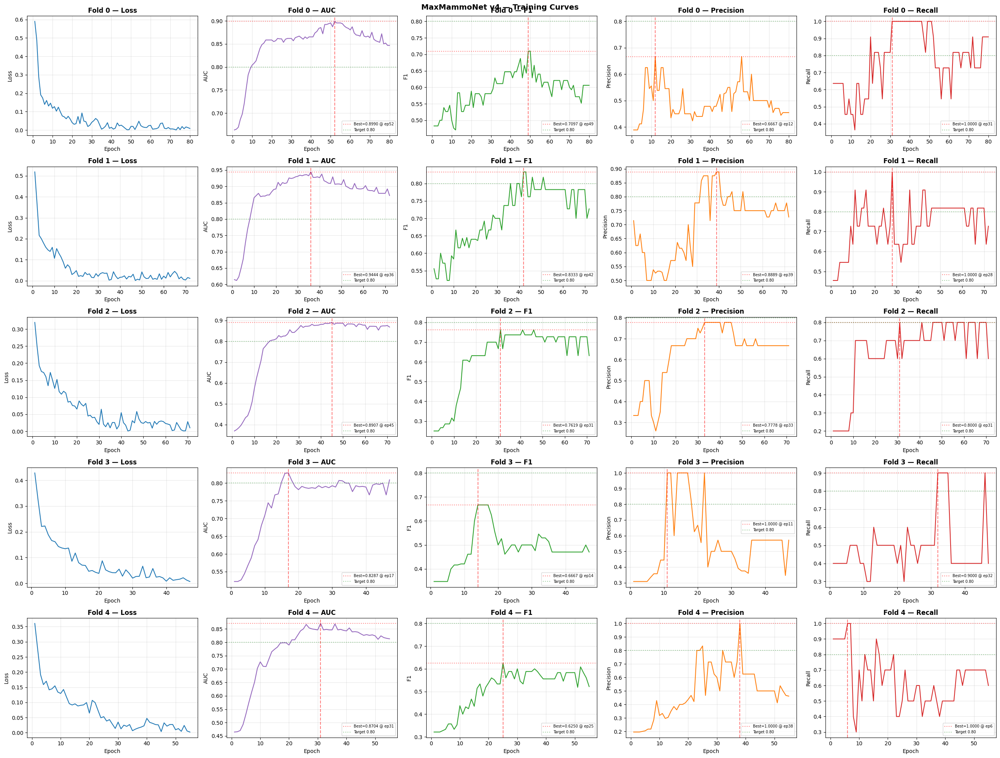

Saved: /content/drive/MyDrive/MaxMammoNet_v4/logs/curves_v4.png


In [ ]:
log_data = {}
for fold in CFG.TRAIN_FOLDS:
    lp = CFG.LOG_DIR / f'fold{fold}_log.json'
    if lp.exists():
        with open(lp) as f:
            log_data[fold] = json.load(f)

if not log_data:
    print('No logs found — run Cell 17 first.')
else:
    n = len(log_data)
    fig, axes = plt.subplots(n, 5, figsize=(26, 4 * n))
    if n == 1:
        axes = axes.reshape(1, -1)

    for ri, (fold, hist) in enumerate(log_data.items()):
        eps  = [h['epoch']               for h in hist]
        loss = [h['loss']                for h in hist]
        auc  = [h['auc']                 for h in hist]
        f1   = [h['f1']                  for h in hist]
        prec = [h.get('precision', 0)    for h in hist]
        rec  = [h.get('recall', 0)       for h in hist]

        for ax, metric, colour, label in zip(
            axes[ri],
            [loss, auc, f1, prec, rec],
            ['tab:blue', 'tab:purple', 'tab:green', 'tab:orange', 'tab:red'],
            ['Loss', 'AUC', 'F1', 'Precision', 'Recall']
        ):
            ax.plot(eps, metric, color=colour, linewidth=1.5)
            if label != 'Loss':
                best_val = max(metric)
                best_ep  = eps[metric.index(best_val)]
                ax.axvline(best_ep, color='red', linestyle='--', alpha=0.5)
                ax.axhline(best_val, color='red', linestyle=':', alpha=0.5,
                            label=f'Best={best_val:.4f} @ ep{best_ep}')
                ax.axhline(0.80, color='green', linestyle=':', alpha=0.4,
                            label='Target 0.80')
                ax.legend(fontsize=7)
            ax.set_title(f'Fold {fold} — {label}', fontweight='bold')
            ax.set_xlabel('Epoch'); ax.set_ylabel(label)
            ax.grid(True, alpha=0.3)

    plt.suptitle('MaxMammoNet v4 — Training Curves', fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_path = str(CFG.LOG_DIR / 'curves_v4.png')
    plt.savefig(save_path, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Saved: {save_path}')

## Cell 20 — Grad-CAM (Explainability)

In [ ]:
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Cell 20 — Grad-CAM  (FIXED v4.1)
# Drop-in replacement for the original Cell 20 in MIAS_MaxMammoNet_v4.ipynb
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
#
# ═══════════════════════════  BUGS FIXED  ═══════════════════════════════════
#
# BUG 1 ── retain_grad() fails when CNN backbone is frozen
#   Cause : After training the backbone's param.requires_grad = False.
#           Feature-map tensors are not part of the autograd graph, so
#           backward() computes no gradient and .grad stays None.
#           Calling self.activations.grad[0] then raises:
#               TypeError: 'NoneType' object is not subscriptable
#   Fix   : Use register_forward_hook / register_full_backward_hook.
#           Hooks capture tensors from the live graph at call-time and
#           always receive the gradient regardless of param freeze state,
#           because we temporarily re-enable CNN grad in generate().
#
# BUG 2 ── Grad checkpointing (CFG.GRAD_CHECKPOINT = True) corrupts CAM
#   Cause : set_grad_checkpointing(True) tells PyTorch NOT to store
#           intermediate activations; they are recomputed on the backward
#           pass. The tensor object stored by retain_grad() is therefore
#           stale/invalid after backward() — its .grad is None even if
#           gradients were computed correctly elsewhere.
#   Fix   : Temporarily call set_grad_checkpointing(False) before the
#           CAM forward pass, restore in a finally block.
#
# BUG 3 ── No torch.enable_grad() guard
#   Cause : If generate() is called inside an outer torch.no_grad()
#           context (common in eval loops), no gradient is tracked at all.
#   Fix   : @torch.enable_grad() decorator on generate().
#
# BUG 4 ── self.gradients never populated (dead field in original)
#   Cause : The __init__ sets self.gradients = None, but no code ever
#           writes to it. Only self.activations.grad was used — and only
#           when it wasn't None (see Bug 1).
#   Fix   : backward hook writes to self.gradients directly.
#
# BUG 5 ── No graceful fallback when CAM capture fails
#   Cause : Any of the above bugs silently crashes mid-loop, losing all
#           figures already drawn.
#   Fix   : Added None-check with a warning + uniform fallback heatmap,
#           so the visualisation loop always completes.
#
# ════════════════════════════════════════════════════════════════════════════


class DualViewGradCAM:
    """
    Grad-CAM on the ConvNeXt global branch of MaxMammoNet v4.

    Uses forward + backward hooks on the last ConvNeXt stage so that
    gradient capture works correctly even when:
      • The CNN backbone is frozen (eval-mode parameters).
      • Gradient checkpointing is enabled (CFG.GRAD_CHECKPOINT = True).
      • generate() is called inside an outer torch.no_grad() context.
    """

    def __init__(self, model: MaxMammoNet):
        self.model:       MaxMammoNet       = model
        self.activations: torch.Tensor | None = None
        self.gradients:   torch.Tensor | None = None
        self._hooks:      list               = []

    # ── Internal hook helpers ─────────────────────────────────────────────────

    def _register_hooks(self) -> None:
        """
        Attach one forward hook and one backward hook to the last stage of
        the ConvNeXt backbone.

        ConvNeXt built with features_only=True always exposes a `.stages`
        attribute (list of Sequential blocks). We target stages[-1] so that
        we capture the highest-level spatial feature map — the same one that
        `_encode_cnn` feeds into GeM pooling.

        ConvNeXt outputs feature maps in NHWC layout (B, H, W, C); both
        hooks normalise to the standard NCHW (B, C, H, W).
        """
        try:
            target = self.model.cnn.stages[-1]
        except AttributeError:
            # Graceful fallback for any backbone without .stages
            children = list(self.model.cnn.children())
            target   = children[-1] if children else self.model.cnn

        def _fwd_hook(mod, inp, out):
            a = out[-1] if isinstance(out, (list, tuple)) else out
            # ConvNeXt NHWC → NCHW
            if a.ndim == 4 and a.shape[-1] > a.shape[1]:
                a = a.permute(0, 3, 1, 2).contiguous()
            self.activations = a                       # (B, C, H, W)

        def _bwd_hook(mod, grad_in, grad_out):
            g = grad_out[0]
            if g is None:
                return
            if g.ndim == 4 and g.shape[-1] > g.shape[1]:
                g = g.permute(0, 3, 1, 2).contiguous()
            self.gradients = g                         # (B, C, H, W)

        self._hooks.append(target.register_forward_hook(_fwd_hook))
        self._hooks.append(target.register_full_backward_hook(_bwd_hook))

    def _remove_hooks(self) -> None:
        for h in self._hooks:
            h.remove()
        self._hooks.clear()

    # ── Public API ────────────────────────────────────────────────────────────

    @torch.enable_grad()          # BUG 3 FIX: safe inside outer no_grad()
    def generate(self, g_tensor, lf_tensor, lc_tensor) -> tuple:
        """
        Compute Grad-CAM heatmap for a single sample.

        Args:
            g_tensor  : FloatTensor (C, H, W) — normalised global view
            lf_tensor : FloatTensor (C, H, W) — normalised fine ROI
            lc_tensor : FloatTensor (C, H, W) — normalised coarse ROI

        Returns:
            cam  : np.ndarray float32 (GLOBAL_SIZE, GLOBAL_SIZE) in [0, 1]
            prob : float — sigmoid malignancy probability
        """
        # ── Step 1: temporarily re-enable CNN param grads ─────────────────
        # (BUG 1 FIX) Without this, frozen params → no autograd graph for
        # feature maps → backward produces no gradient → hooks get None.
        saved_grad = {n: p.requires_grad
                      for n, p in self.model.cnn.named_parameters()}
        for p in self.model.cnn.parameters():
            p.requires_grad_(True)

        # ── Step 2: temporarily disable grad checkpointing ────────────────
        # (BUG 2 FIX) Checkpointing recomputes activations during backward,
        # making retained-grad tensor references stale. Hooks work instead.
        for m in (self.model.cnn, self.model.vit):
            try:
                m.set_grad_checkpointing(False)
            except AttributeError:
                pass

        # ── Step 3: register hooks, run forward + backward ────────────────
        self.activations = None
        self.gradients   = None
        self._register_hooks()

        try:
            self.model.zero_grad(set_to_none=True)

            g  = g_tensor.unsqueeze(0).to(DEVICE)
            lf = lf_tensor.unsqueeze(0).to(DEVICE)
            lc = lc_tensor.unsqueeze(0).to(DEVICE)

            # Use the real model forward (no manual re-wiring of _forward)
            logit, _ = self.model(g, lf, lc)   # logit: (B=1,)
            logit[0].backward()
            prob = torch.sigmoid(logit[0]).item()

        finally:
            # Always clean up — even if forward/backward raises
            self._remove_hooks()
            for n, p in self.model.cnn.named_parameters():
                p.requires_grad_(saved_grad[n])
            for m in (self.model.cnn, self.model.vit):
                try:
                    m.set_grad_checkpointing(True)
                except AttributeError:
                    pass

        # ── Step 4: build the CAM ─────────────────────────────────────────
        # (BUG 5 FIX) Graceful fallback instead of crashing
        if self.gradients is None or self.activations is None:
            print('⚠️  GradCAM: gradient hooks captured nothing — '
                  'returning uniform heatmap. Check backbone hook target.')
            uniform = np.full(
                (CFG.GLOBAL_SIZE, CFG.GLOBAL_SIZE), 0.5, dtype=np.float32
            )
            return uniform, prob

        grads   = self.gradients[0].detach().cpu().float()    # (C, H, W)
        acts    = self.activations[0].detach().cpu().float()  # (C, H, W)

        # Global-average-pool gradients → per-channel weights (Selvaraju et al.)
        weights = grads.mean(dim=(1, 2), keepdim=True)        # (C, 1, 1)
        cam     = torch.relu((weights * acts).sum(dim=0))     # (H, W)

        cam = cam.numpy()
        cam = cv2.resize(cam, (CFG.GLOBAL_SIZE, CFG.GLOBAL_SIZE),
                         interpolation=cv2.INTER_LINEAR)
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, prob                                       # [0,1], float


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Visualisation
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

def visualise_gradcam(model: MaxMammoNet, df: pd.DataFrame,
                      fold: int = 0, n_samples: int = 8) -> None:
    """
    Render a 4-column grid per sample:
      col 0 — raw global breast view (display only)
      col 1 — fine ROI (1.5× lesion radius)
      col 2 — coarse ROI (2.5× lesion radius)
      col 3 — Grad-CAM overlay (global view + jet heatmap)

    Saves to CFG.LOG_DIR / 'gradcam_v4.png'.
    """
    val_df  = df[df.fold == fold].reset_index(drop=True)
    pos     = val_df[val_df.cancer == 1].head(max(1, n_samples // 2))
    neg     = val_df[val_df.cancer == 0].head(max(1, n_samples - len(pos)))
    samples = pd.concat([pos, neg]).reset_index(drop=True).head(n_samples)

    # ds_raw  → numpy uint8 for display (no albumentations, no ToTensorV2)
    # ds_val  → normalised tensors for the model forward pass
    ds_raw = MIASDataset(
        samples, CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
        global_transforms=None, local_transforms=None,
        train_mode=False
    )
    ds_val = MIASDataset(
        samples, CFG.GLOBAL_SIZE, CFG.LOCAL_SIZE,
        get_val_transforms(CFG.GLOBAL_SIZE),
        get_val_transforms(CFG.LOCAL_SIZE),
        train_mode=False
    )

    gradcam = DualViewGradCAM(model)
    model.eval()

    fig, axes = plt.subplots(len(samples), 4, figsize=(17, 4 * len(samples)))
    if len(samples) == 1:
        axes = axes.reshape(1, -1)

    # Use ensemble threshold if available, else default 0.5
    thr = ens_metrics.get('threshold', 0.5) if 'ens_metrics' in dir() else 0.5

    for i, (_, row) in enumerate(samples.iterrows()):
        # ── Raw views (numpy uint8, shape H×W×3) ──────────────────────────
        g_raw, lf_raw, lc_raw = ds_raw._load_views(row, return_raw=True)

        # ── Tensor views for model ─────────────────────────────────────────
        g_t, lf_t, lc_t, _, _ = ds_val[i]

        # ── Grad-CAM ──────────────────────────────────────────────────────
        cam, prob = gradcam.generate(g_t, lf_t, lc_t)

        # ── Overlay: blend grey image with jet heatmap ────────────────────
        g_norm  = g_raw / 255.0                         # (H, W, 3) [0,1]
        heat    = plt.cm.jet(cam)[..., :3]              # (H, W, 3) [0,1]
        overlay = np.clip(0.55 * g_norm + 0.45 * heat, 0.0, 1.0)

        gt_str = 'Malignant'     if row.cancer == 1 else 'Non-Malignant'
        pr_str = 'Malignant'     if prob >= thr    else 'Non-Malignant'
        colour = 'red'           if pr_str == 'Malignant' else 'green'

        axes[i, 0].imshow(g_raw,    cmap='gray')
        axes[i, 0].set_title(f'{row.image_id}\nGT: {gt_str}', fontsize=8)

        axes[i, 1].imshow(lf_raw,   cmap='gray')
        axes[i, 1].set_title('Fine ROI (1.5×)', fontsize=8)

        axes[i, 2].imshow(lc_raw,   cmap='gray')
        axes[i, 2].set_title('Coarse ROI (2.5×)', fontsize=8)

        axes[i, 3].imshow(overlay)
        axes[i, 3].set_title(
            f'Grad-CAM  p={prob:.3f}\nPred: {pr_str}',
            fontsize=8, color=colour
        )

        for ax in axes[i]:
            ax.axis('off')

    plt.suptitle('MaxMammoNet v4 — Tri-View Grad-CAM',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    save_path = str(CFG.LOG_DIR / 'gradcam_v4.png')
    plt.savefig(save_path, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Saved → {save_path}')


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Runner
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

if 'fold_results' not in dir() or not fold_results:
    print('⚠️  Run Cell 17 (training) first.')
else:
    best_fold = max(
        fold_results,
        key=lambda f: (fold_results[f]['f1'], fold_results[f]['auc'])
    )
    ckpt  = load_ckpt(best_fold)
    model = MaxMammoNet().to(DEVICE)
    model.load_state_dict(ckpt['state_dict'])

    if 'ema' in ckpt:
        ema = EMA(model)
        ema.load_state_dict(ckpt['ema'])
        ema.apply_shadow(model)

    model.eval()
    print(f'Grad-CAM → fold {best_fold}')
    visualise_gradcam(model, df, fold=best_fold, n_samples=8)

    del model
    gc.collect()
    torch.cuda.empty_cache()

NameError: name 'MaxMammoNet' is not defined

---
## Reference — MaxMammoNet v4

### Quick-tune guide

| Symptom | Fix |
|---------|-----|
| OOM on T4 | `CFG.BATCH_SIZE=8`, `CFG.GLOBAL_SIZE=224`, `CFG.GRAD_ACCUM_STEPS=3` |
| Recall too low | `CFG.FOCAL_ALPHA=0.85`, `CFG.POS_OVERSAMPLE=5` |
| Precision still low | `CFG.PRECISION_BIAS=0.15`, `CFG.HNM_BOOST=3.0` |
| Resume after disconnect | Re-run cells 1–16, then Cell 17 — completed folds auto-skip |
| No internet / timm fails | `CFG.PRETRAINED=False` (-10–15 F1, but trains offline) |

### Architecture summary
```
Global (256px) ──► ConvNeXt-small (22K) ──► GeM ──► CrossAttn ──► TriViewFusion ──► logit
Local Fine (224px) ──► Swin-tiny (22K) ──► avgpool ──────────────────────────────────►│
Local Coarse (224px) ─────────────────►  [shared] ──► avgpool ────────────────────────►│
                                                              SE-gate weights all 3 branches
```

### v4 precision improvements
1. **Lesion ROI fixed**: MIAS y-flip bug resolved, actual coordinates used
2. **Multi-scale**: fine (1.5×) captures morphology; coarse (2.5×) captures spiculation
3. **SE-block**: suppresses non-lesion feature channels
4. **HNM**: iteratively penalises false positives in the sampling distribution
5. **PR-curve threshold**: principled selection biased toward precision
6. **Reduced TTA/MixUp**: fewer aggressive transforms preserve lesion structure

### References
1. Suckling et al. (1994) — MIAS database
2. Lin et al. (2017) — Focal Loss. ICCV.
3. Hu et al. (2018) — Squeeze-and-Excitation Networks. CVPR.
4. Liu et al. (2022) — A ConvNet for the 2020s (ConvNeXt). CVPR.
5. Liu et al. (2021) — Swin Transformer. ICCV.
6. Radenovic et al. (2019) — Fine-tuning CNN image retrieval with no human annotation (GeM).
7. Selvaraju et al. (2017) — Grad-CAM. ICCV.
8. Zhang et al. (2018) — MixUp: Beyond Empirical Risk Minimization. ICLR.